# CGMF Summary File Analysis Tool and Sensitivity Coefficient Calculator

### Austin Carter, LANL, University of Michigan

In [1]:
import numpy as np
import scipy as sp
import scipy.optimize as opt
import os
from statistics import *
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import sympy as sym
from sympy.interactive import printing
printing.init_printing(use_latex = 'mathjax')
from IPython.display import display, Math, Latex
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from matplotlib.pyplot import cm
import pylab as pl
from scipy.stats import chisquare
%matplotlib inline

In [2]:
### rcParams are the default parameters for matplotlib
import matplotlib as mpl

print ("Matplotbib Version: ", mpl.__version__)

mpl.rcParams['font.size'] = 18
mpl.rcParams['font.family'] = 'Helvetica', 'serif'
#mpl.rcParams['font.color'] = 'darkred'
mpl.rcParams['font.weight'] = 'normal'

mpl.rcParams['axes.labelsize'] = 18.
mpl.rcParams['xtick.labelsize'] = 18.
mpl.rcParams['ytick.labelsize'] = 18.
mpl.rcParams['lines.linewidth'] = 2.

font = {'family' : 'serif',
        'color'  : 'darkred',
        'weight' : 'normal',
        'size'   : 18,
        }

mpl.rcParams['xtick.major.pad']='10'
mpl.rcParams['ytick.major.pad']='10'

mpl.rcParams['image.cmap'] = 'inferno'

Matplotbib Version:  2.0.2


In [3]:
param_labels = [r'$w_{S2}$', r'$w_{S1}$', r'$w_{SL}$',
               r'$d_{min}^{S2}$', r'$d_{min}^{S1}$', r'$d_{min}^{SL}$',
               r'$d_{max}^{S2}$', r'$d_{max}^{S1}$', r'$d_{max}^{SL}$',
               r'$d_{dec}^{S2}$', r'$d_{dec}^{S1}$', r'$d_{dec}^{SL}$',
               r'$\overline{A}_{S2}$', r'$\overline{A}_{S1}$', 
               r'$\sigma_{\overline{A}}^{S2}$', r'$\sigma_{\overline{A}}^{S1}$', r'$\sigma_{\overline{A}}^{SL}$']

response_labels = [r'$\left \langle TXE \right \rangle$', 
                   r'$\sigma_{\left \langle TXE \right \rangle}$',
                   r'$\left \langle TKE \right \rangle$', 
                   r'$\sigma_{\left \langle TKE \right \rangle}$',
                   r'$\left \langle J \right \rangle$', 
                   r'$\sigma_{\left \langle J \right \rangle}$',
                   r'$\overline{\nu}$', 
                   r'$\left \langle \nu(\nu-1) \right \rangle$',
                   r'$\left \langle \nu(\nu-1)(\nu-2) \right \rangle$',
                   r'$\overline{N}_{\gamma}$', 
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$',
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$',
                   r'$\overline{E}_{n}^{CM}$',
                   r'$\sigma_{\overline{E}_{n}}^{CM}$',
                   r'$\overline{E}_{\gamma}^{CM}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{CM}$',
                   r'$\overline{E}_{n}^{Lab}$',
                   r'$\sigma_{\overline{E}_{n}}^{Lab}$',
                   r'$\overline{E}_{\gamma}^{Lab}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{Lab}$']

In [4]:

DATAPATHbase = '/home/austinlc/Documents/SensitivityData2'

param_keys = ['w0', 'w1','w2', 'dmin0', 'dmin1', 'dmin2', 'dmax0', 'dmax1', 'dmax2', 'ddec0', 'ddec1', 'ddec2', 
       'Abar0', 'Abar1', 'sigA0', 'sigA1', 'sigA2']

Rdata = {}
for k in param_keys:
    
    Rdata[k] = {}
    
    # parameter array: 3rd column
    Rdata[k][k] = []
    
    DATAPATH = os.path.join(DATAPATHbase,k)
    SummaryFileName = 'summary_{}.txt'.format(k)
    SummaryFilePath = os.path.join(DATAPATH, SummaryFileName)
    
    SummaryFile = open(SummaryFilePath, 'r')
    
    #skip first four lines
    for i in range(4): SummaryFile.readline()
    
    #responses
    line = SummaryFile.readline()
    line = line.split()
    response_keys = []
    
    # offset of 4: "# [space] Hist" counts for 2 indices
    for i in range(4, len(line)):
        response_keys.append(line[i])
        if(response_keys[i-4] == '1sig'):
            response_keys[i-4] = line[i-1] + response_keys[i-4]
        Rdata[k][response_keys[i-4]] = []
    
    #skip dashed line
    SummaryFile.readline()
    
    #gather data
    while True:
        
        line = SummaryFile.readline()
        if (len(line)==0):
            break
        line = line.split()
        Rdata[k][k].append(float(line[2]))
        
        # use 3 this time: 3rd column starts response data
        for i in range(3, len(line)):
            Rdata[k][response_keys[i-3]].append(float(line[i]))
    
    SummaryFile.close()
print(response_keys)

['<TXE>', '<TXE>1sig', '<TKE>', '<TKE>1sig', '<J>', '<J>1sig', '<nn>', 'n-mom2', 'n-mom3', '<ng>', 'g-mom2', 'g-mom3', '<En>CM', '<En>CM1sig', '<Eg>CM', '<Eg>CM1sig', '<En>Lab', '<En>Lab1sig', '<Eg>Lab', '<Eg>Lab1sig']


In [5]:
# move on to calculating the sensitivity coefficients

def get_SRx(x_arr, R_arr, x, R):
    fit = np.polyfit(x_arr, R_arr,1)
    dRdx = fit[0]
    SRx = x/R * dRdx
    return SRx

def test_SRx(x_arr, R_arr, x, R, param_name, response_name):
    # MAIN QUESTION: IS THE CORRELATION BETWEEN RESPONSE AND PARAMETER LINEAR
    fit = np.polyfit(x_arr, R_arr,1)
    print(fit)
    dRdx = fit[0]
    SRx = x/R * dRdx
    fittedR = []
    for i in range(len(x_arr)):
        fittedR.append(dRdx * x_arr[i] + fit[1])
    chi2 = chisquare(R_arr, fittedR)[0] / len(x_arr)
    if (np.abs(chi2) >= 0.1):
        print("BAD LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1f}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        
        if (response_name == r'$\left \langle TKE \right \rangle$'):
            if (min(R_arr) < 184.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'k-.', label = 'Lower Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'r--', label = 'Upper Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 188.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'r--', label = 'Upper Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'k-.', label = 'Lower Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                
        if (response_name == r'$\overline{\nu}$'):
            if (min(R_arr) < 3.6):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'k-.', label = 'Lower Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'r--', label = 'Upper Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 3.9):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'r--', label = 'Upper Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'k-.', label = 'Lower Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
        
        
        
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        plt.show()
    else:
        print("ACCEPTABLE LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1E}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        
        if (response_name == r'$\left \langle TKE \right \rangle$'):
            if (min(R_arr) < 184.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'k-.', label = 'Lower Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'r--', label = 'Upper Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 188.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'r--', label = 'Upper Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'k-.', label = 'Lower Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                
        if (response_name == r'$\overline{\nu}$'):
            if (min(R_arr) < 3.6):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'k-.', label = 'Lower Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'r--', label = 'Upper Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 3.9):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'r--', label = 'Upper Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'k-.', label = 'Lower Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
        
                
        
        lg = plt.legend(numpoints=1,fontsize=16, loc='best')
        lg.draw_frame(False)
        plt.show()

[  5.09367976  29.21197255]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 7.0E-05


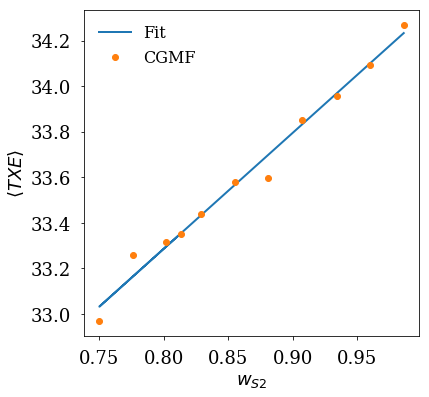

[  0.53675065  10.25223874]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.3E-04


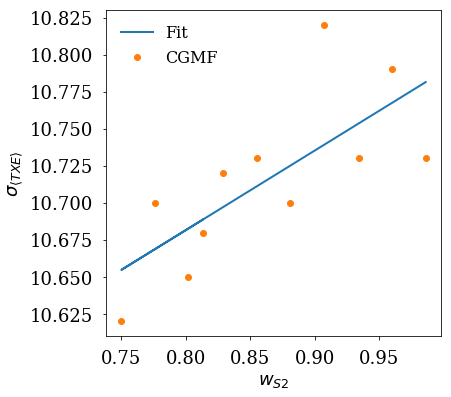

[ -14.42203697  196.47994518]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 7.2E-06


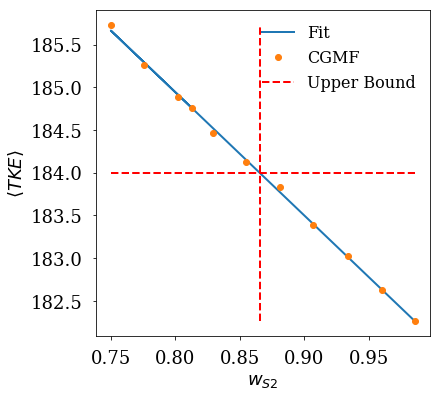

[ -5.99651112  16.07135273]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 3.9E-04


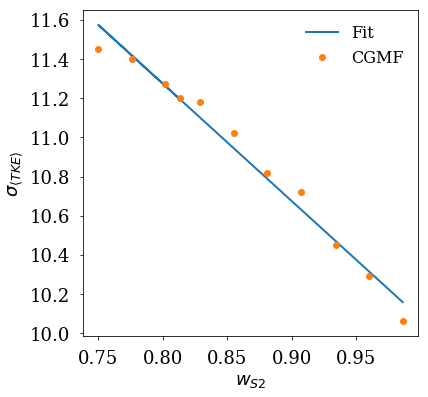

[  0.72712939  10.24194188]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.5E-05


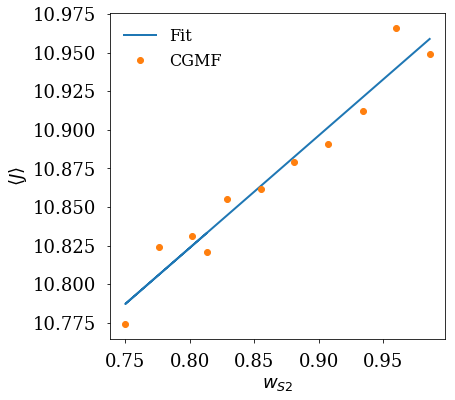

[ 0.393455    5.76190288]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.8E-05


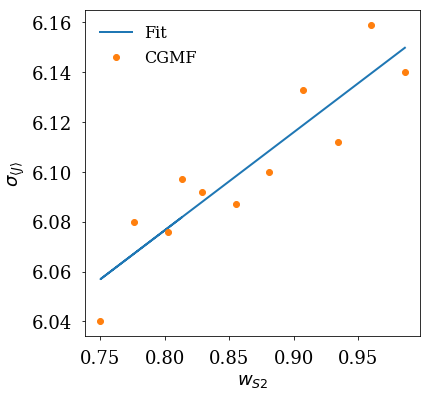

[ 0.85811332  3.18826639]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{\nu}$. 
chi^2/dof = 1.3E-05


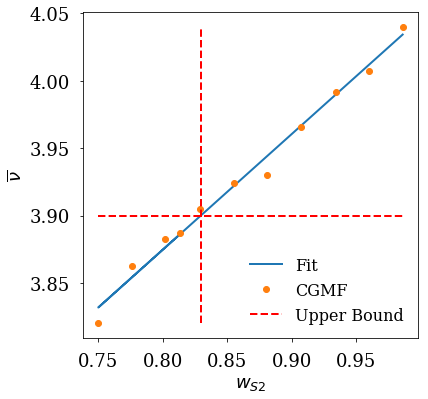

[ 5.84293334  8.4452758 ]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.8E-04


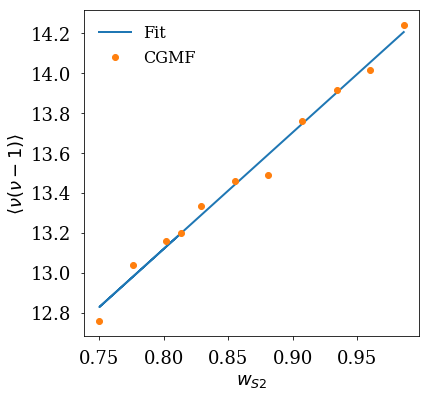

[ 25.08876514  18.09575932]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.3E-03


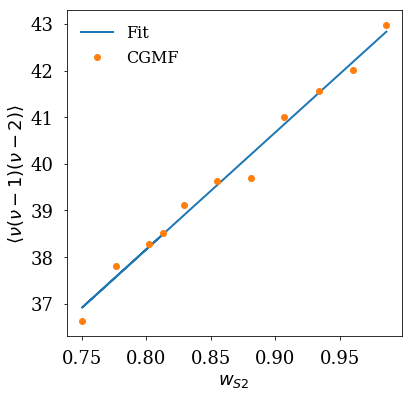

[ 1.12814922  8.44786177]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 3.1E-05


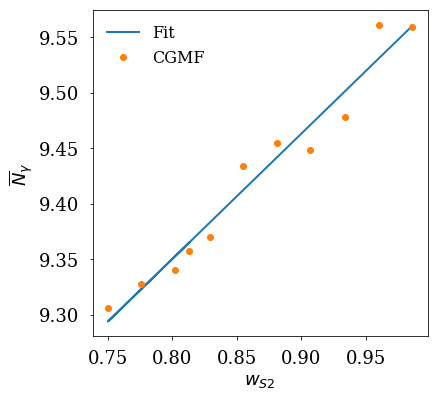

[ 20.94147741  75.66377773]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.4E-03


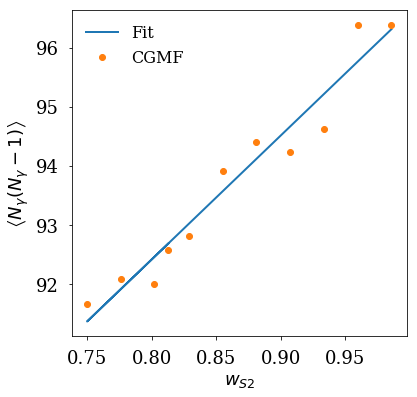

[ 309.25710356  713.50657417]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 4.3E-02


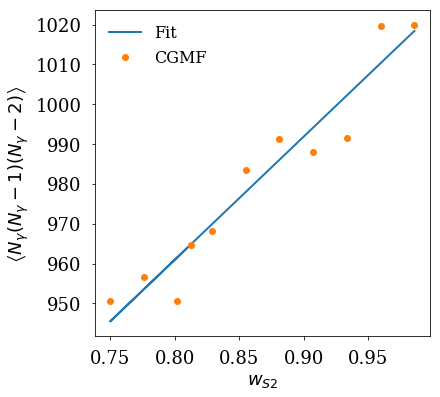

[-0.07955651  1.95547545]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.5E-06


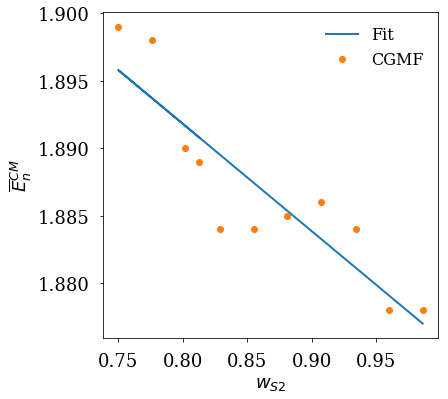

[-0.07799658  1.65431105]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.3E-05


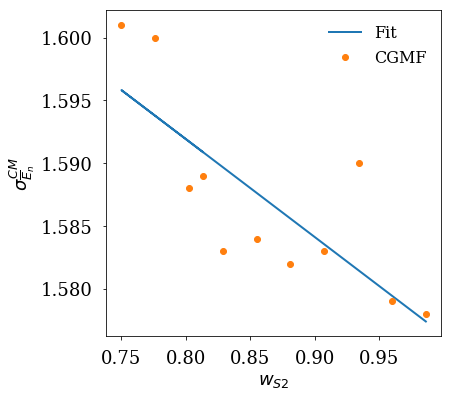

[-0.06984468  0.95591232]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 3.4E-06


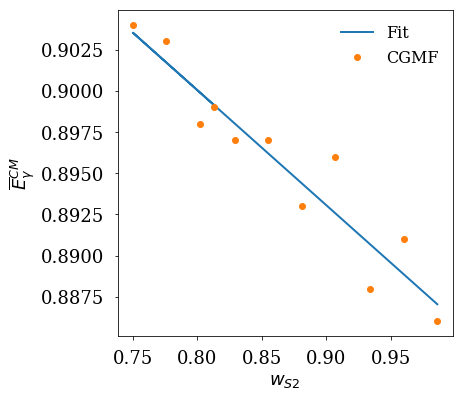

[-0.0638381  0.9239741]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 9.2E-06


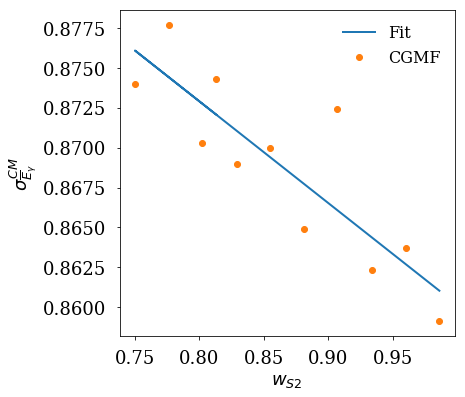

[-0.07870106  2.18028265]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.8E-06


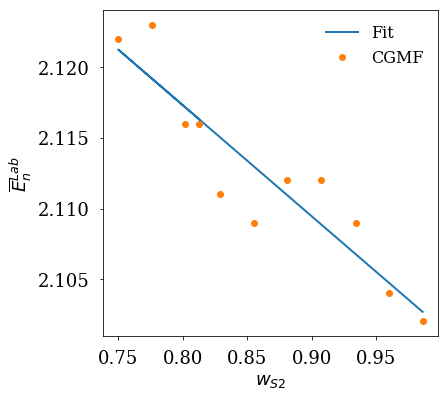

[-0.07455802  1.69579812]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 7.2E-06


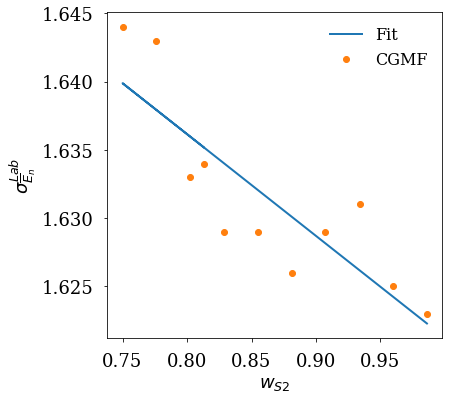

[-0.07917072  0.79741524]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.7E-06


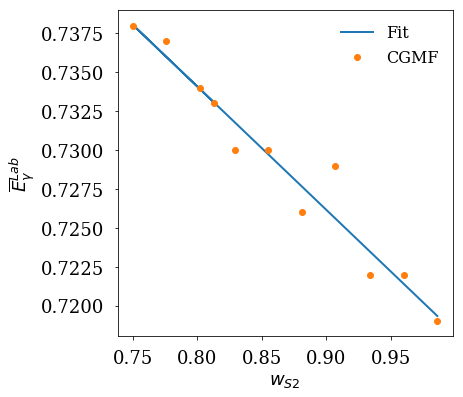

[-0.08214298  0.89779848]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 7.2E-06


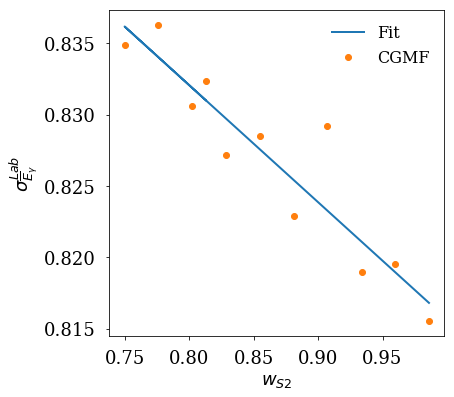

[ -4.7623221   34.16786599]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 5.2E-05


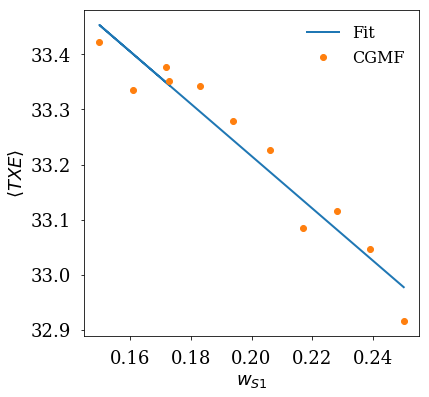

[ -0.94681648  10.86067566]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 7.7E-05


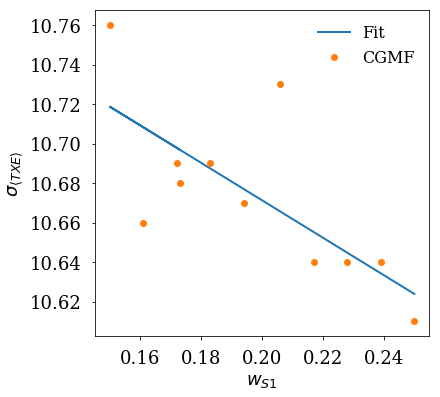

[  13.9310695   182.35543509]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.0E-05


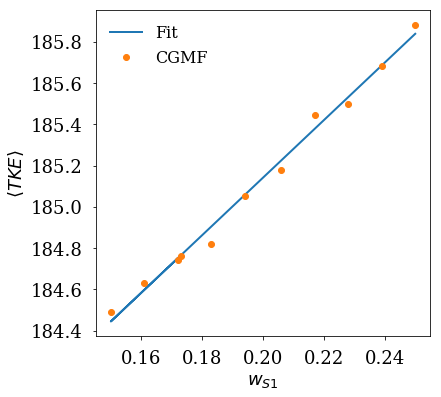

[  4.19084478  10.49120857]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 4.6E-05


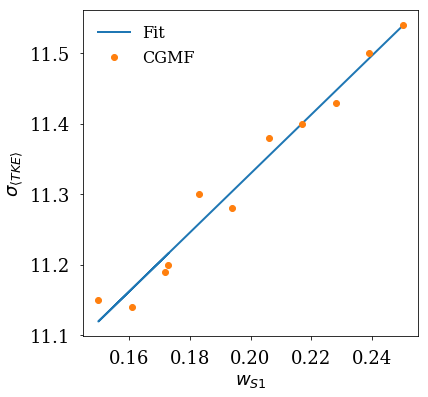

[ -0.54577611  10.91854286]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 4.1E-05


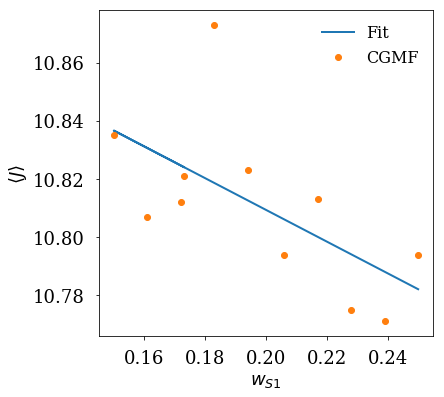

[-0.54674157  6.17782449]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.2E-05


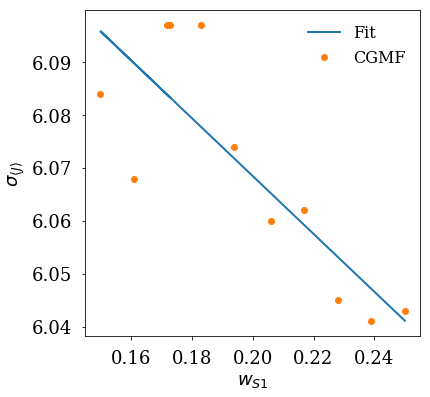

[-0.81987516  4.02750806]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{\nu}$. 
chi^2/dof = 3.4E-06


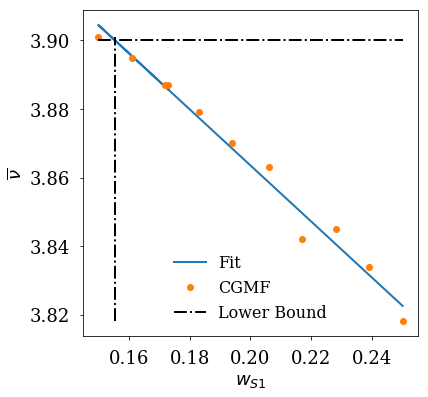

[ -5.57769455  14.16012093]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 4.5E-05


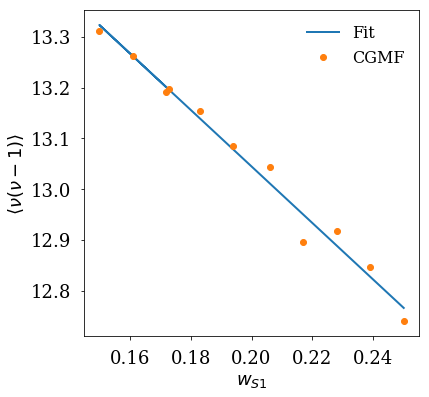

[-24.04818144  42.66506348]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 5.0E-04


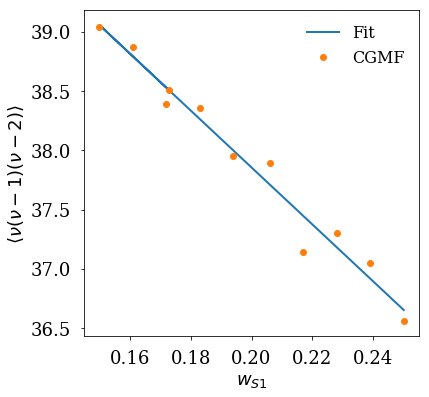

[-1.04575947  9.53967594]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.6E-05


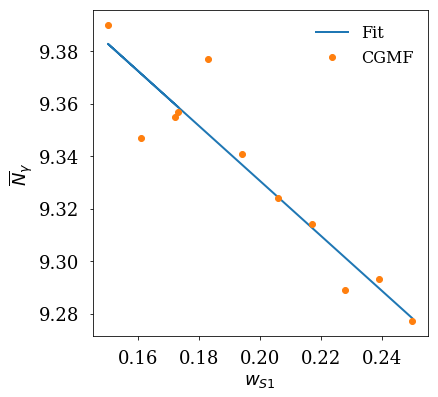

[-19.34012484  95.90037194]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.0E-03


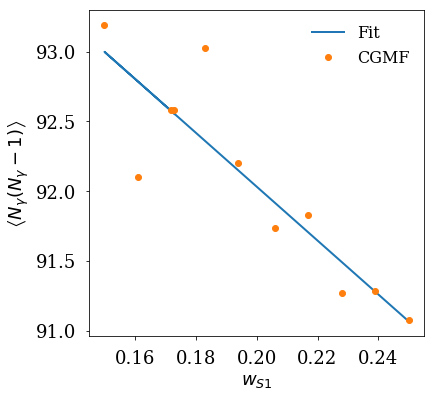

[ -282.54789846  1011.87332576]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 3.6E-02


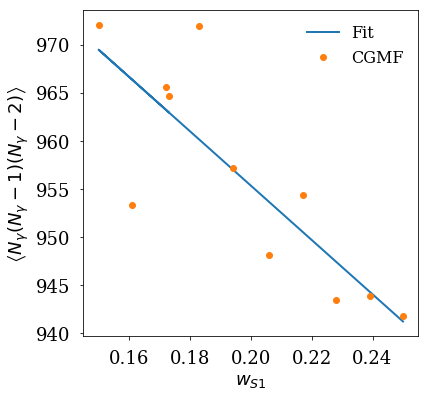

[ 0.10831461  1.87142112]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.1E-06


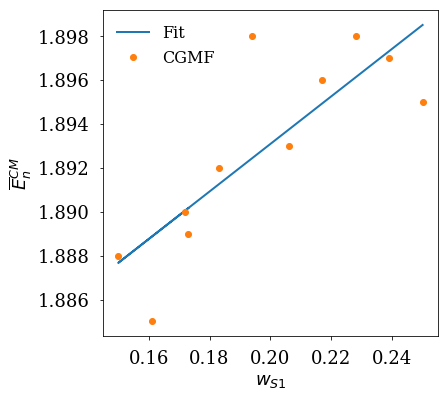

[ 0.1022139   1.57089902]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 5.0E-06


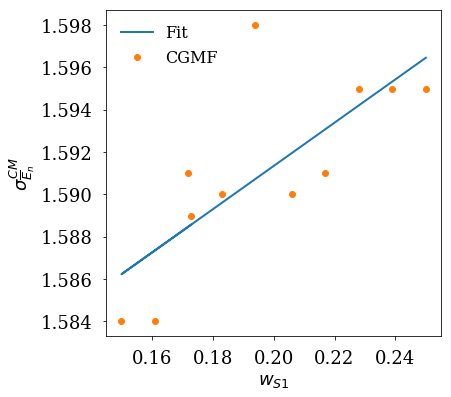

[ 0.0745568   0.88554437]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 3.8E-06


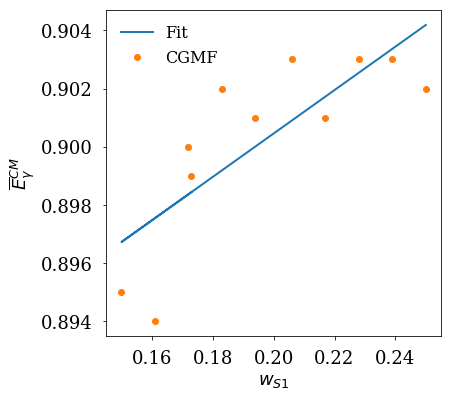

[ 0.04273658  0.86445758]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 6.4E-06


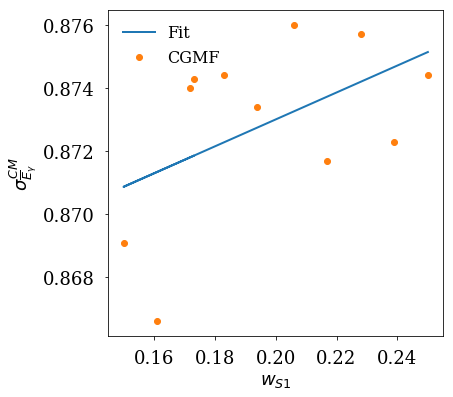

[ 0.09802747  2.10018057]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.9E-06


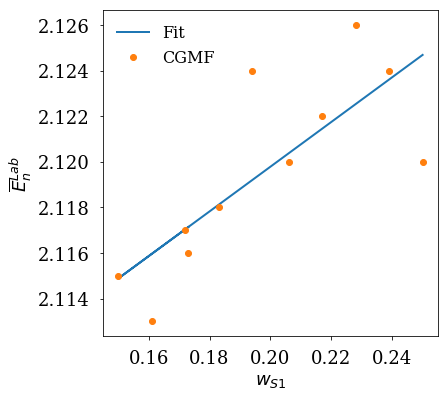

[ 0.07420724  1.62124979]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 6.4E-06


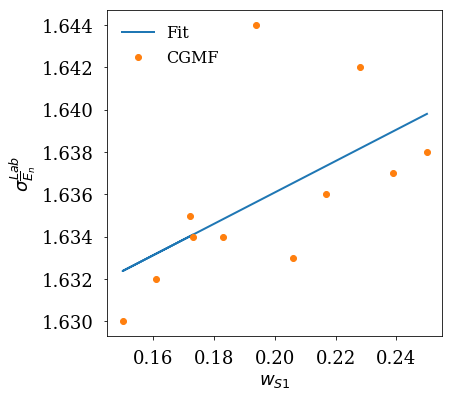

[ 0.07464836  0.71952628]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.1E-06


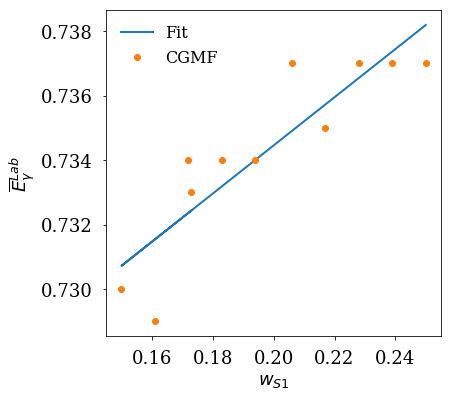

[ 0.06318519  0.81950896]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 4.9E-06


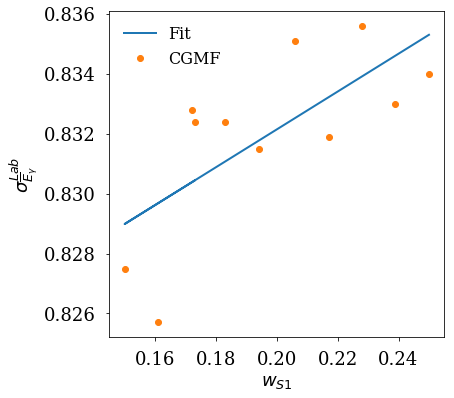

[ 19.37334472  32.97802093]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 9.9E-05


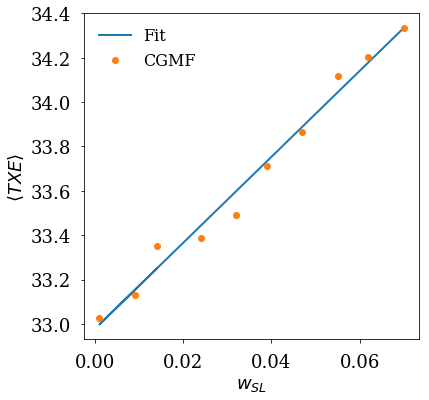

[ 15.22487338  10.42356197]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 8.0E-05


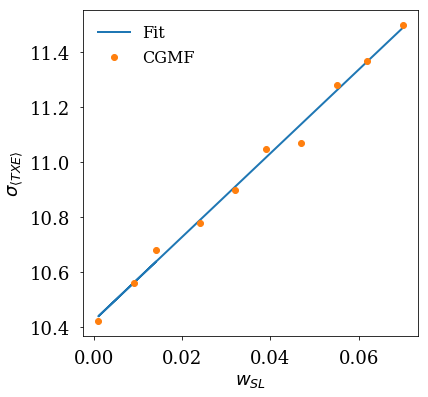

[ -23.26510852  185.22045833]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.6E-05


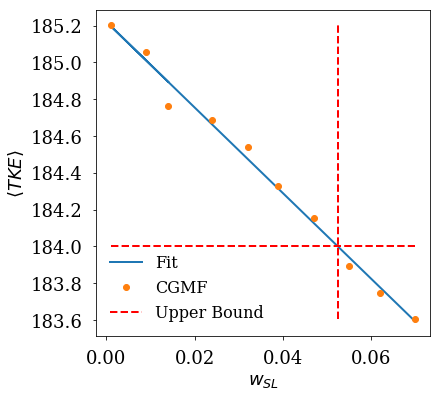

[  6.62679766  11.10007404]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 2.3E-05


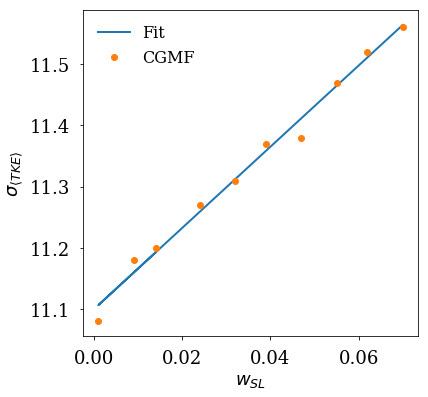

[  1.41008116  10.80452413]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.2E-05


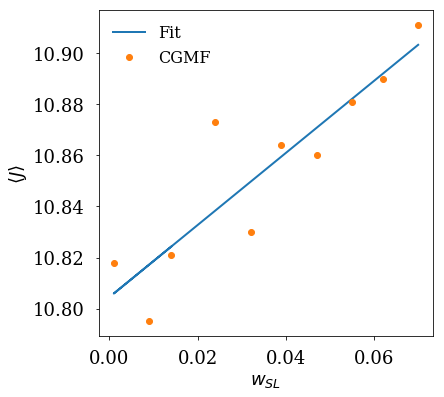

[ 0.81292081  6.0675039 ]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.6E-05


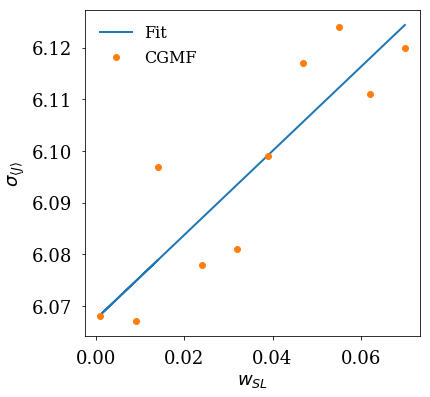

[ 1.98386933  3.84466941]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{\nu}$. 
chi^2/dof = 1.3E-05


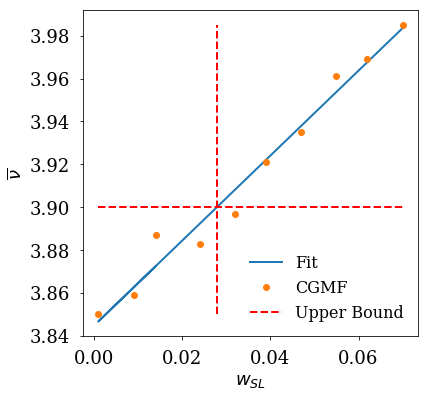

[ 15.59118     12.87903135]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.7E-04


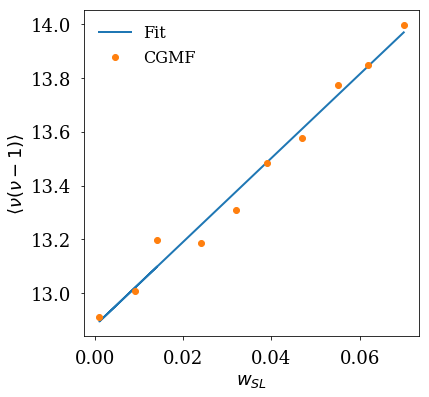

[ 77.99727426  36.93489622]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.4E-03


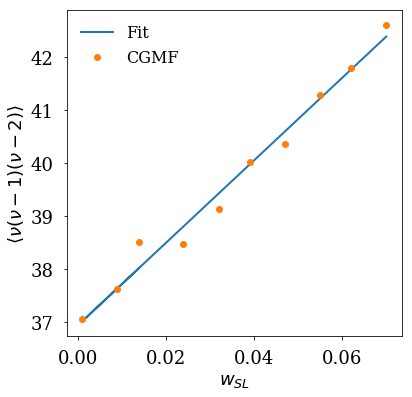

[ 1.54356095  9.3444123 ]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.2E-05


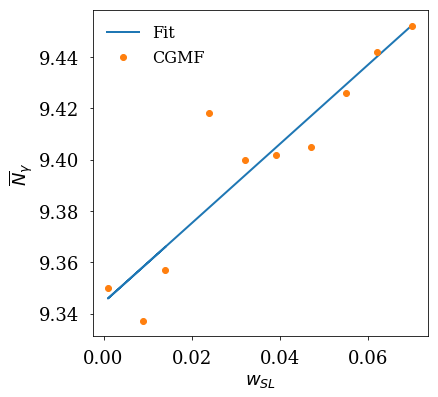

[ 30.36179085  92.27002878]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 7.9E-04


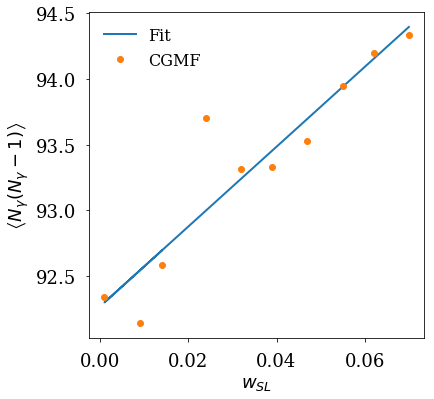

[ 480.55186021  958.28951933]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.9E-02


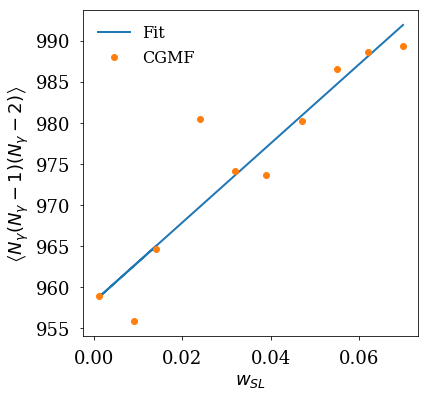

[ 0.37775879  1.88496511]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.1E-06


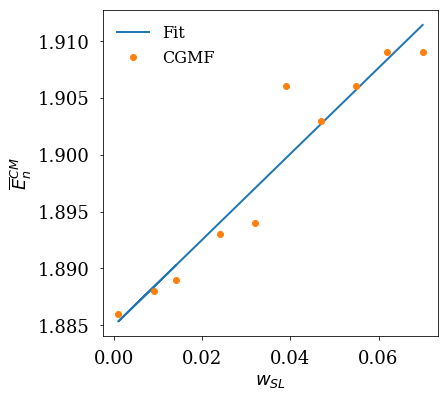

[ 0.34795875  1.58451706]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 6.8E-06


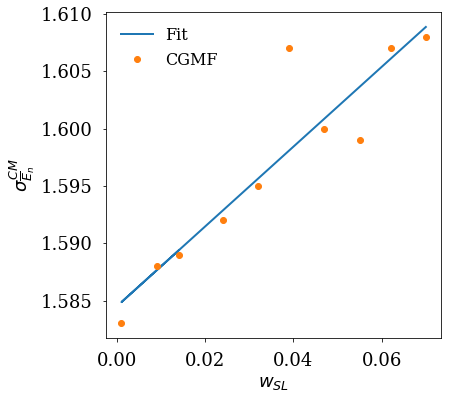

[ 0.31490409  0.89418389]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.8E-06


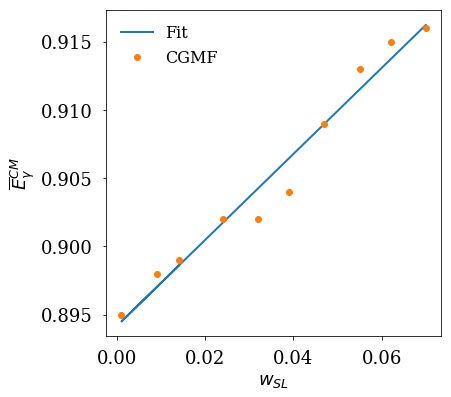

[ 0.43055674  0.86378135]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 8.0E-06


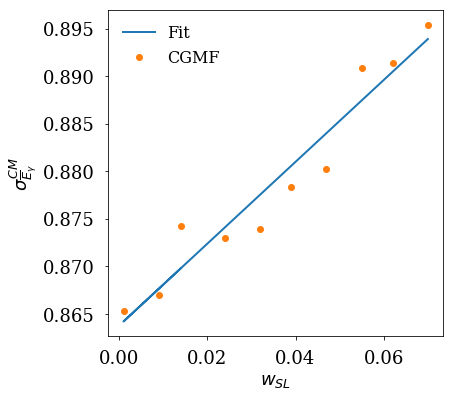

[ 0.30036004  2.11219729]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.4E-06


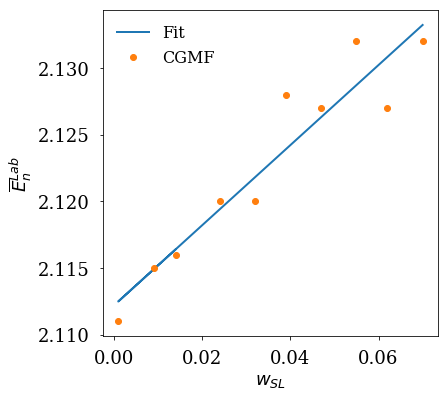

[ 0.35660381  1.62871189]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 5.8E-06


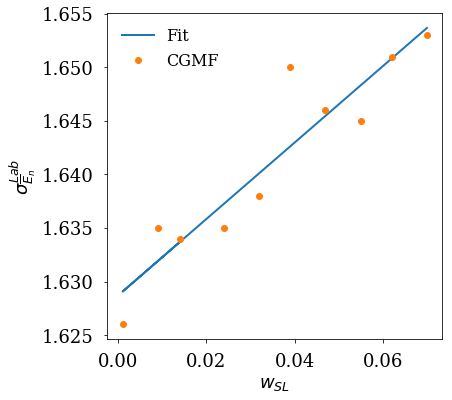

[ 0.20644413  0.72941252]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.4E-06


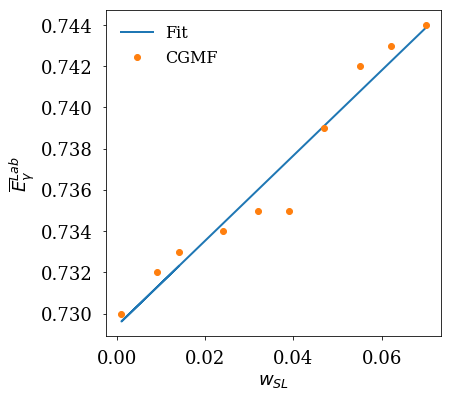

[ 0.35303798  0.82414776]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 6.9E-06


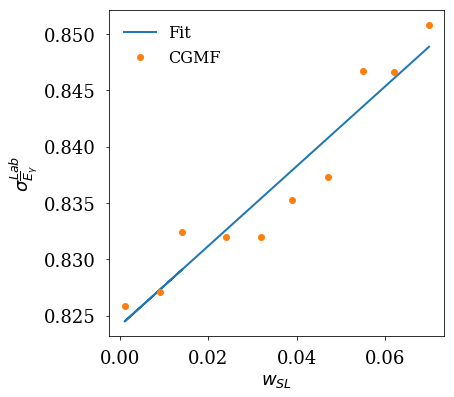

[  0.09531091  32.03905125]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.6E-04


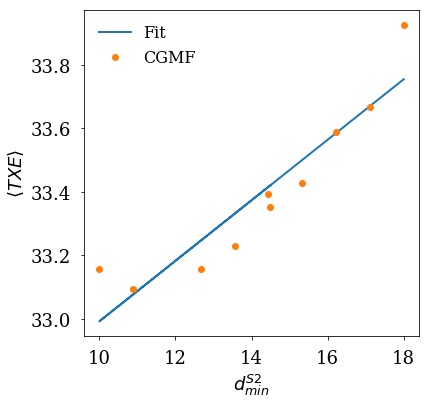

[ -0.74444679  21.31902126]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 2.8E-03


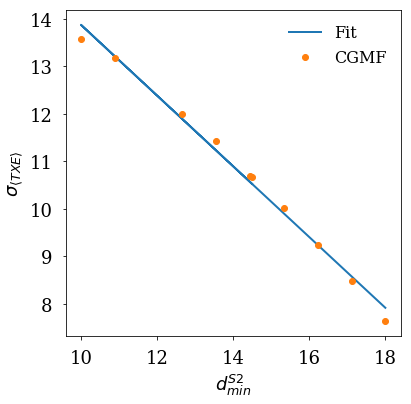

[ -9.28971701e-02   1.86049901e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 5.4E-05


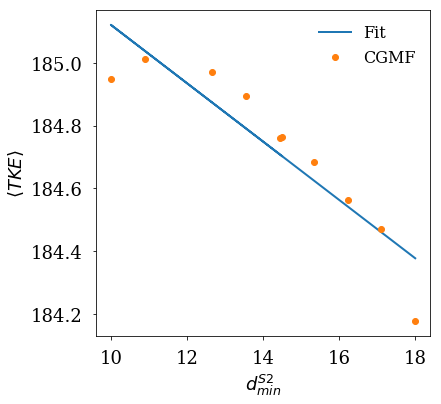

[ -0.69548391  21.19493768]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.4E-03


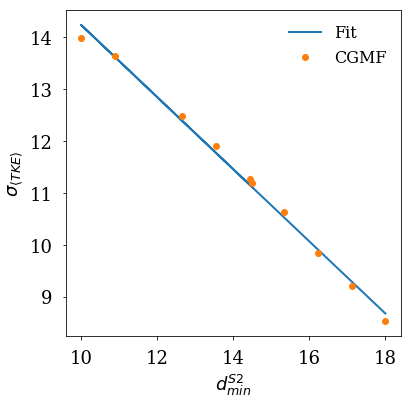

[  0.01785081  10.57393865]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 5.4E-05


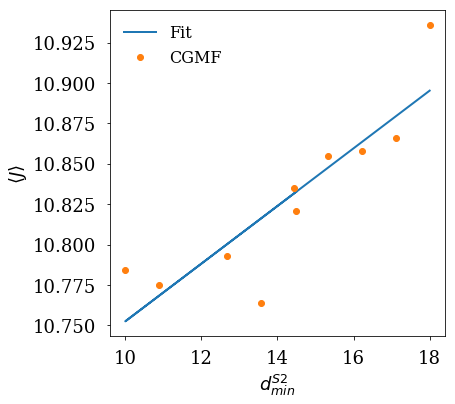

[ -1.43552860e-03   6.10178743e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 4.1E-05


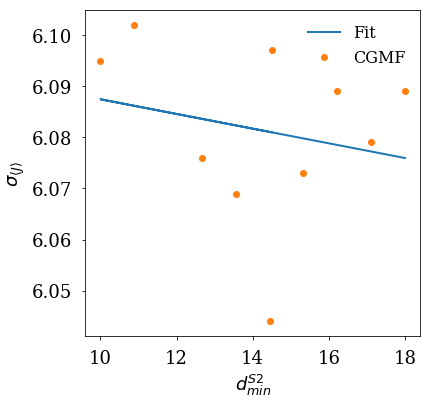

[ 0.02289944  3.56188601]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 5.2E-05


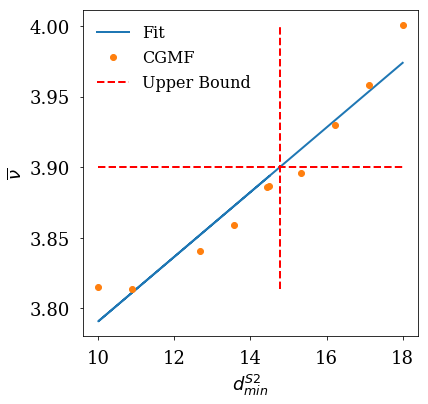

[ -0.09735401  14.65990722]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 6.7E-04


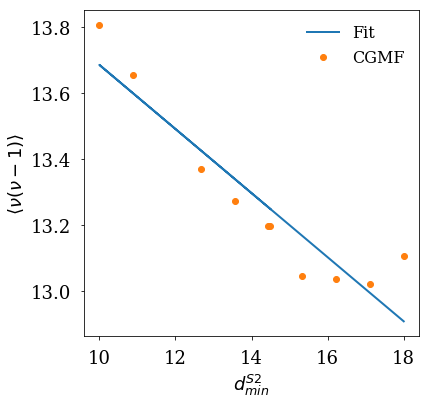

[ -1.46997496  59.75824167]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.0E-03


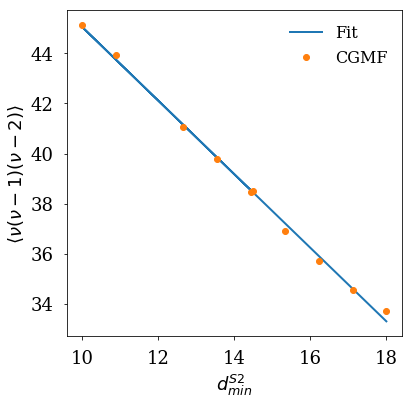

[ -2.35494635e-03   9.39920909e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 8.4E-06


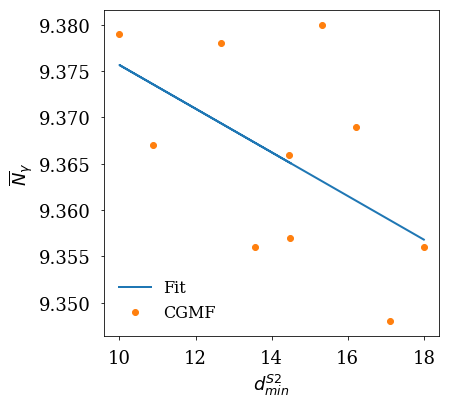

[ -3.93532943e-02   9.32820384e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 3.9E-04


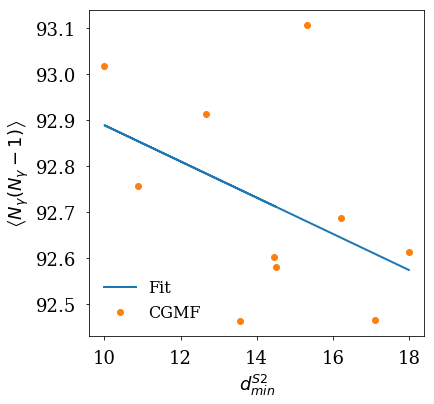

[ -4.00770428e-01   9.72136675e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.5E-02


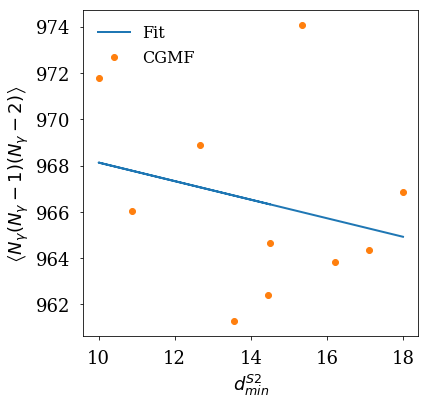

[-0.01063025  2.04351174]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.2E-05


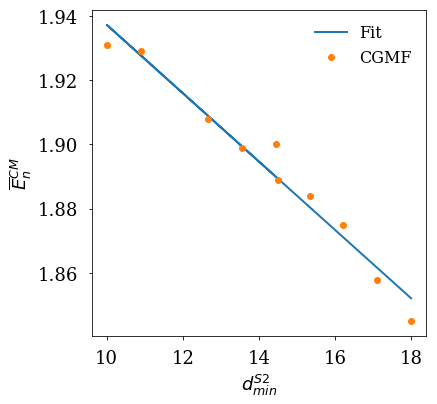

[-0.00673629  1.68883824]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 4.6E-06


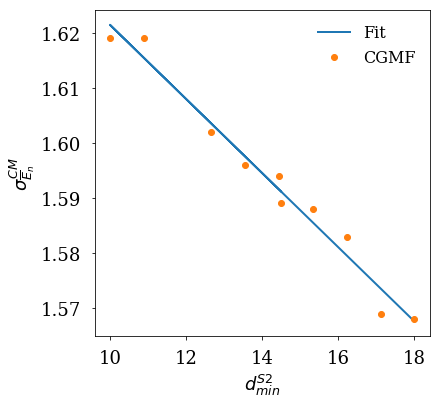

[-0.00309806  0.94411457]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.9E-06


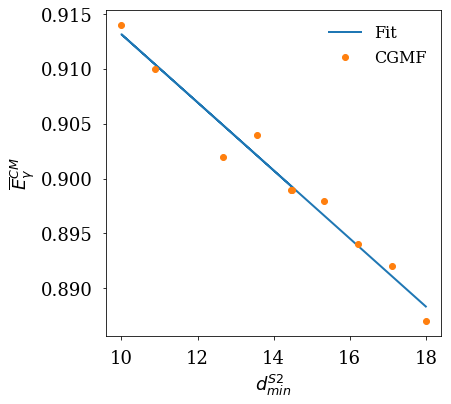

[-0.00403601  0.92984076]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 5.3E-06


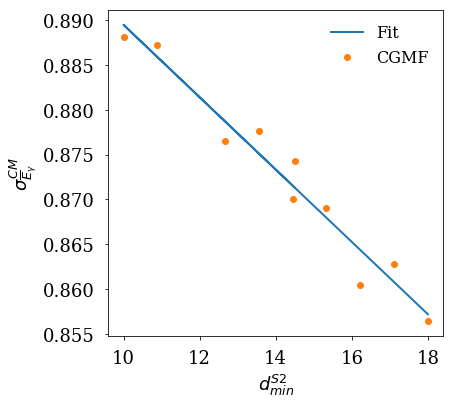

[-0.00505859  2.19229469]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 6.8E-06


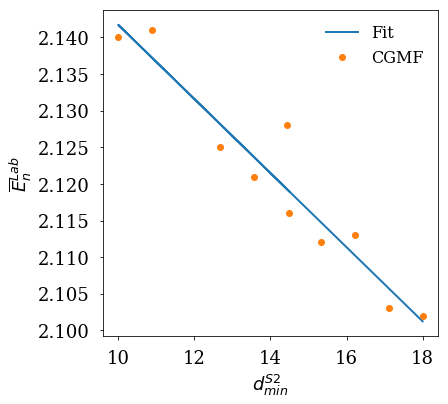

[-0.00644411  1.72896846]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 7.3E-06


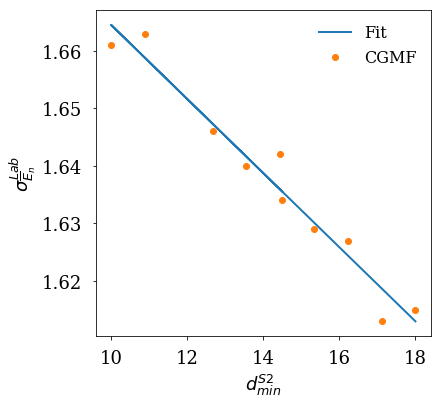

[-0.00227364  0.7660487 ]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.3E-06


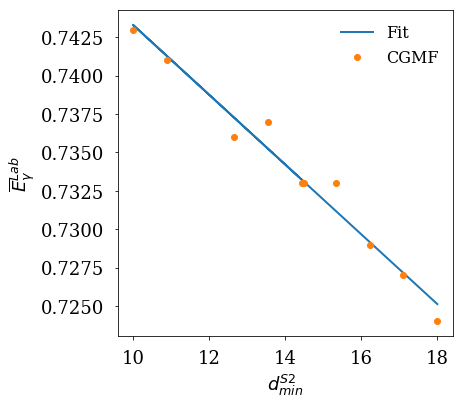

[-0.00357875  0.88215491]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.5E-06


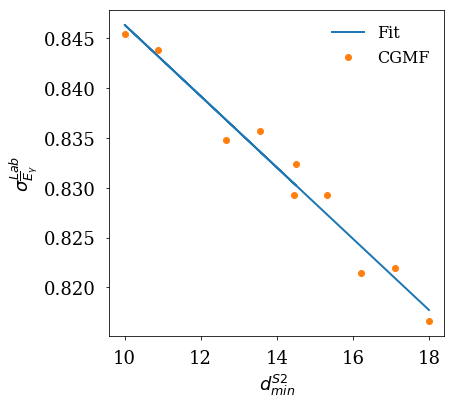

[ -1.69455514e-03   3.33554367e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.1E-05


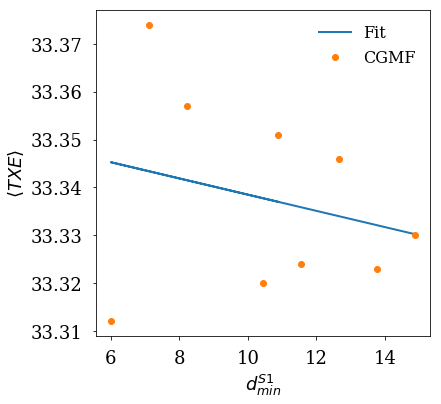

[ -0.0721698  11.4796082]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.1E-04


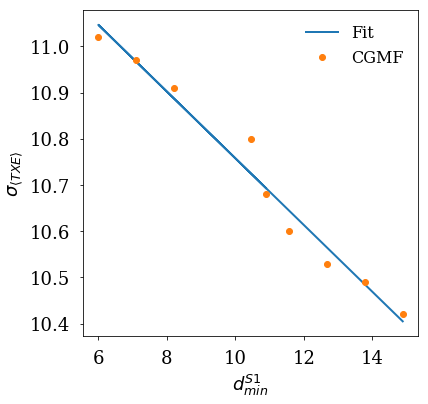

[  9.76483786e-04   1.84767632e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 4.9E-06


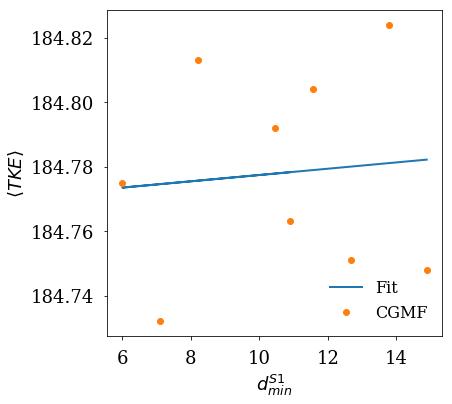

[ -0.07582359  12.04506962]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 9.2E-05


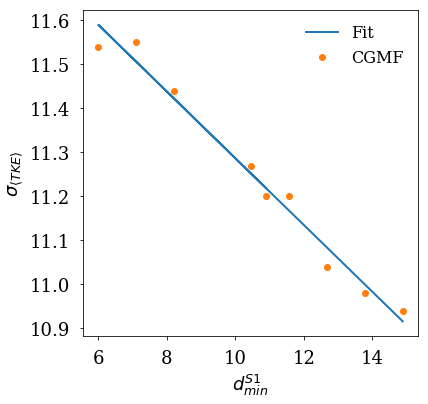

[ -1.93913983e-03   1.08537003e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.4E-05


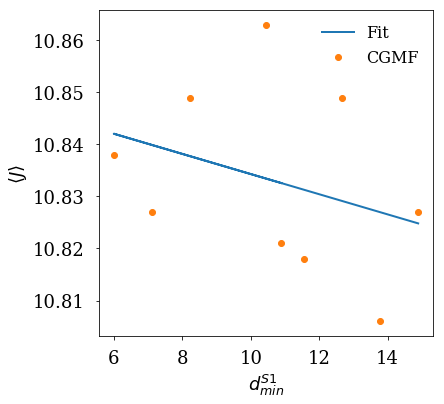

[ -5.42176483e-04   6.08386776e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.3E-05


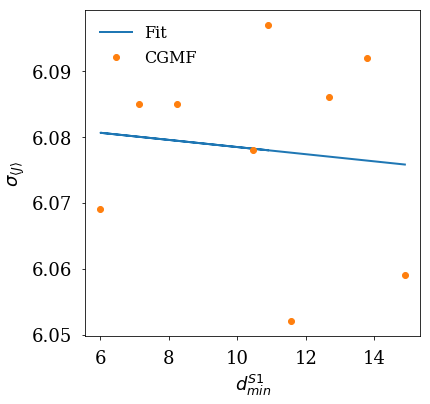

[  4.05744941e-04   3.87658082e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 4.8E-06


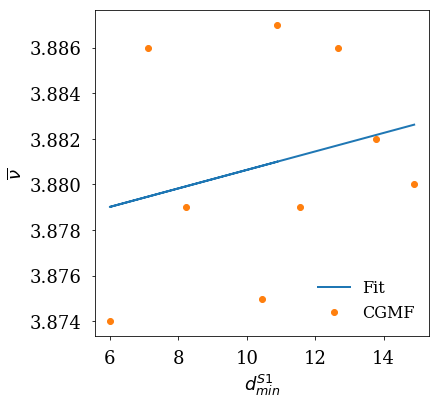

[ -0.02273904  13.40943554]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 5.5E-05


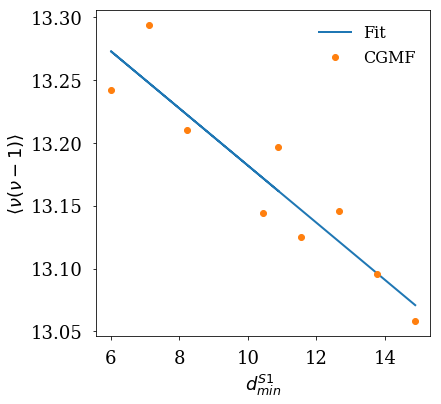

[ -0.14170592  39.88436404]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 4.4E-04


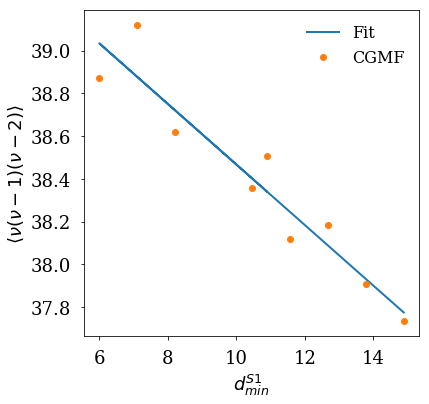

[ -1.91376074e-03   9.39109745e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.9E-05


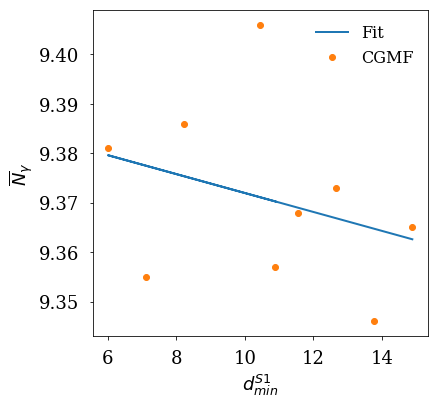

[ -2.97630948e-02   9.30987924e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 7.9E-04


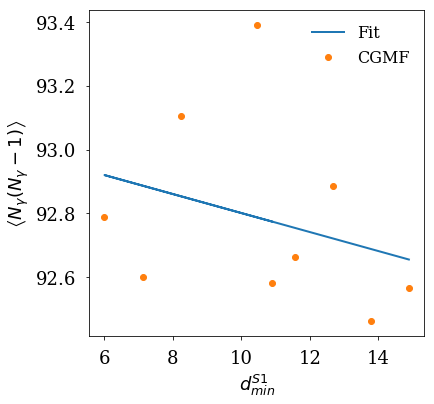

[ -2.42844343e-01   9.69150663e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.9E-02


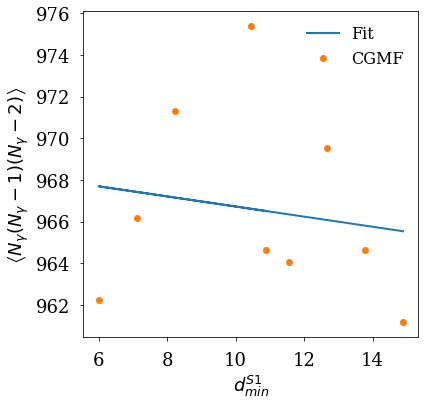

[ -3.44841520e-04   1.89521697e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.9E-06


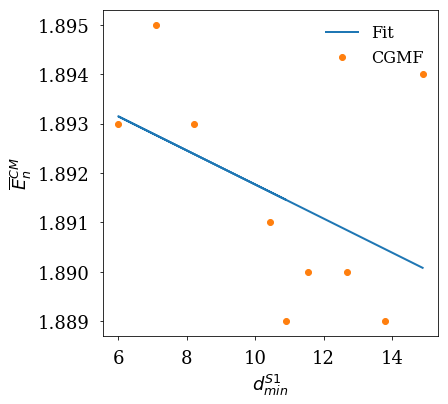

[ -4.45153306e-04   1.59383760e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 9.0E-06


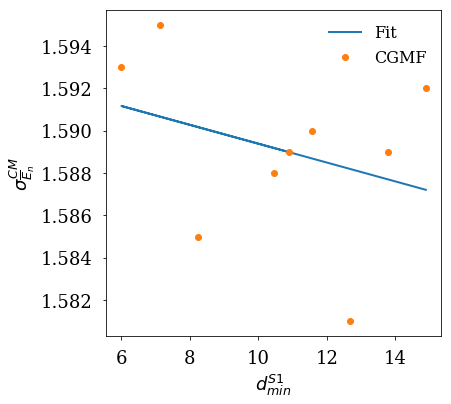

[  7.25738671e-05   8.99118324e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.1E-06


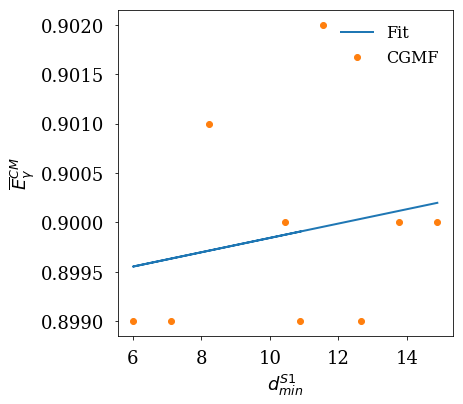

[  3.07155781e-04   8.69172056e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.5E-06


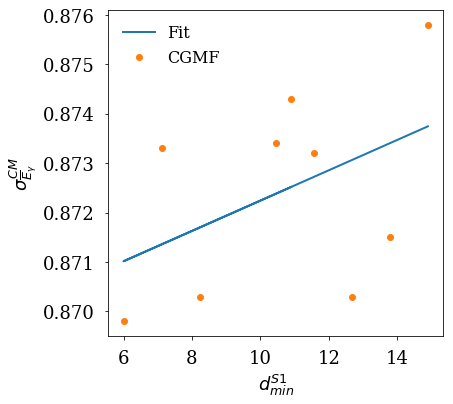

[  2.39102151e-04   2.11512796e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.6E-06


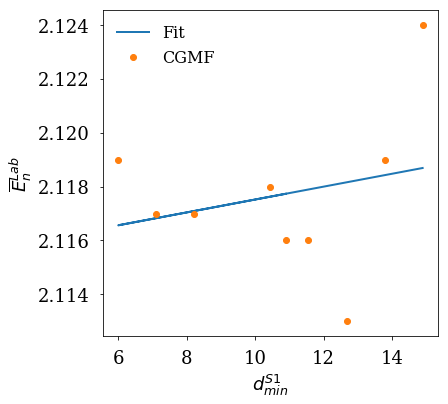

[ -3.12505041e-04   1.63765141e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.8E-06


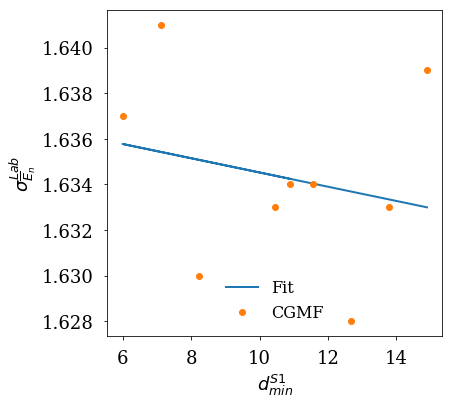

[  9.25986665e-05   7.32683485e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 5.1E-07


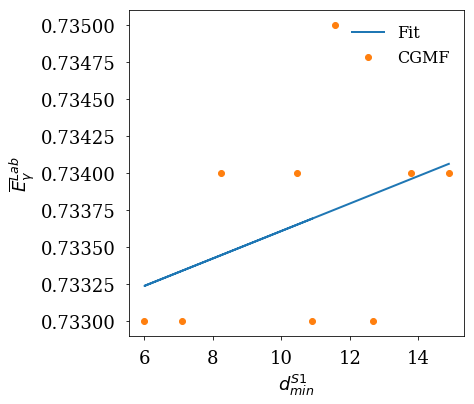

[  3.22545838e-04   8.28386427e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.4E-06


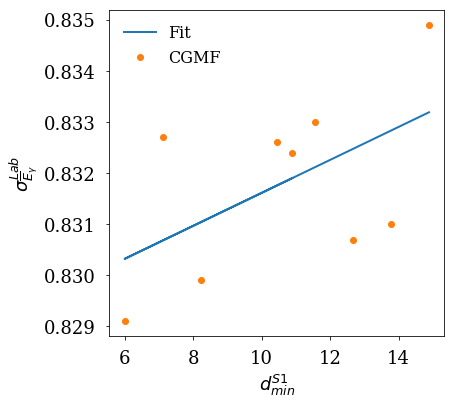

[  5.86938260e-04   3.33393773e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.5E-05


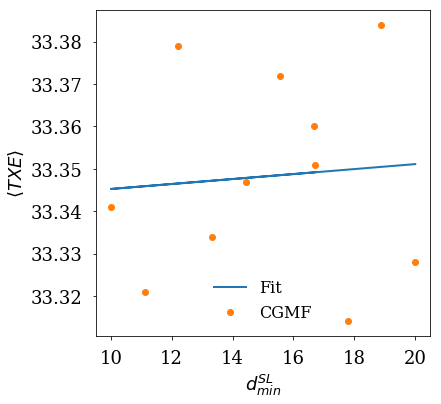

[ -2.62400563e-03   1.07534051e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 3.2E-05


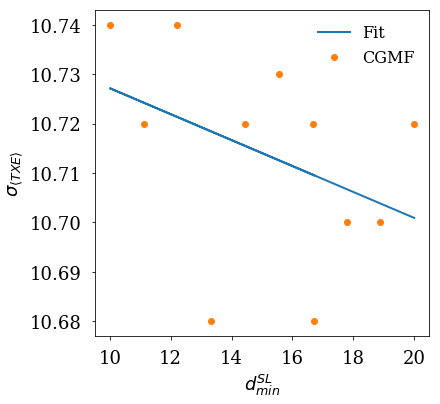

[ -1.85932708e-03   1.84808634e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 4.4E-06


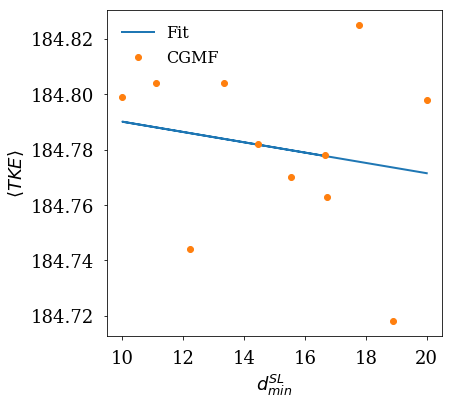

[ -3.99754548e-03   1.12969493e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 9.0E-05


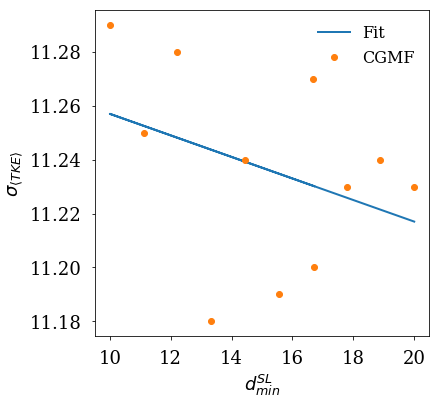

[ -3.91528824e-03   1.08860663e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.5E-05


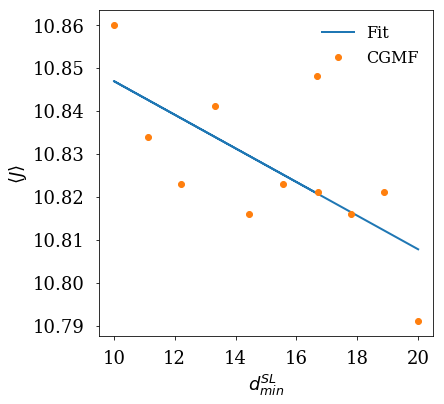

[ -1.85889744e-03   6.10726385e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 5.6E-05


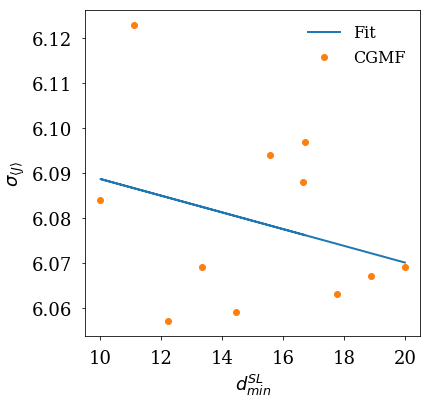

[  3.61508618e-04   3.87697562e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 3.7E-06


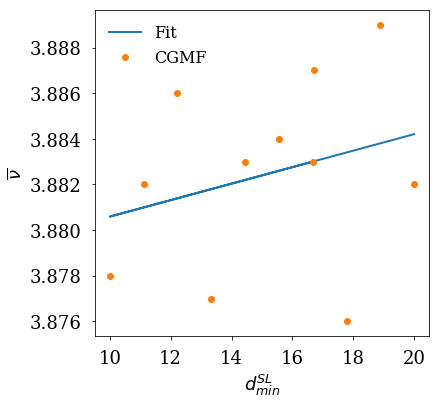

[  3.13464685e-03   1.31307649e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 6.2E-05


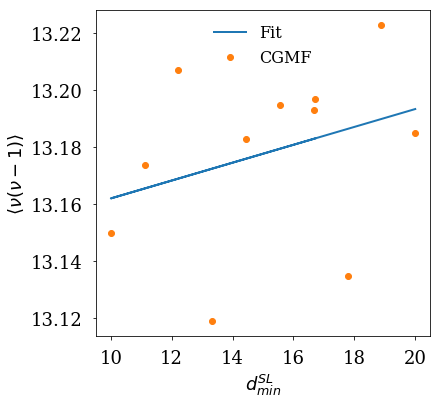

[  1.64519257e-02   3.82057500e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 5.4E-04


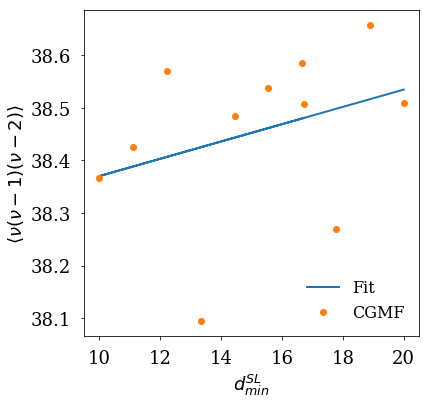

[ -2.71201432e-03   9.40564800e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.4E-05


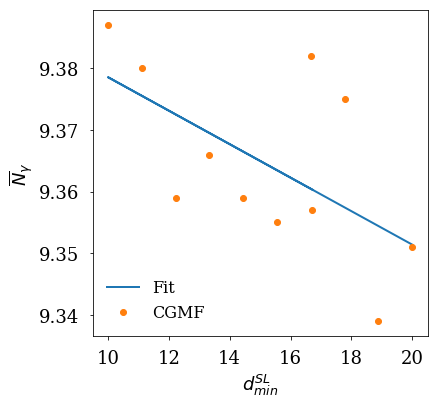

[ -6.07313857e-02   9.36332465e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 6.2E-04


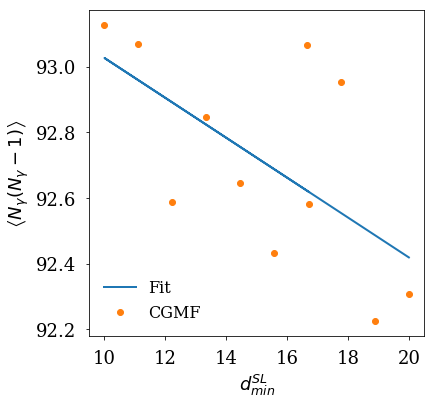

[  -1.12559084  983.37732962]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.7E-02


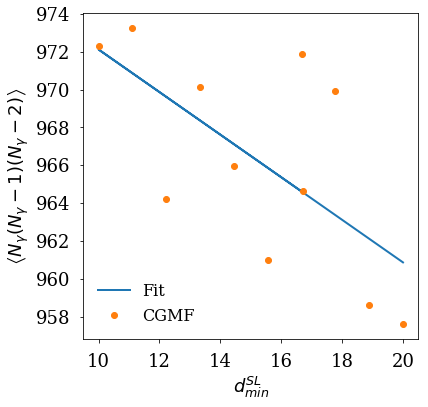

[ -1.27626168e-04   1.89547972e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.5E-06


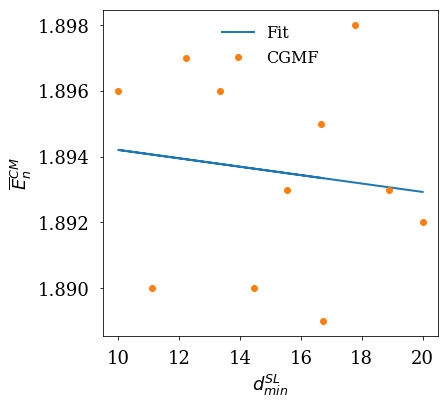

[ -2.46241169e-04   1.59445924e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.8E-06


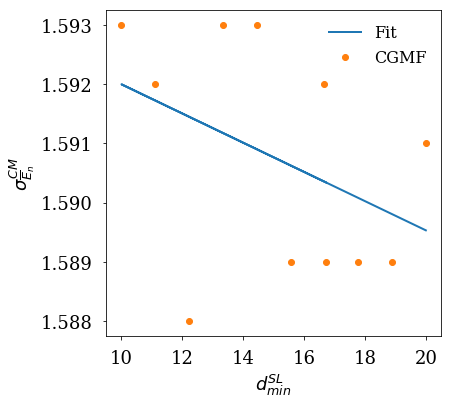

[ -1.06757240e-04   9.01617984e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.9E-06


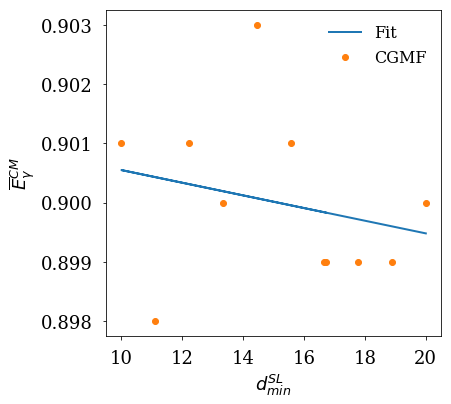

[ -7.33487793e-05   8.73238927e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.3E-06


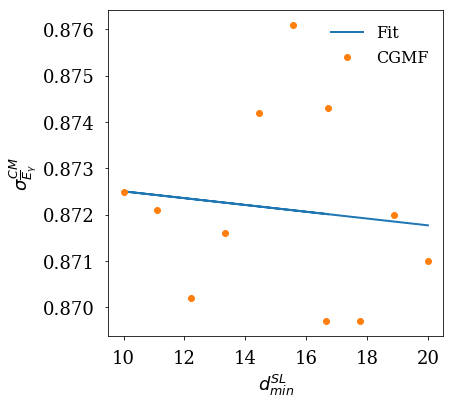

[ -6.64022399e-05   2.12073365e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.5E-06


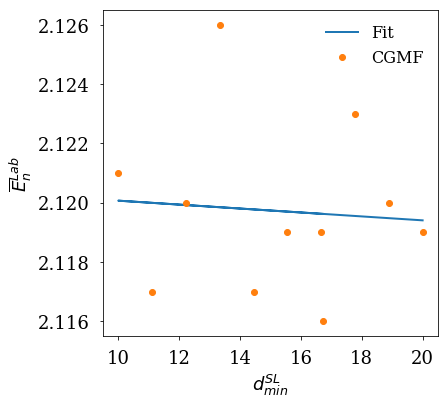

[ -1.37803630e-04   1.63736124e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.5E-06


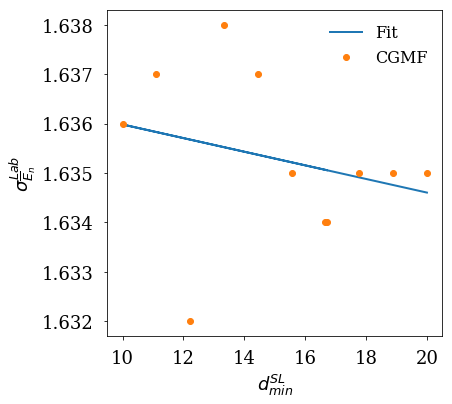

[ -2.63768633e-05   7.34036124e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.0E-06


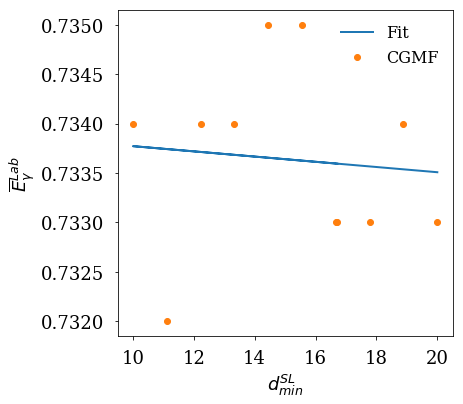

[ -6.39658938e-05   8.32051268e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.5E-06


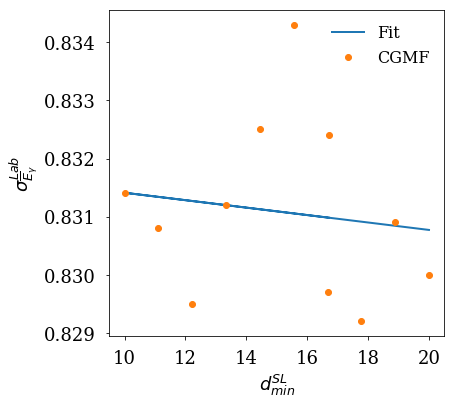

[   7.64468799 -105.79623864]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 3.6E-05


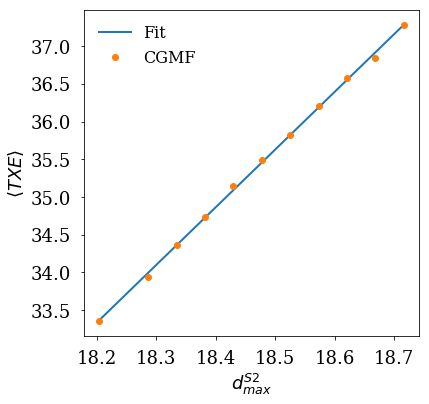

[ 0.89800939 -5.69346191]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 4.8E-05


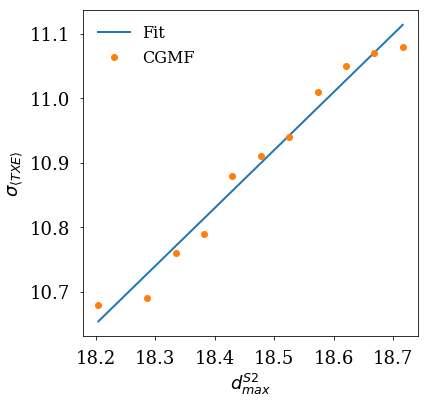

[  -7.68085439  324.58355864]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 6.6E-06


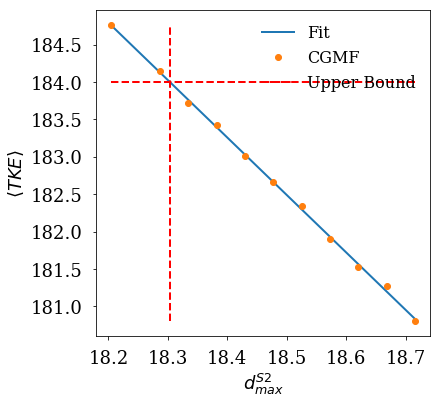

[  1.8138746  -21.80679207]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 7.4E-05


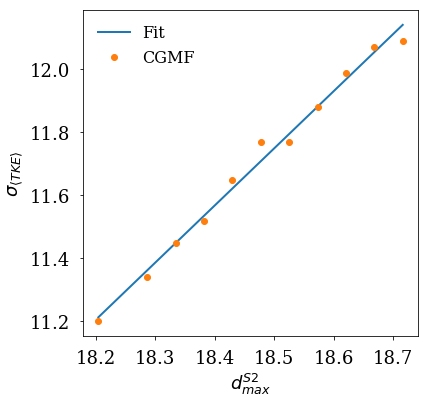

[ 0.58457094  0.1898183 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 4.3E-05


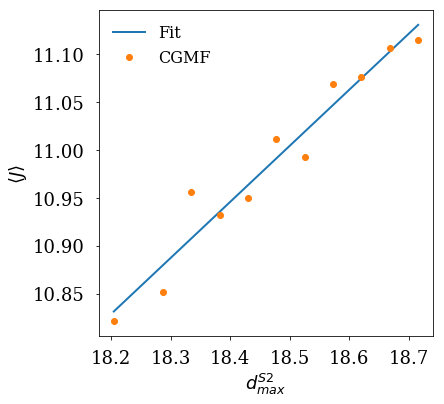

[ 0.2718333   1.13533351]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.0E-05


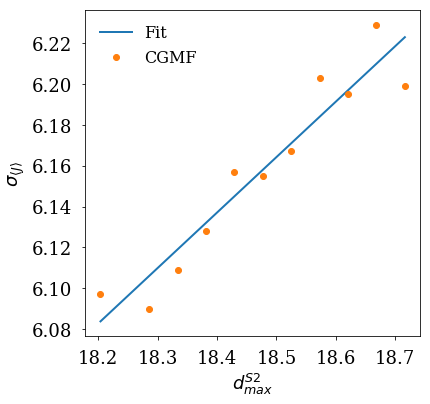

[  0.95392157 -13.47529251]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 4.5E-06


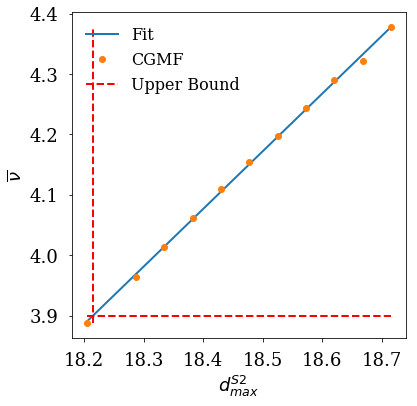

[   7.07094237 -115.53922569]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 4.2E-05


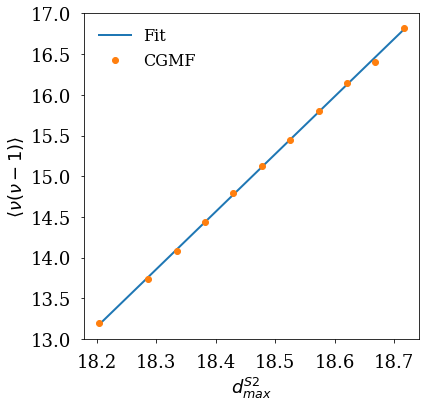

[  33.44441214 -570.59034256]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 4.6E-04


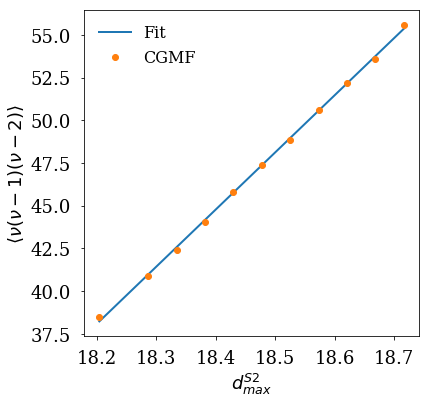

[ 0.20613584  5.61257379]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.5E-05


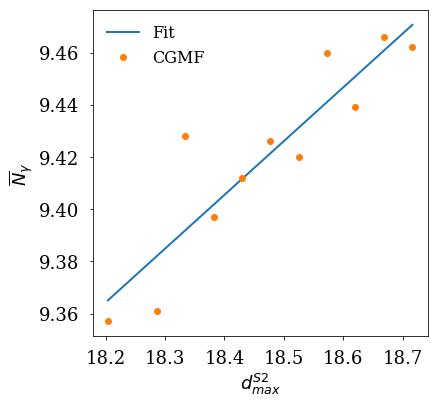

[  3.94003951  21.05698275]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.3E-04


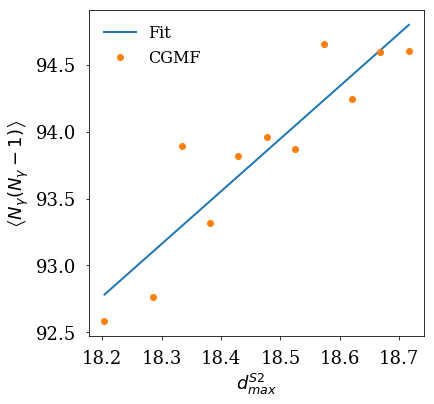

[ 57.99630955 -86.90291354]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.1E-02


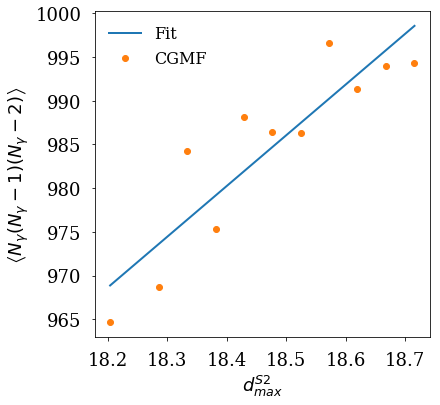

[ 0.10552822 -0.02998286]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 5.5E-06


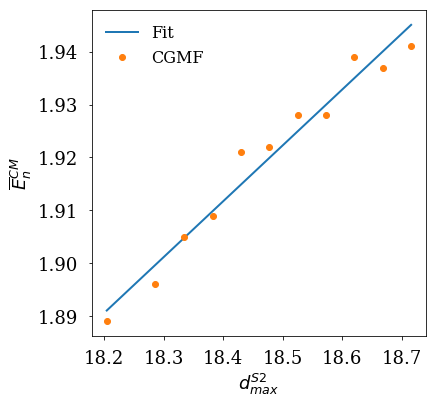

[ 0.07734288  0.18325861]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.0E-05


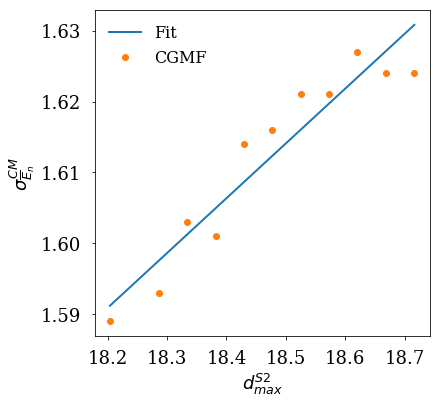

[ 0.04753224  0.03207113]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.4E-06


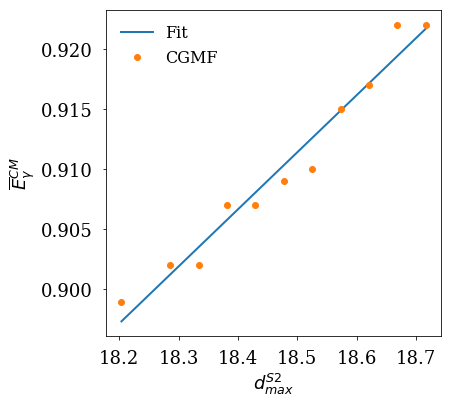

[ 0.04490122  0.05299495]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.5E-06


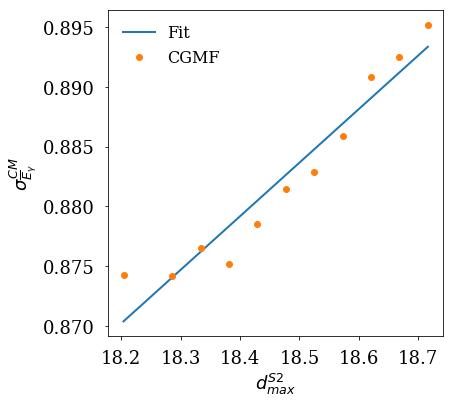

[ 0.09022963  0.47546149]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 4.6E-06


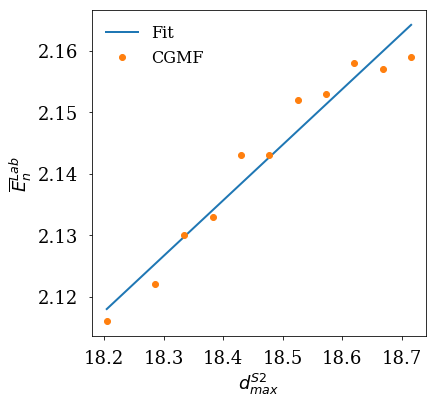

[ 0.0815142   0.15174298]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.0E-06


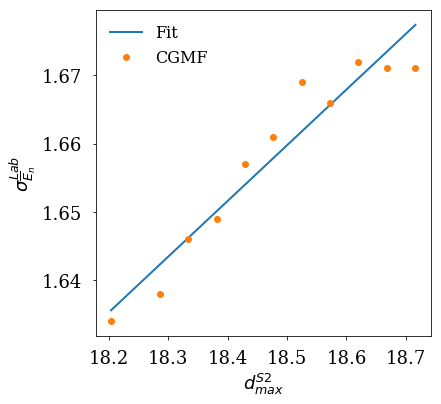

[ 0.03382167  0.11654219]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.2E-06


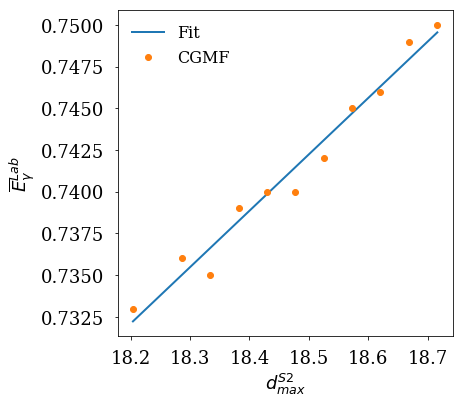

[ 0.03785581  0.14030628]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.2E-06


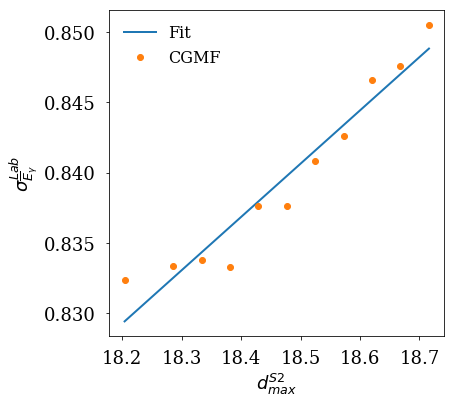

[ 1.89041255  0.56650369]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.7E-04


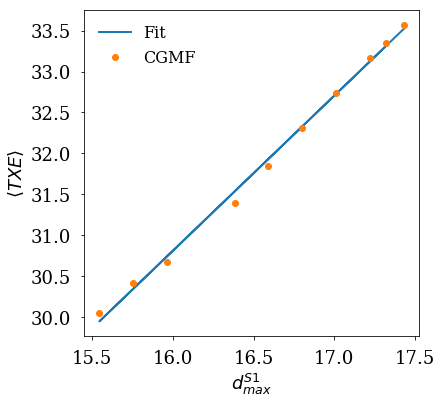

[ -1.78105852  41.44266792]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.2E-03


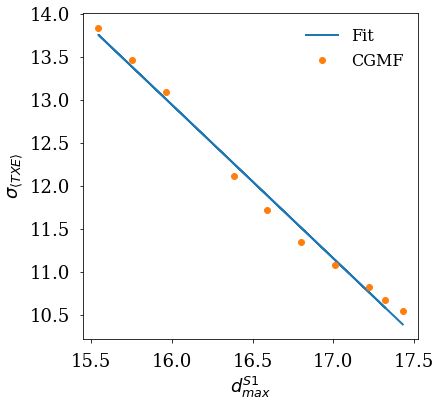

[  -1.8974752   217.65885245]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 2.0E-05


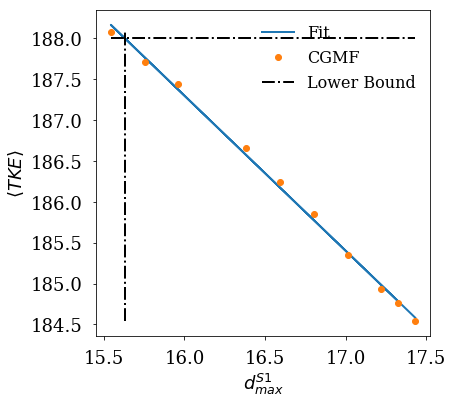

[ -2.75429762  58.88367542]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 3.4E-04


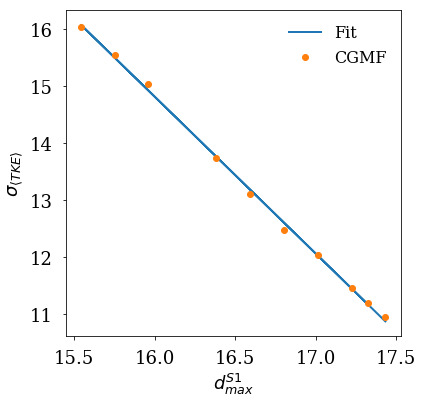

[ 0.17875864  7.73039538]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 8.3E-06


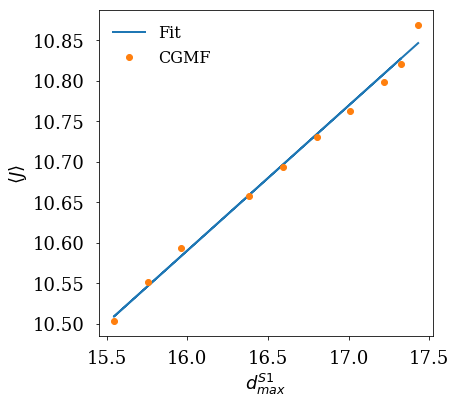

[  3.47345505e-03   6.00873266e+00]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 5.9E-05


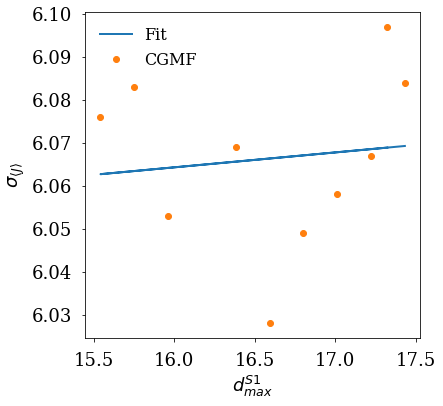

[ 0.24843561 -0.42360257]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 3.5E-05


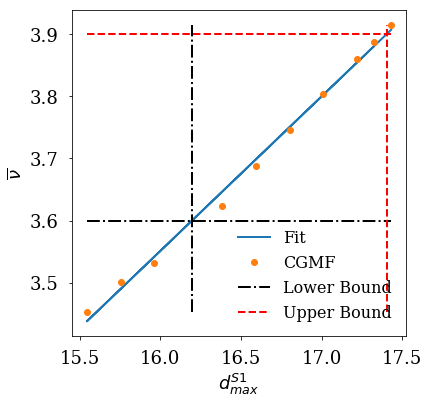

[ 0.78548726 -0.50419512]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.4E-03


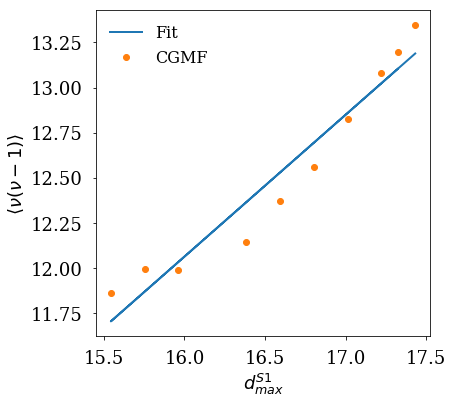

[ 1.67288693  9.19222933]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 6.5E-03


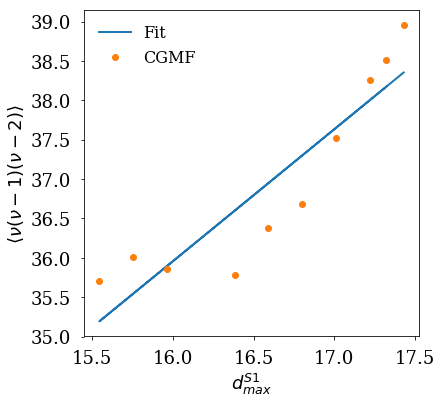

[ 0.09256355  7.77233218]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 7.3E-05


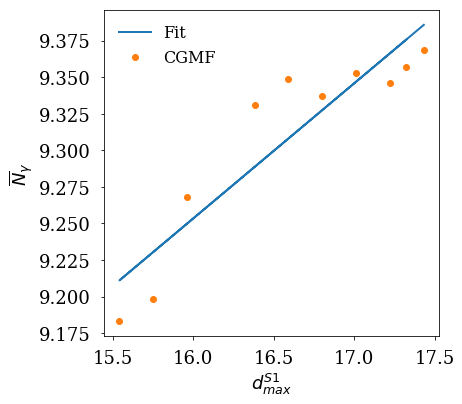

[  1.42567398  68.0642329 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.5E-03


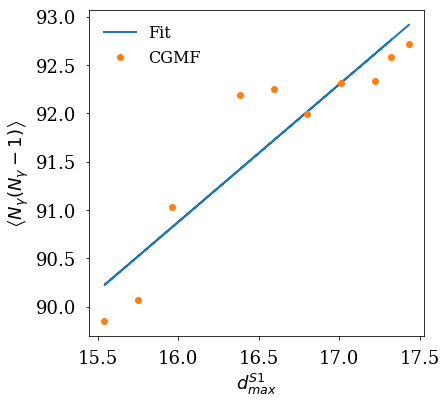

[  17.11252726  668.11268866]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.4E-02


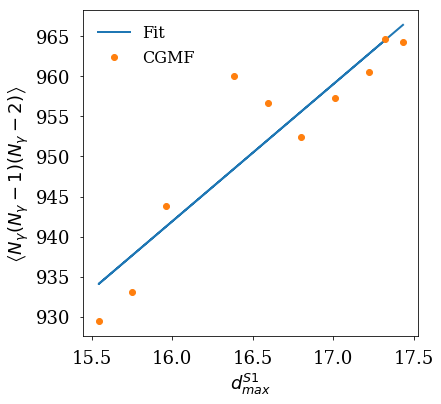

[ 0.00841277  1.74232868]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.5E-05


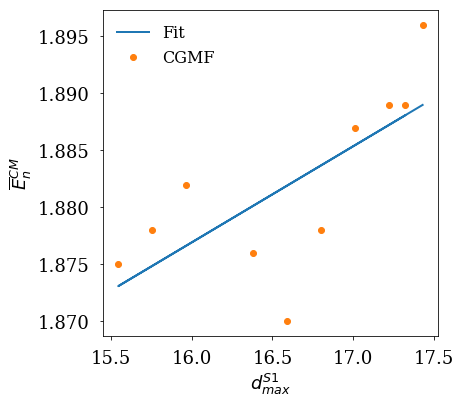

[ 0.00887915  1.43428576]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 2.1E-05


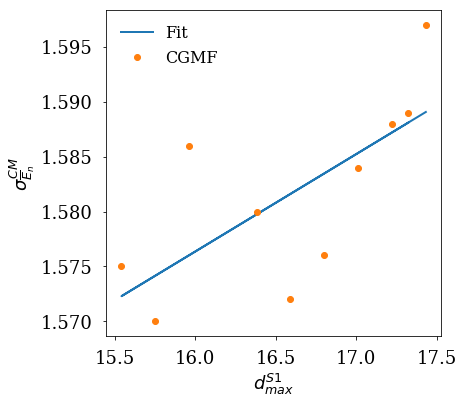

[ 0.0111008   0.70860113]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 5.8E-06


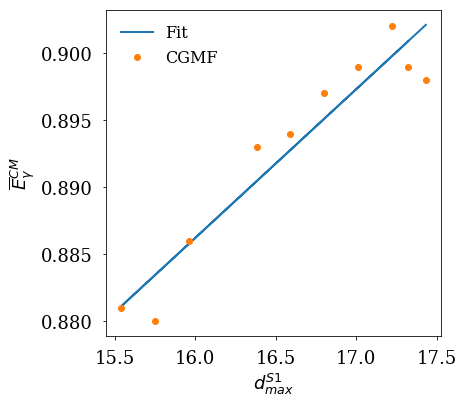

[ 0.01188785  0.6675743 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 6.3E-06


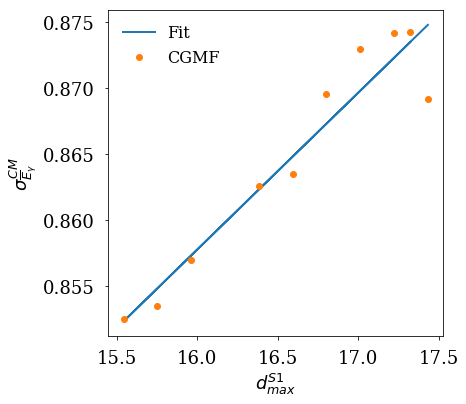

[ 0.01036044  1.93479291]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 9.6E-06


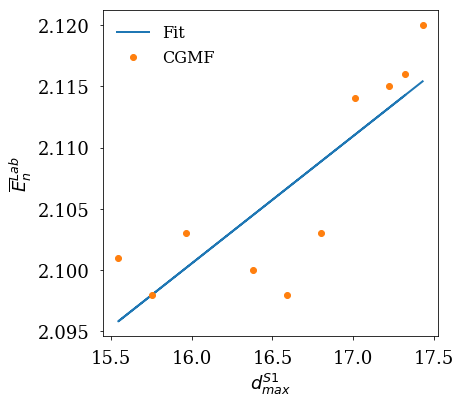

[ 0.00875593  1.48013149]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.5E-05


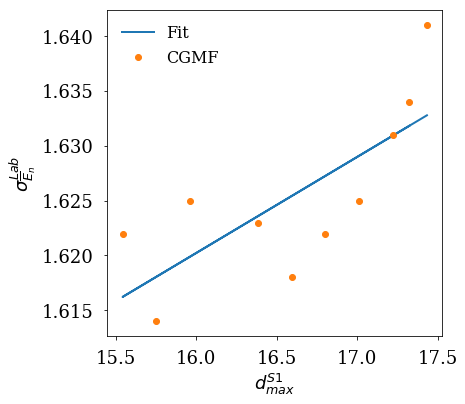

[ 0.00990411  0.56326906]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 8.2E-06


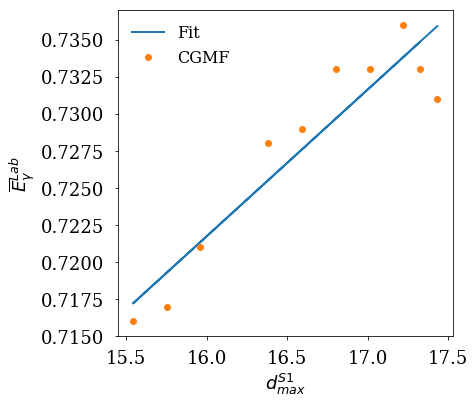

[ 0.01157309  0.63224001]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 7.5E-06


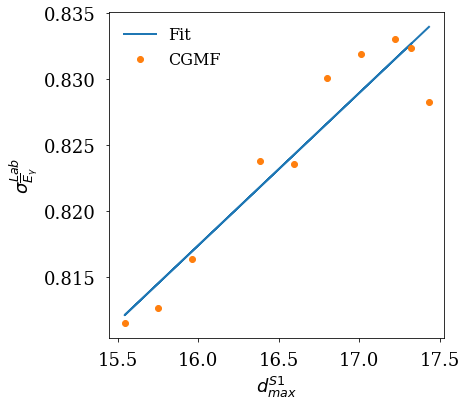

[  0.11631091  30.9435701 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.0E-04


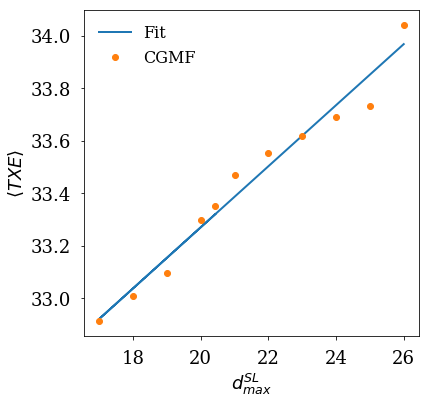

[ 0.22647258  6.23929456]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 2.7E-03


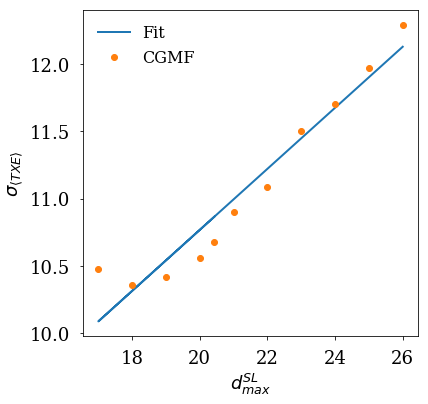

[ -1.23214719e-01   1.87303007e+02]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.5E-05


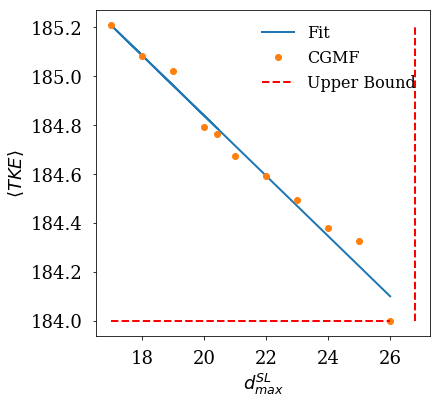

[ 0.18686575  7.57061423]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 2.3E-03


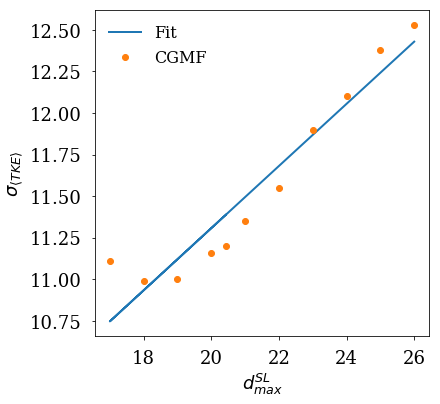

[ -4.65898812e-03   1.09148956e+01]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.6E-04


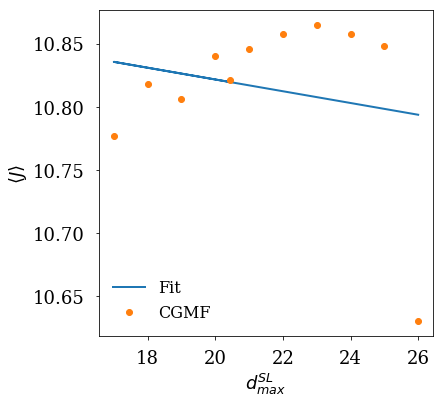

[ 0.01069244  5.86379187]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 5.3E-05


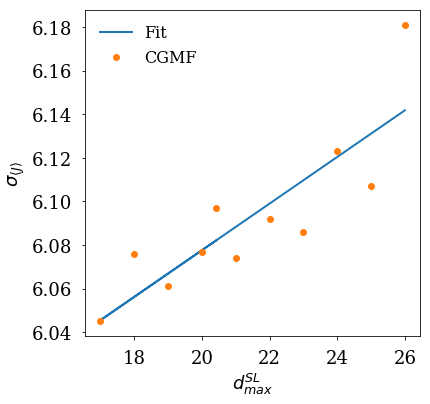

[ 0.00919991  3.68928108]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 2.4E-05


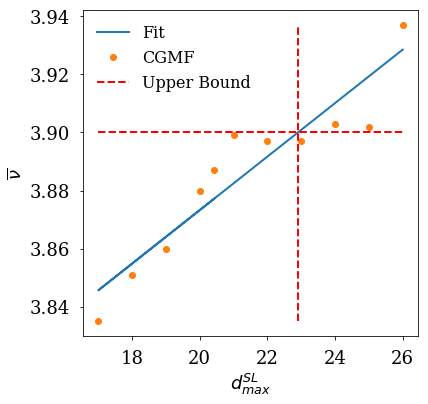

[  0.07983323  11.51800932]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 2.6E-04


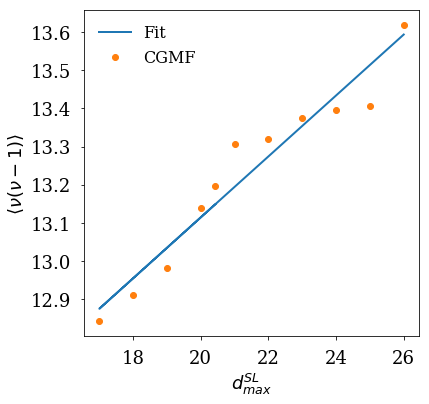

[  0.47775081  28.65014175]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.8E-03


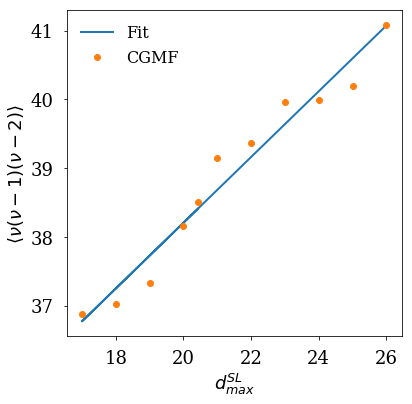

[ 0.00987964  9.16736965]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 4.8E-05


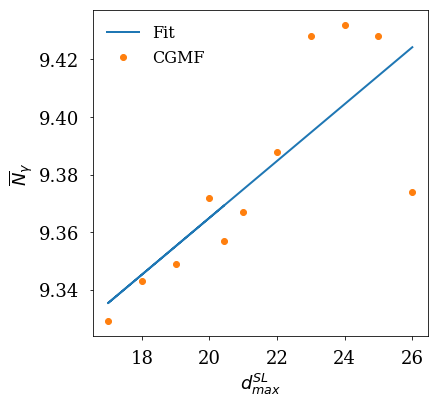

[  0.22607719  88.20184777]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 2.1E-03


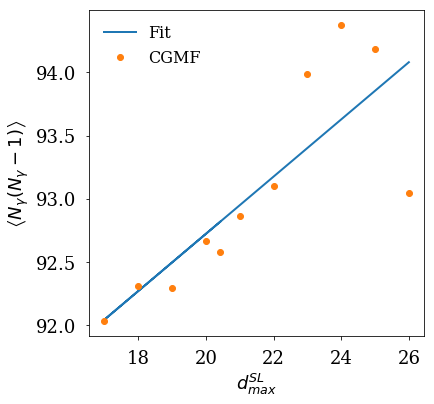

[   4.19952438  882.45441573]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 5.2E-02


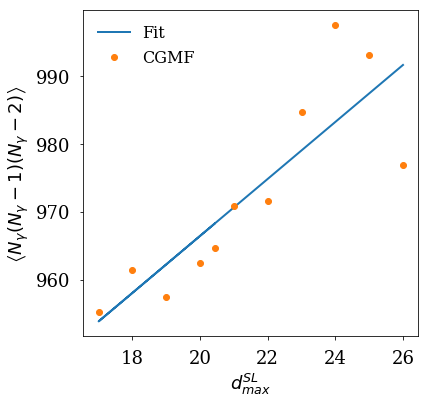

[  1.82327831e-03   1.85261373e+00]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.7E-05


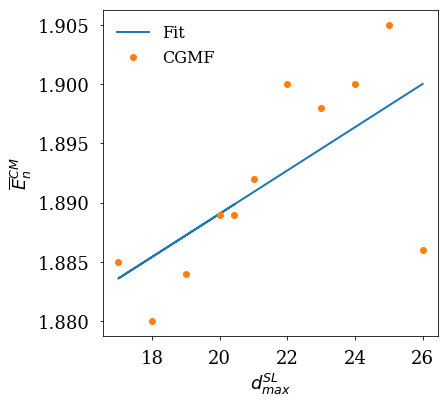

[ 0.00443435  1.49873047]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 2.2E-05


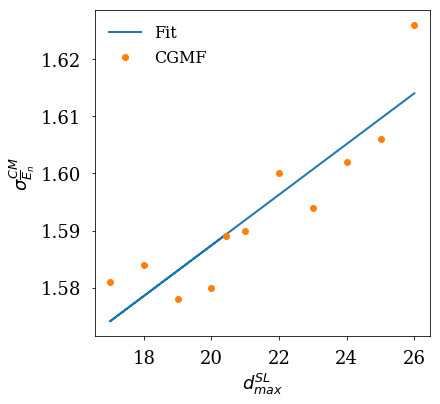

[ 0.00447185  0.81038224]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.4E-05


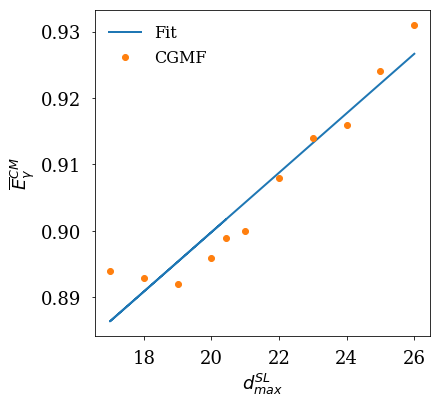

[ 0.01007579  0.67575345]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 6.2E-05


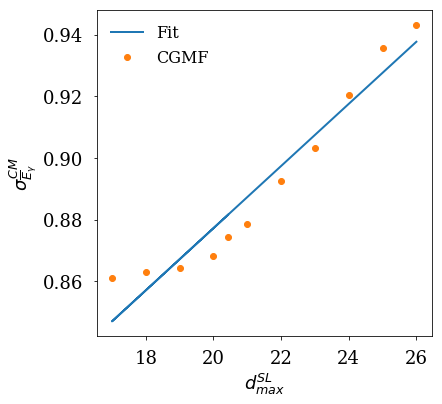

[  9.76229626e-04   2.09656084e+00]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 1.9E-05


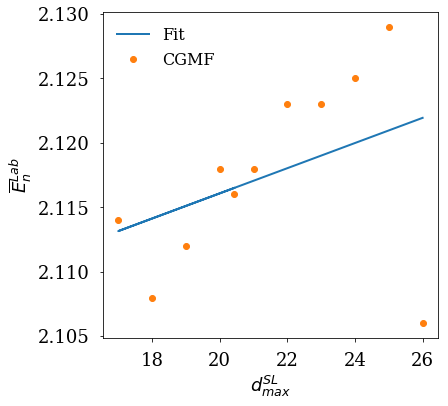

[ 0.00414738  1.54896326]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.8E-05


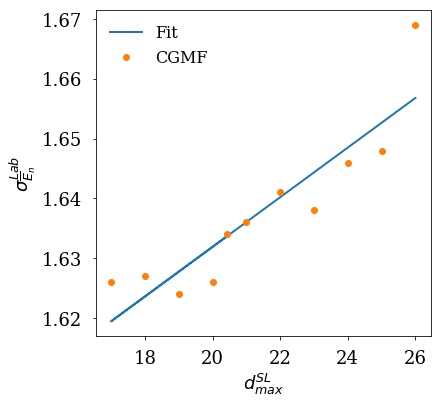

[ 0.00295496  0.674302  ]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 6.4E-06


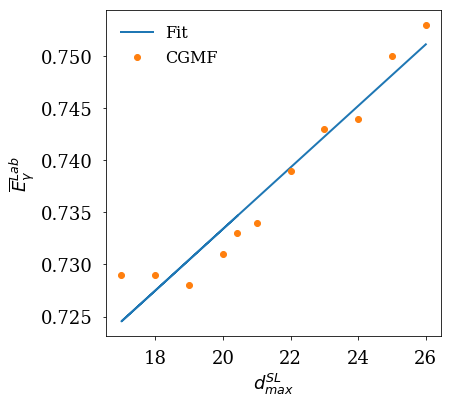

[ 0.00784606  0.67809319]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.9E-05


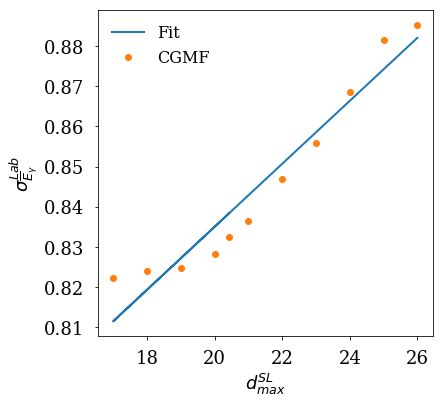

[  5.09500241  31.04951063]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.7E-05


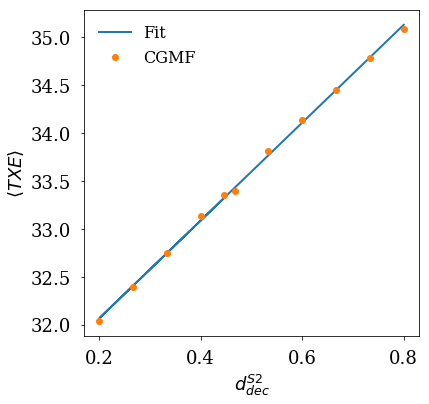

[ 8.02473828  7.0327523 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 8.2E-04


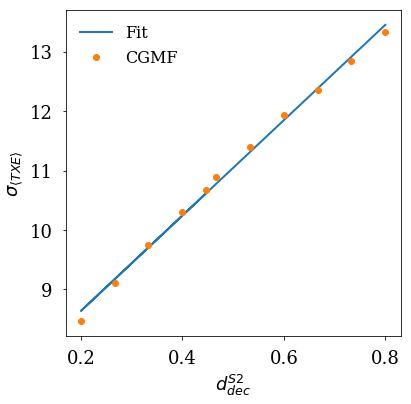

[  -5.1276569   187.08120177]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 7.5E-06


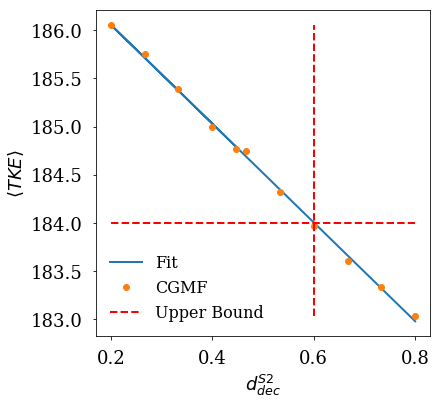

[ 8.38421619  7.38095988]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 6.7E-04


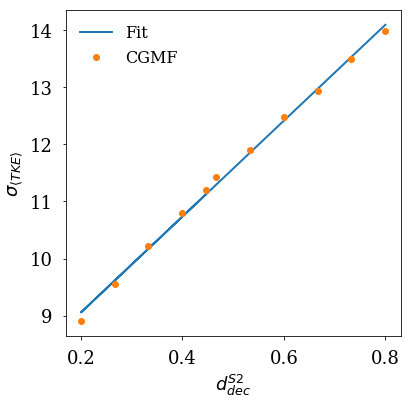

[  0.30719516  10.69609229]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.0E-05


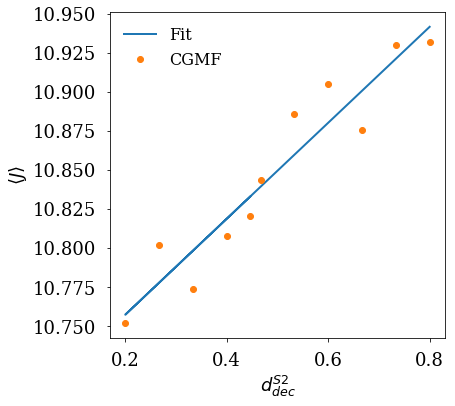

[ 0.26398154  5.95730514]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.7E-05


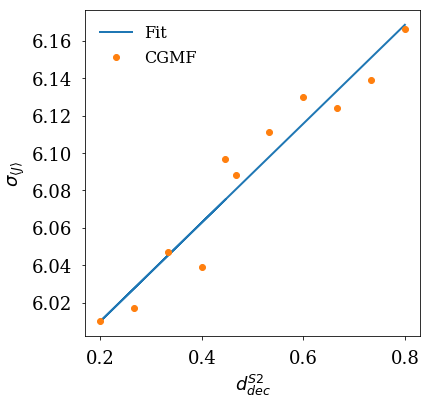

[ 0.53430826  3.64092338]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 1.2E-05


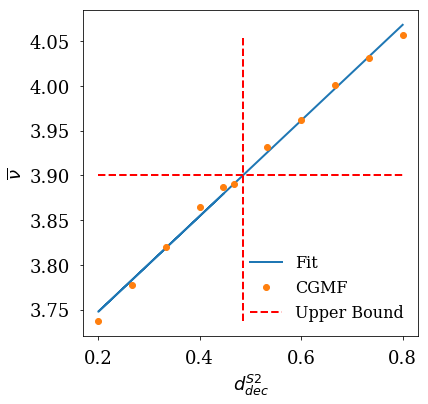

[  6.0630992   10.43648743]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 2.3E-04


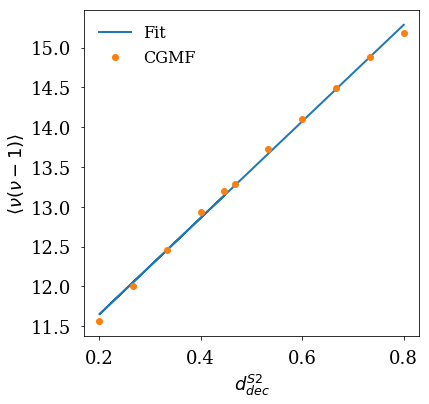

[ 38.03587805  21.35660074]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.1E-03


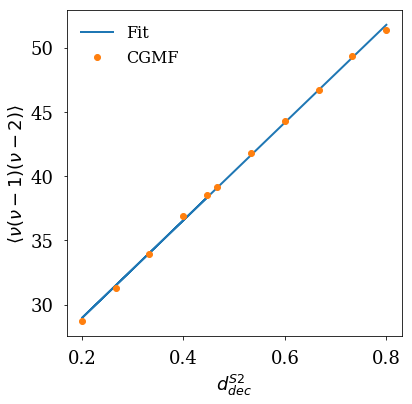

[ 0.20932822  9.27754532]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.7E-05


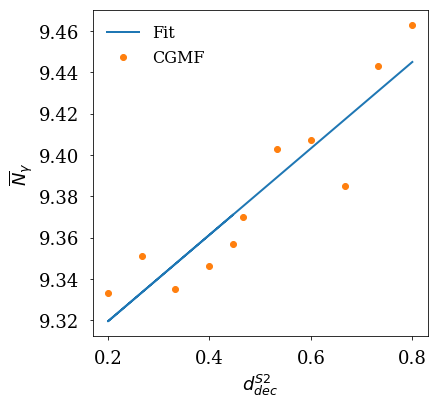

[  4.23680324  90.89357905]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 9.5E-04


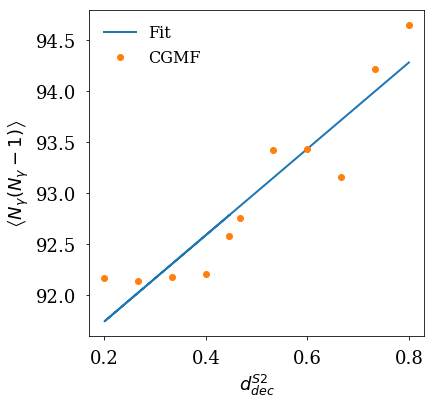

[  67.92371105  936.27249724]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.6E-02


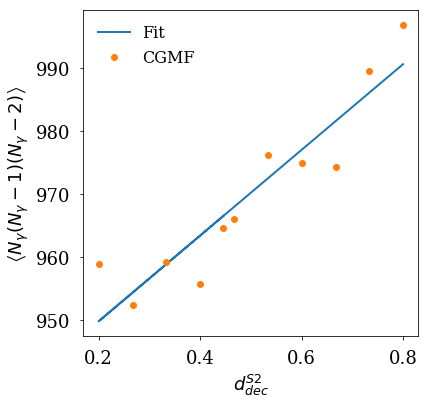

[ 0.178425    1.81084522]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.2E-06


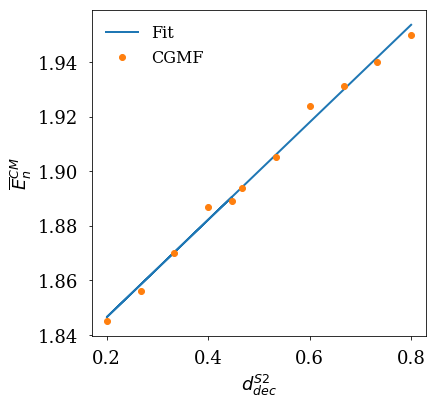

[ 0.12274091  1.53614118]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 6.7E-06


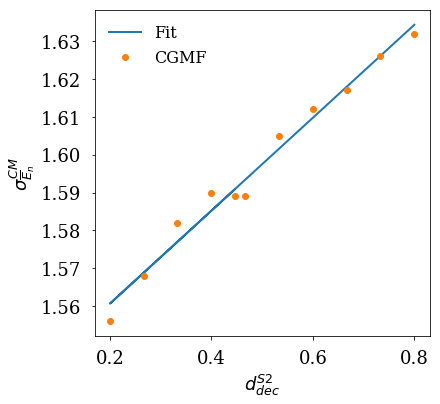

[ 0.072009    0.86871263]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 8.9E-06


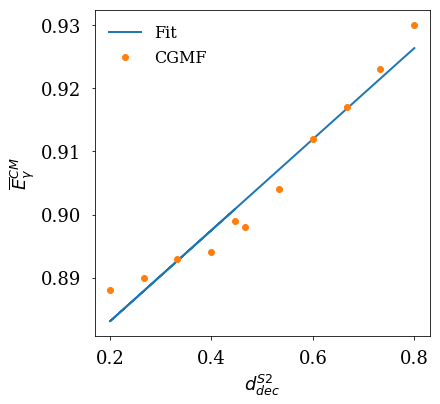

[ 0.09394999  0.83156803]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 1.3E-05


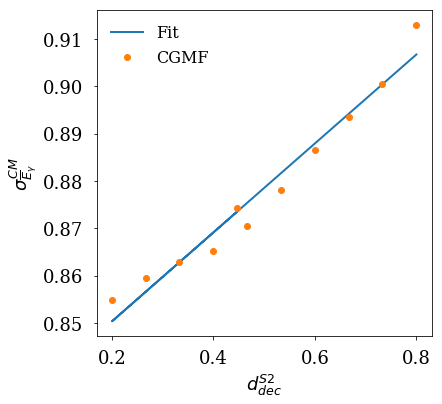

[ 0.11865254  2.06552893]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.5E-06


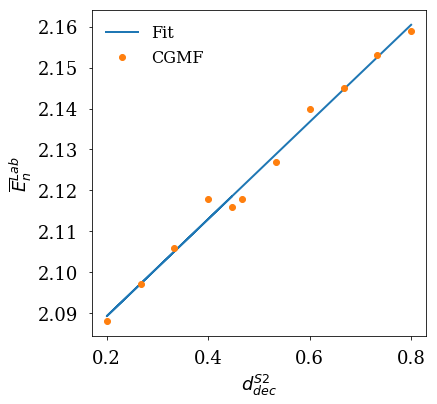

[ 0.12291328  1.58041948]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.9E-06


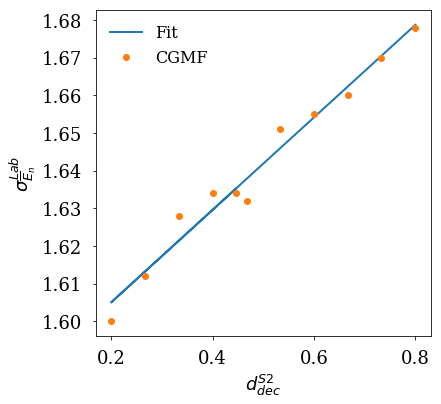

[ 0.05237164  0.7102531 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 4.6E-06


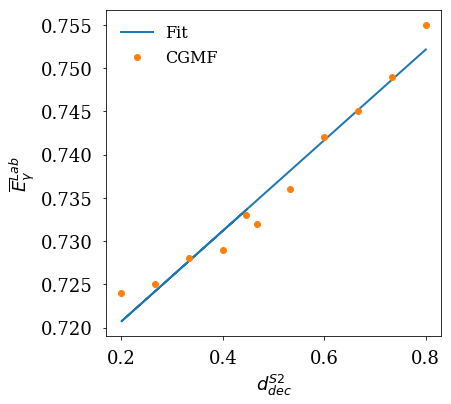

[ 0.07785685  0.79728106]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 9.1E-06


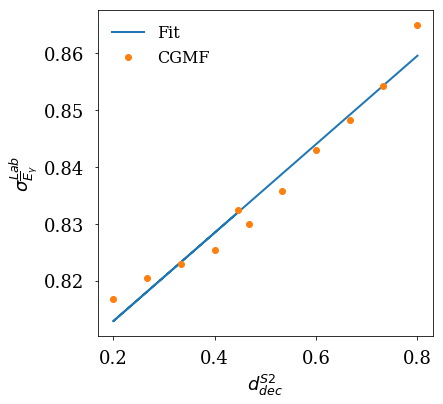

[  0.80103563  33.24410996]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 6.6E-05


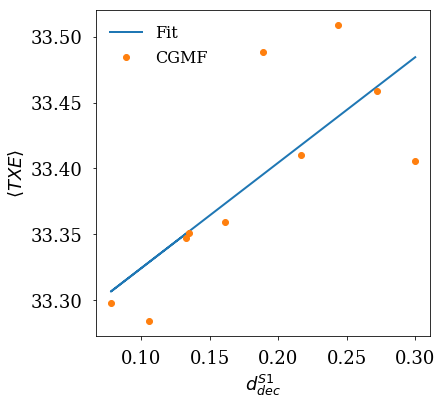

[  2.50899769  10.33859892]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 2.5E-05


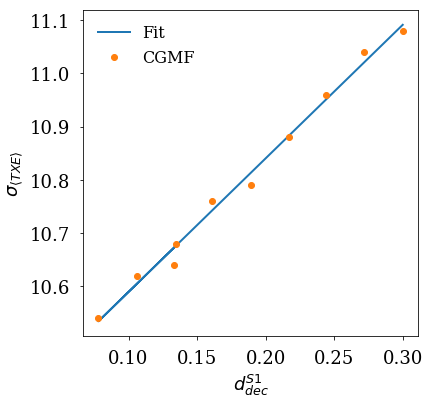

[  -1.03731351  184.91254703]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 9.7E-06


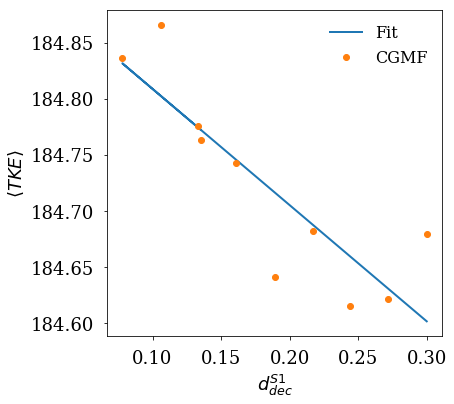

[  1.70253781  10.97158431]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.0E-04


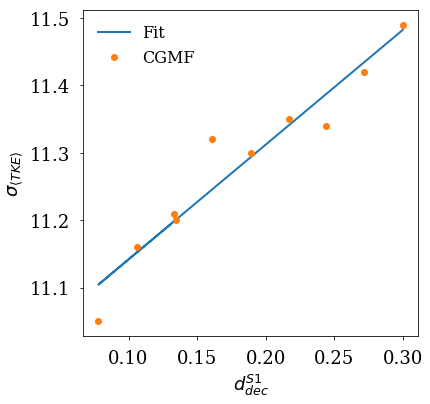

[ -3.97846706e-03   1.08307300e+01]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.2E-05


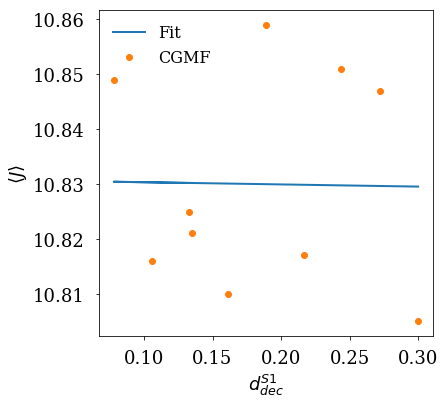

[-0.01698026  6.08591588]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.4E-05


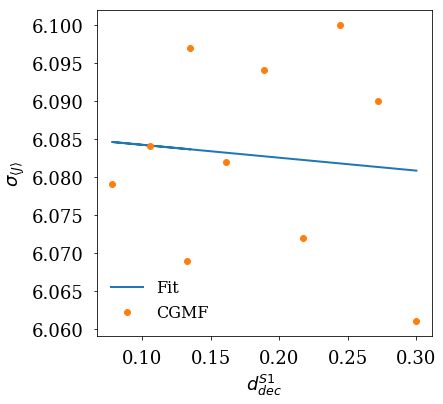

[ 0.06256857  3.87771867]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 9.6E-06


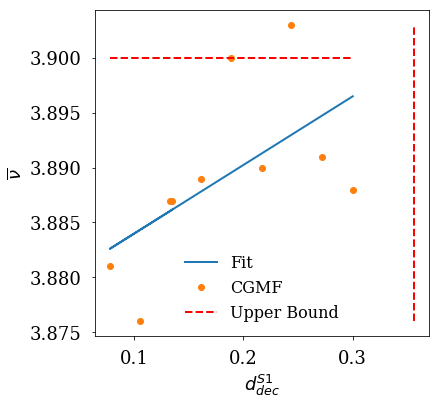

[  1.19747757  13.03206287]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.5E-04


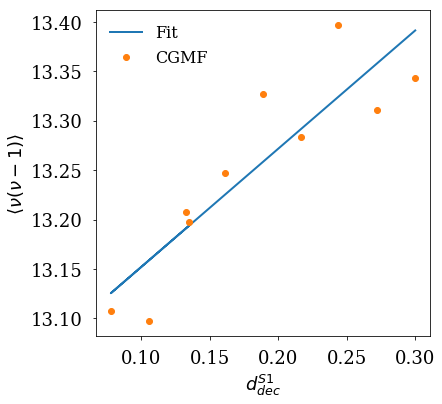

[  6.45971802  37.60584174]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.0E-03


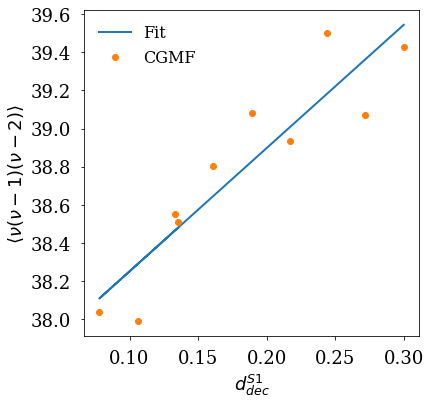

[ 0.05832351  9.35289764]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.3E-05


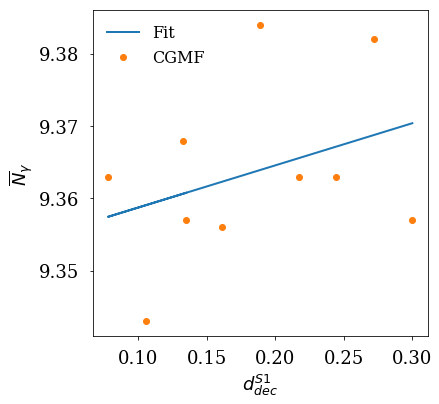

[  0.77636503  92.48983702]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 5.4E-04


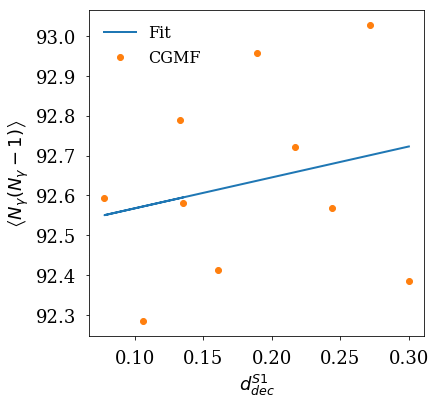

[   9.05049987  962.80423327]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.6E-02


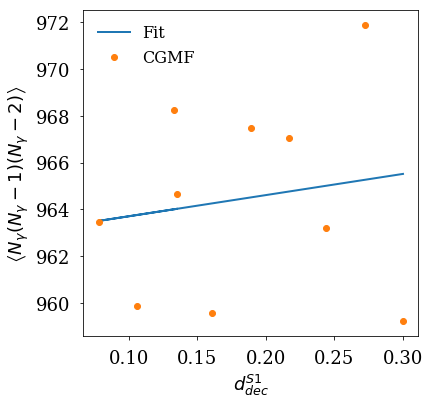

[ 0.05677519  1.88308175]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 2.4E-06


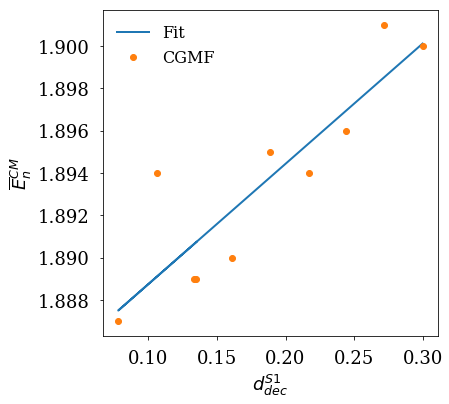

[ 0.05181236  1.57999243]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 6.0E-06


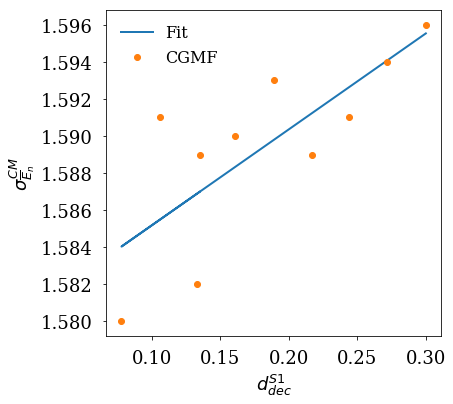

[ 0.01001794  0.89746171]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 3.6E-07


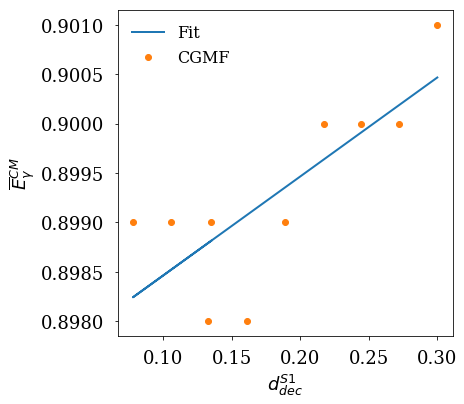

[ 0.01129967  0.86988651]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 5.4E-06


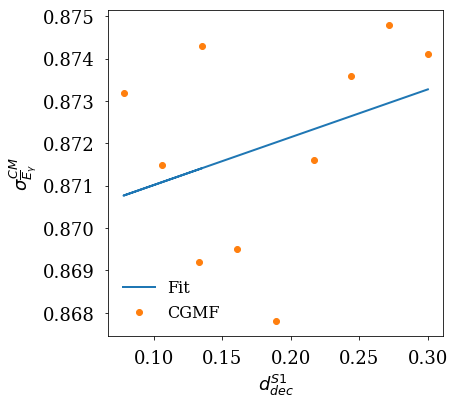

[ 0.04054345  2.11176028]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 1.0E-06


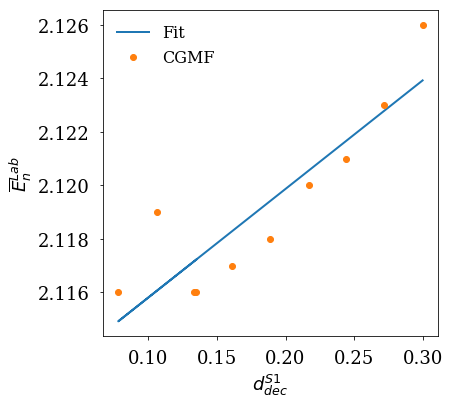

[ 0.05293002  1.62528734]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.7E-06


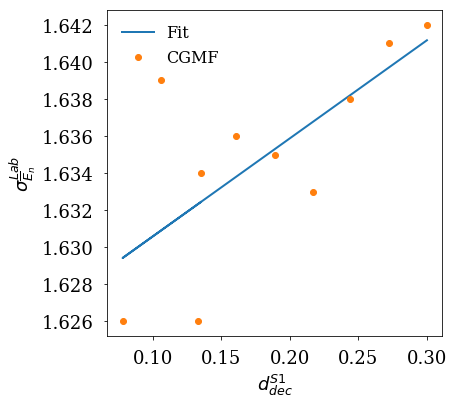

[ 0.00308639  0.73213365]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 5.0E-07


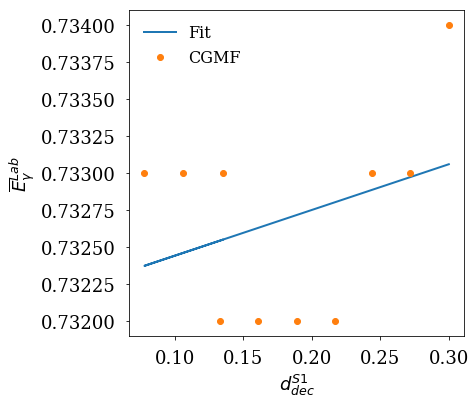

[ 0.00699923  0.82961564]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.2E-06


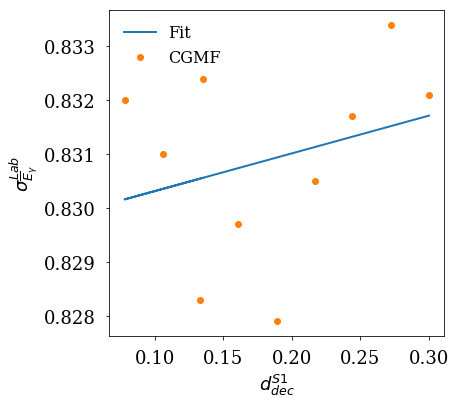

[  0.04644195  33.3501633 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 3.6E-05


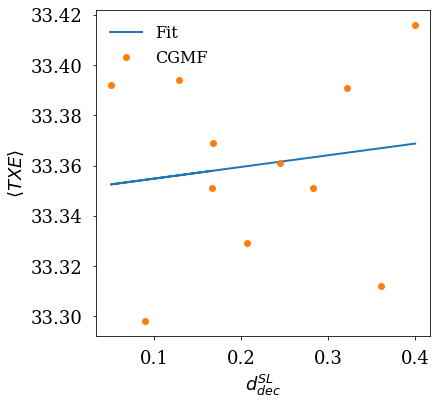

[  0.25114282  10.63847627]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 6.1E-05


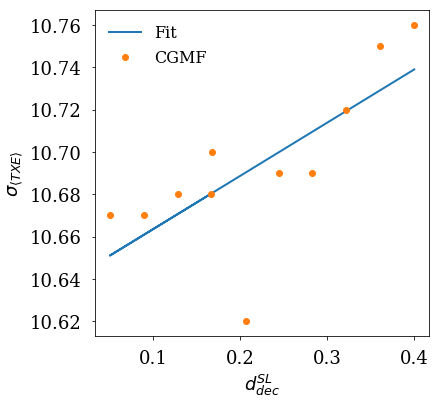

[ -9.10269008e-03   1.84753454e+02]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 7.2E-06


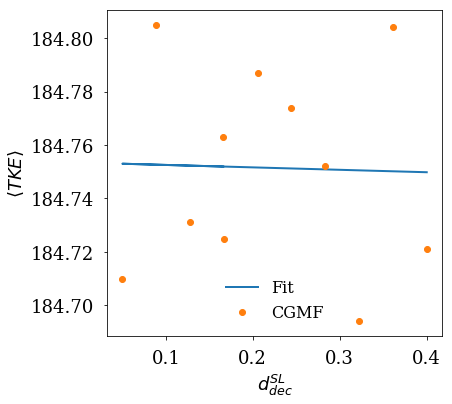

[  0.33270674  11.16147096]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 2.0E-04


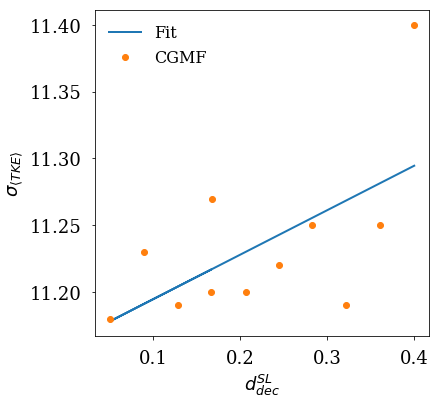

[ -0.01125376  10.82301719]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.6E-05


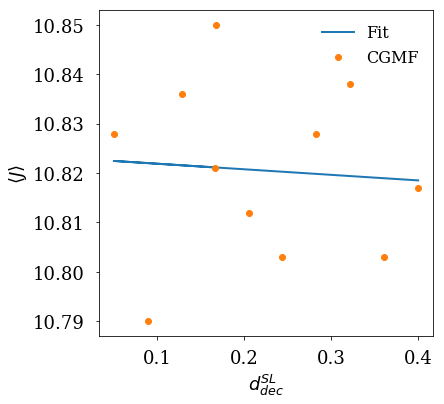

[-0.03044246  6.08750445]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.3E-05


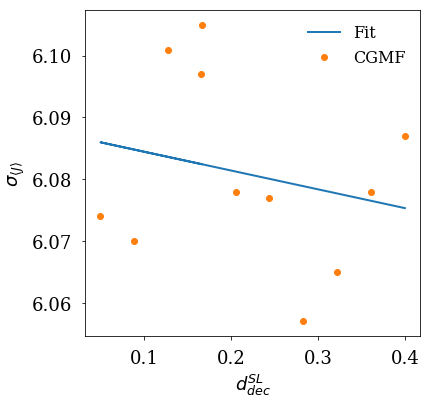

[ -8.24539668e-04   3.88636292e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 5.7E-06


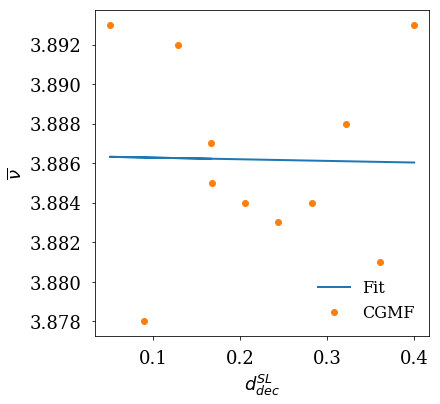

[  5.89638427e-03   1.31951595e+01]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 7.8E-05


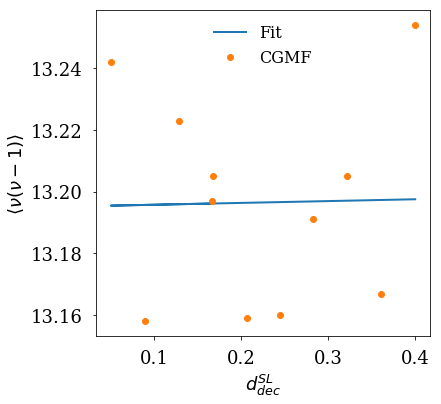

[  0.16884835  38.47282385]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.4E-04


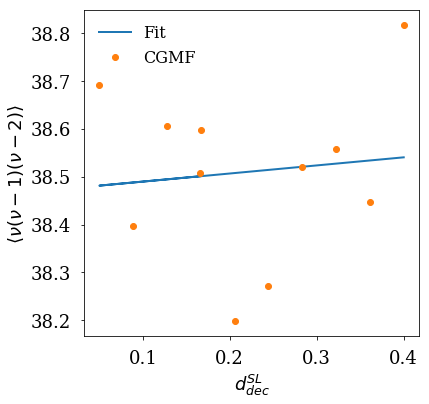

[ 0.01718005  9.36159027]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.6E-05


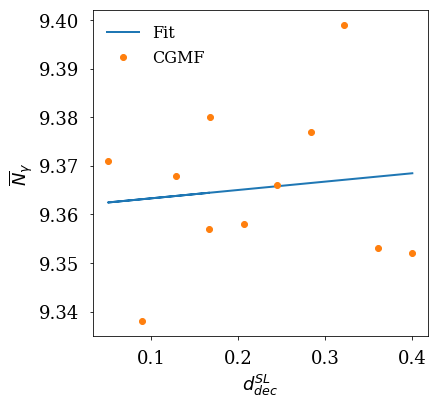

[  0.31544267  92.68871732]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 9.5E-04


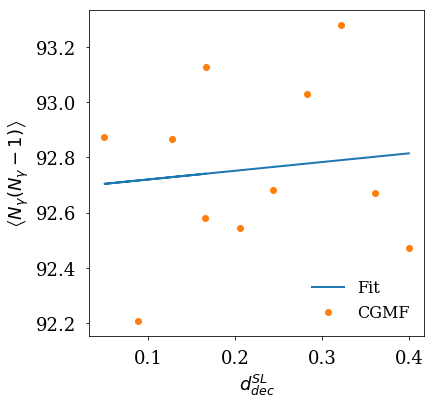

[   4.59492887  966.25715017]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.4E-02


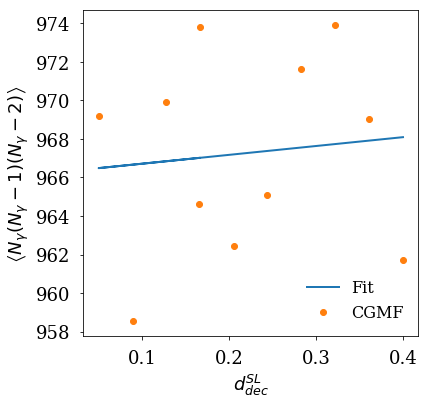

[  2.05778898e-04   1.89177299e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.3E-06


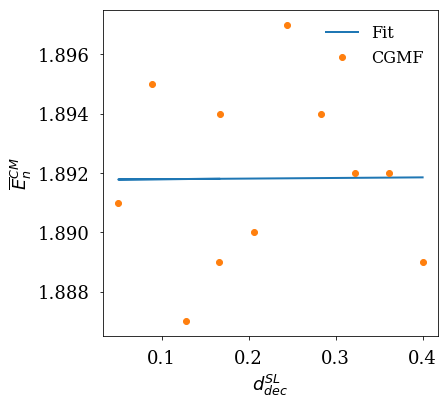

[-0.00243659  1.58926244]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 7.7E-06


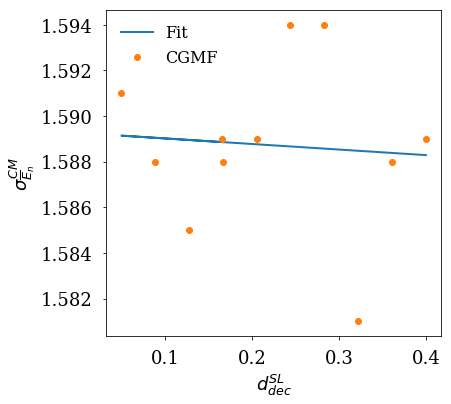

[ 0.00242805  0.89846671]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.1E-06


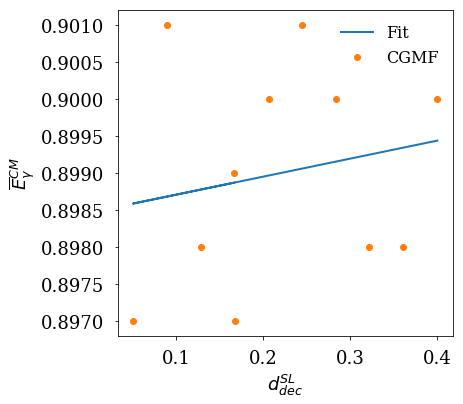

[ 0.0035708   0.87091572]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 5.1E-06


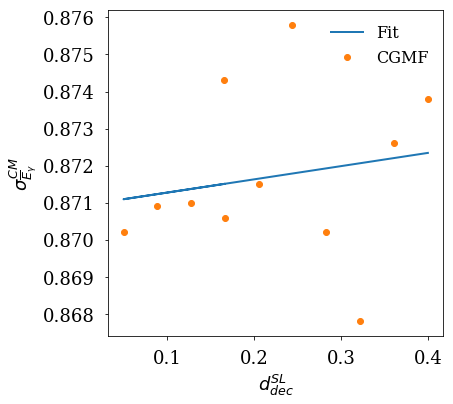

[  4.95578246e-04   2.11770933e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.6E-06


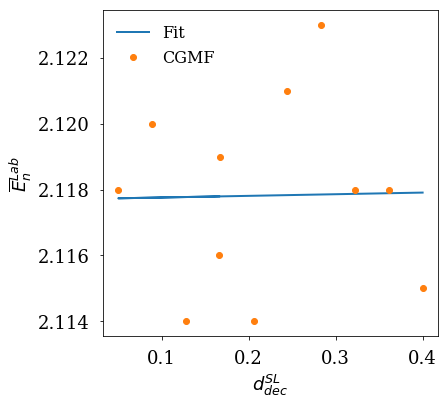

[-0.00494083  1.63463064]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 7.1E-06


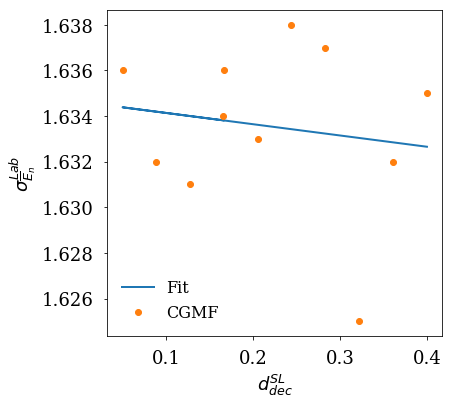

[ 0.00171031  0.73271526]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.1E-06


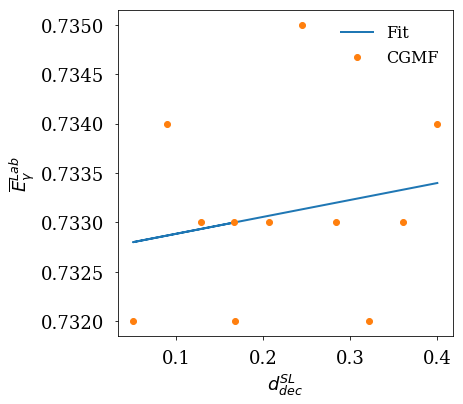

[ 0.00249818  0.83011494]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.0E-06


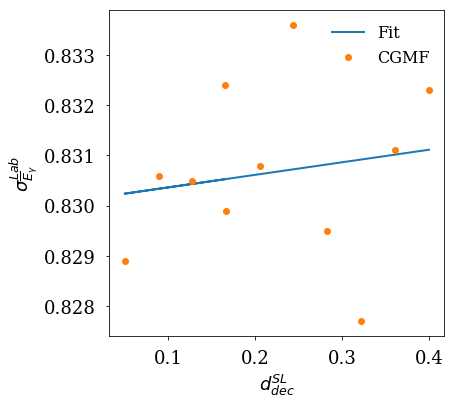

[ -0.37806035  87.92049234]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.3E-04


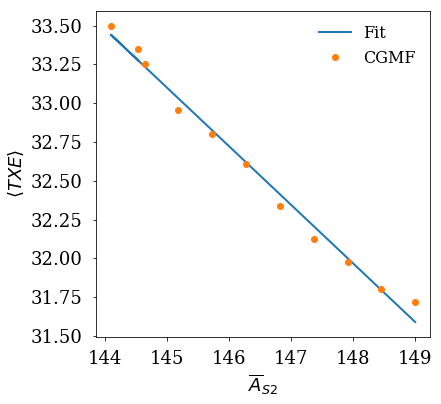

[ -0.12203222  28.3333742 ]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 5.2E-05


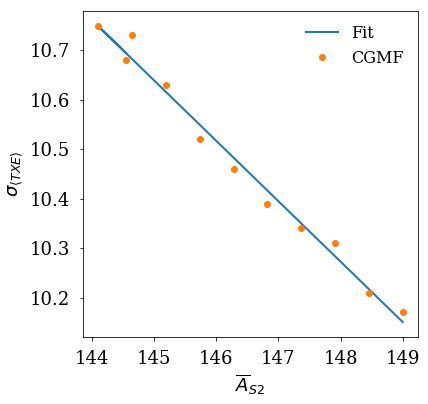

[  -0.39113054  241.35527133]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.8E-05


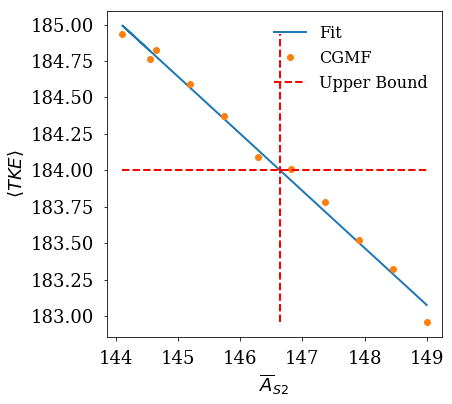

[ 0.09004694 -1.78176727]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.2E-04


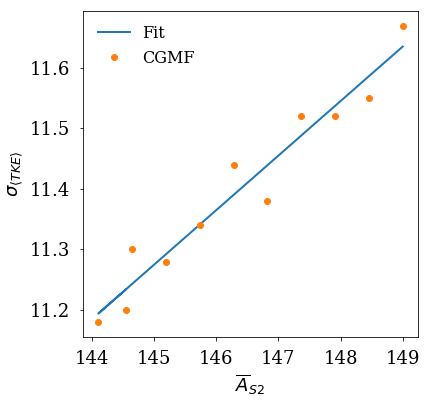

[  8.81762607e-04   1.06943931e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.5E-05


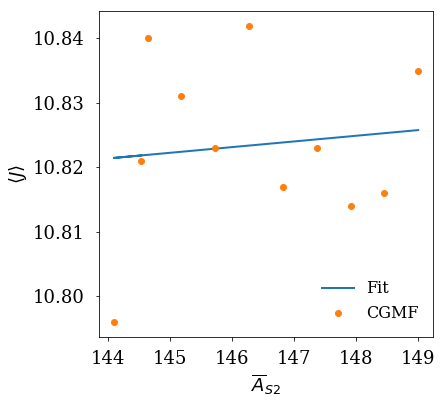

[ 0.01642928  3.70137708]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.2E-05


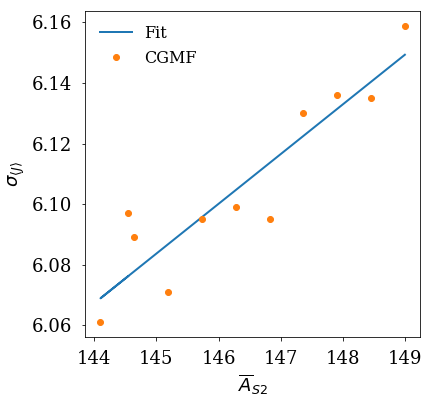

[-0.04200492  9.94824815]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{\nu}$. 
chi^2/dof = 1.3E-05


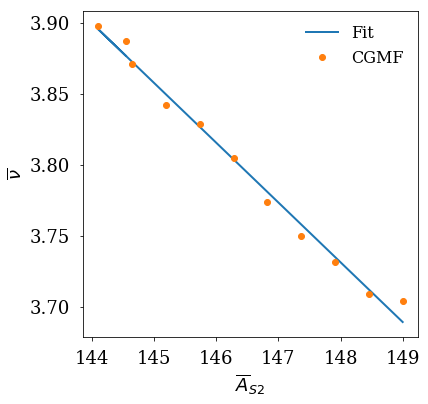

[ -0.28532791  54.38519976]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.5E-04


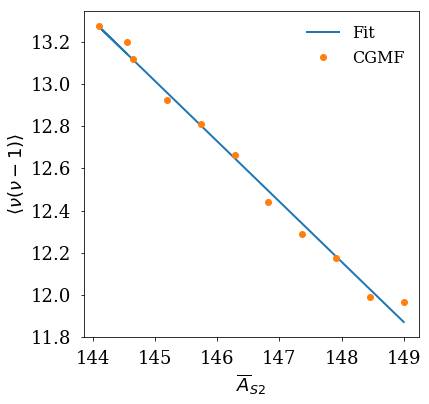

[  -1.21686964  214.21649516]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 9.2E-04


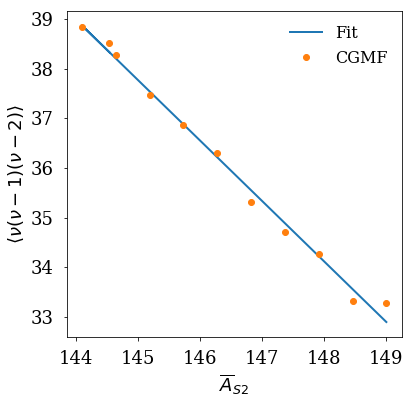

[ 0.0448824   2.88140034]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.6E-05


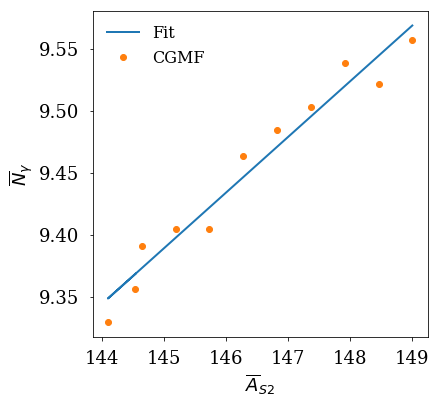

[  0.88962065 -35.79104479]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.7E-04


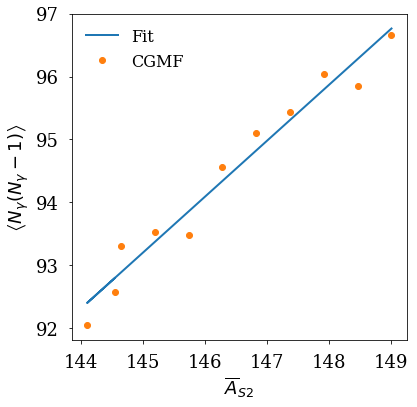

[   14.10014058 -1070.04024027]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.8E-02


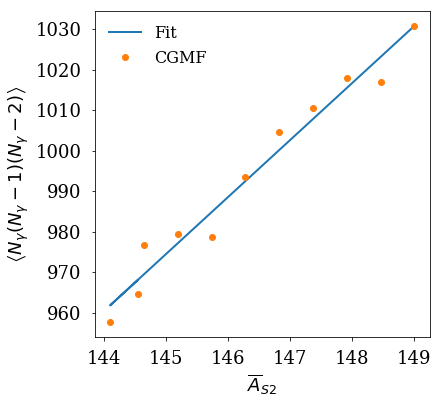

[-0.01995711  4.77461809]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.4E-06


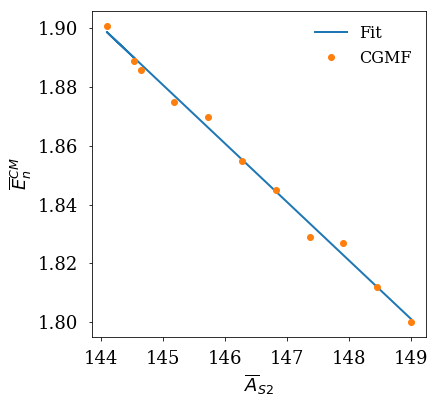

[-0.01887218  4.31745686]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 5.1E-06


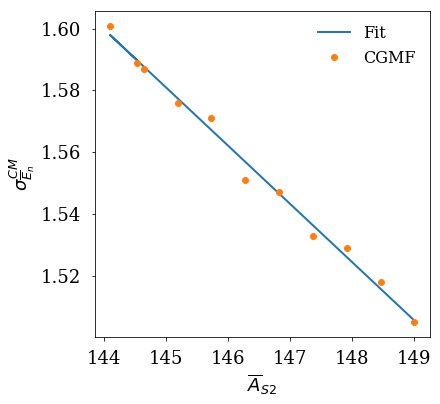

[-0.00332643  1.37915421]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 6.0E-06


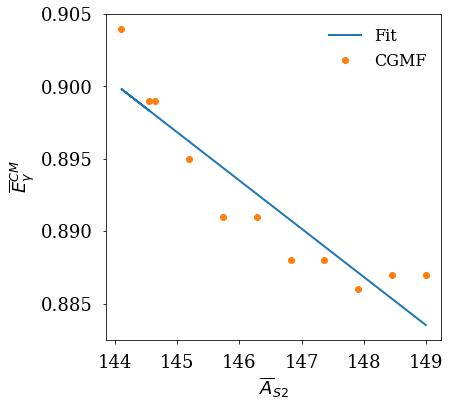

[-0.00854248  2.10588774]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.4E-06


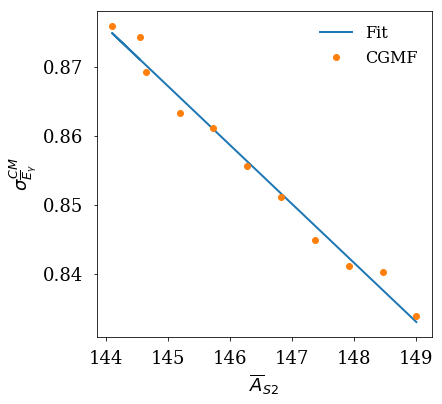

[-0.02243077  5.35913672]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.1E-06


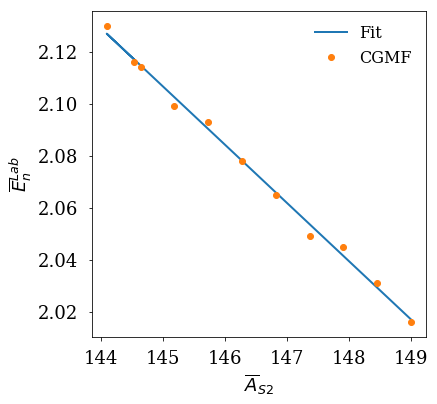

[-0.01897237  4.37666645]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 5.8E-06


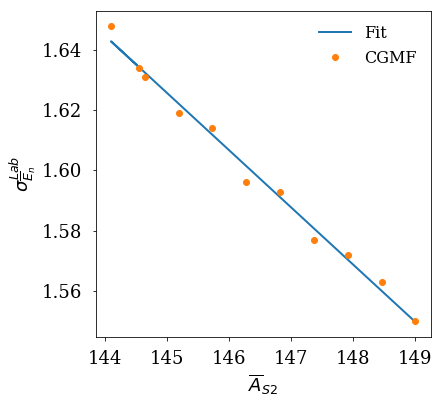

[-0.00328452  1.20692887]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 4.3E-06


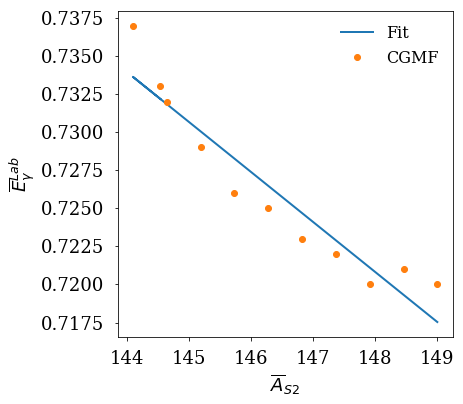

[-0.00699857  1.84151743]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.5E-06


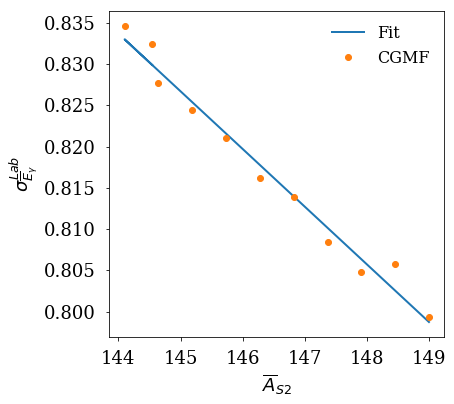

[ -0.08636392  45.10387829]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.2E-04


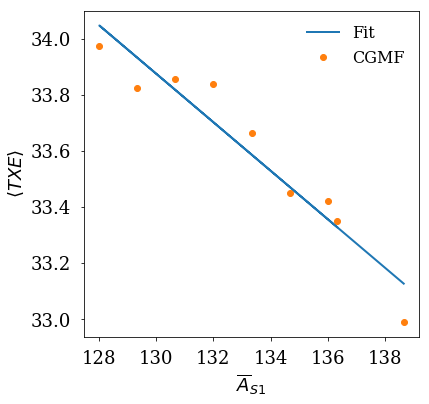

[ 0.03036193  6.55068804]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.6E-04


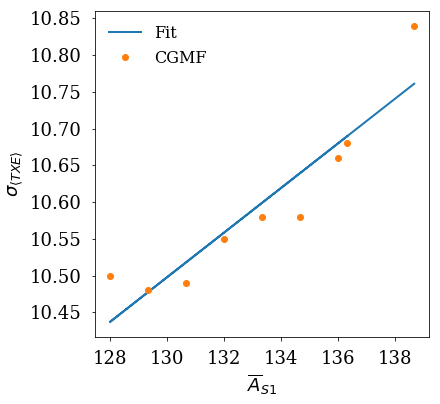

[ -3.54764919e-02   1.89611126e+02]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.4E-05


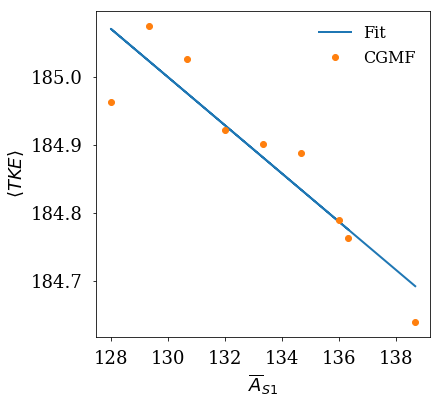

[ -0.03730375  16.29633399]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.4E-04


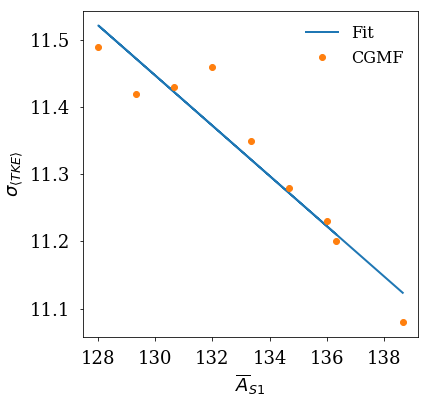

[ -7.97585165e-03   1.19228896e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.3E-05


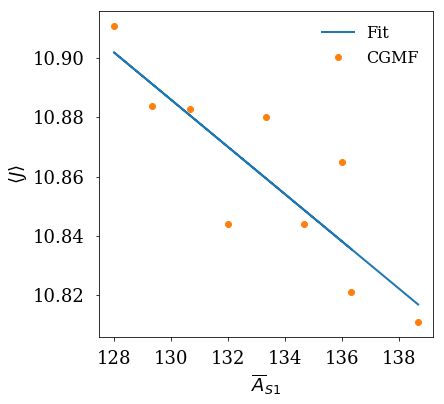

[ -6.12379967e-03   6.90604502e+00]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 4.4E-05


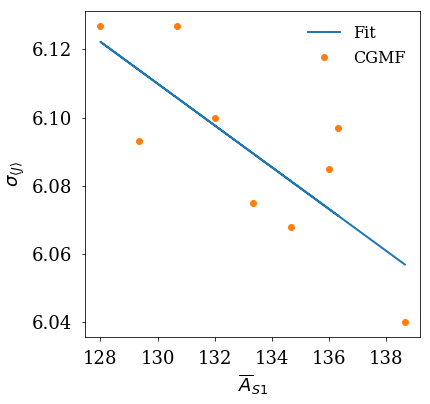

[ -1.43808391e-03   4.07680616e+00]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{\nu}$. 
chi^2/dof = 2.3E-05


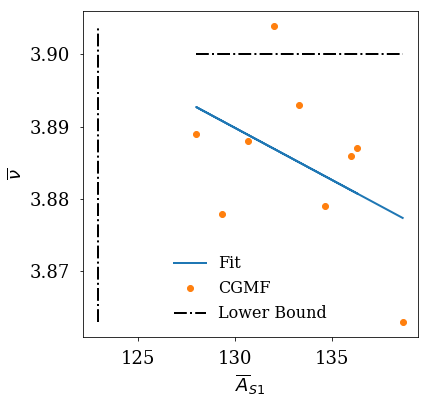

[ -3.63642438e-03   1.36610061e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 2.4E-04


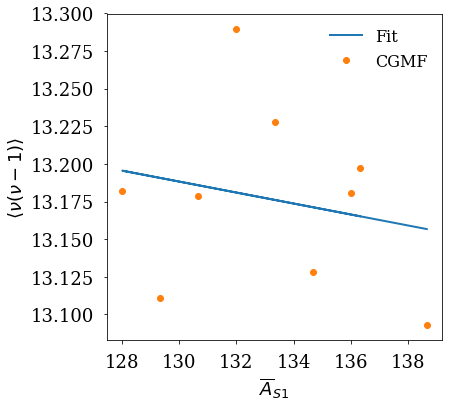

[  1.45481960e-03   3.81705198e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.3E-03


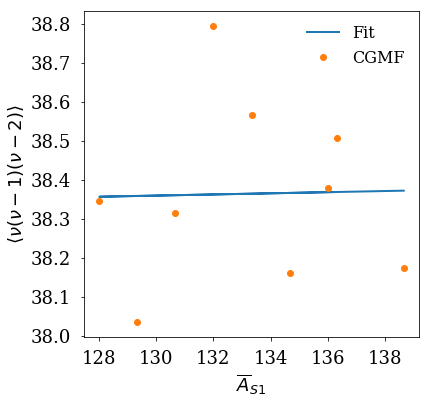

[ 0.01033055  7.96630285]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 4.8E-05


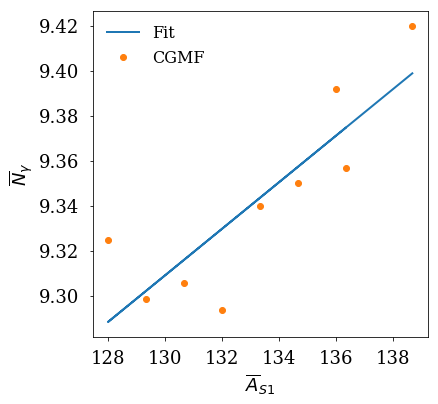

[  0.1479685   72.59638964]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.6E-03


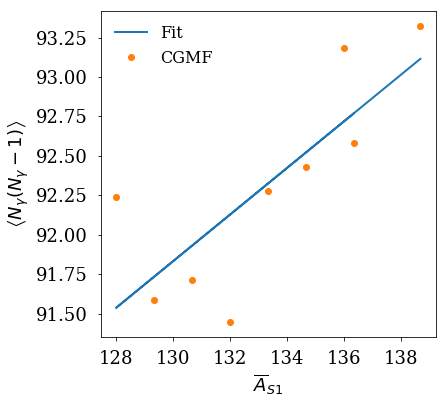

[   1.50122368  760.42336755]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 3.9E-02


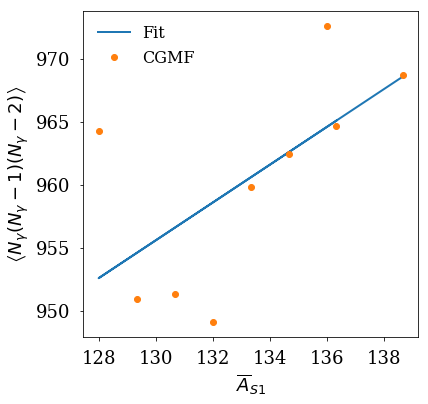

[-0.00353175  2.37061719]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 7.0E-06


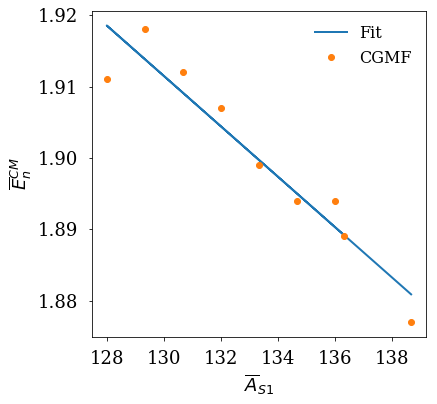

[-0.0028655   1.97752412]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 4.5E-06


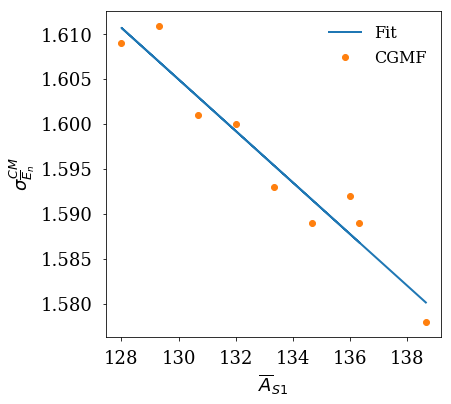

[-0.00381194  1.41805565]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.4E-06


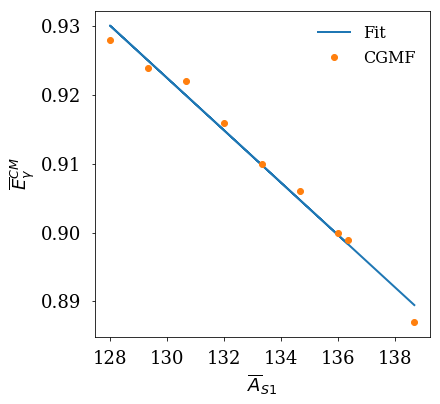

[-0.00240391  1.19980785]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 7.2E-06


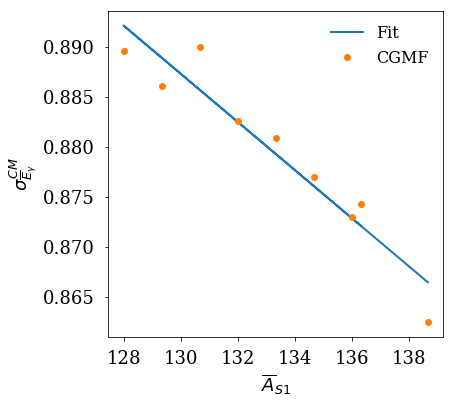

[-0.00326731  2.55938823]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 5.4E-06


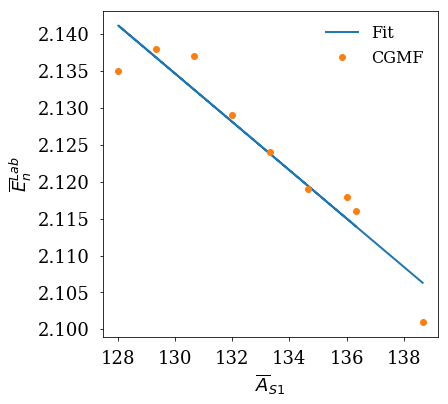

[-0.00249597  1.9727394 ]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 3.1E-06


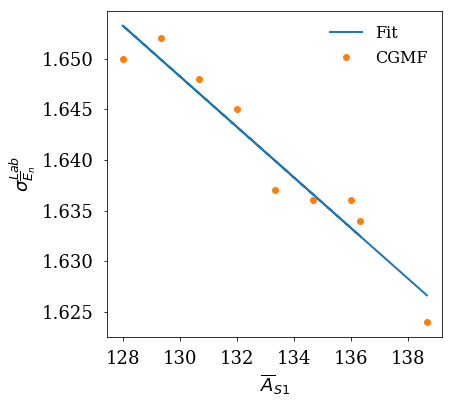

[-0.00304622  1.14760039]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 4.8E-06


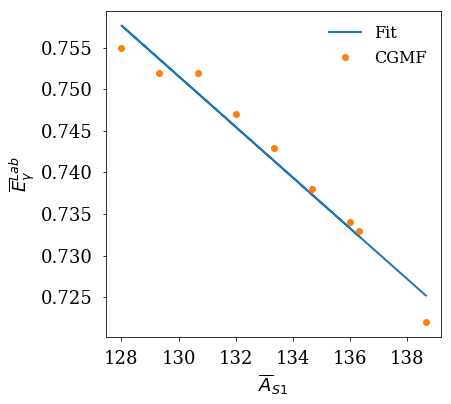

[-0.0028326   1.21740748]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 8.1E-06


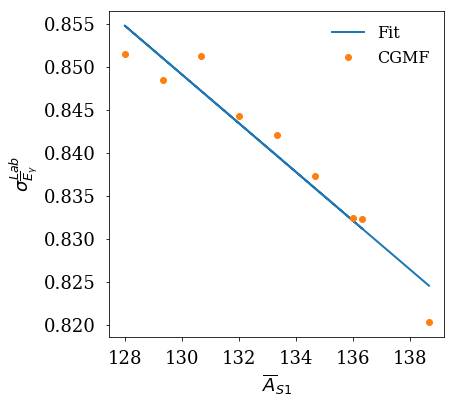

[  0.2498092   31.79037398]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 3.3E-05


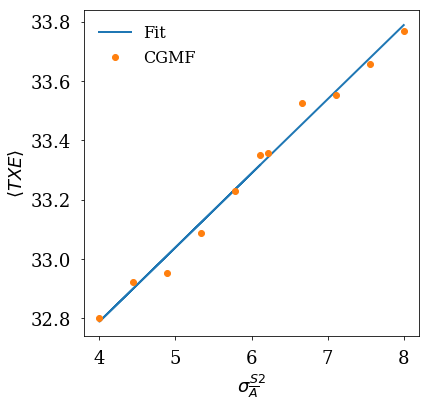

[ 0.15421397  9.73771948]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 3.1E-05


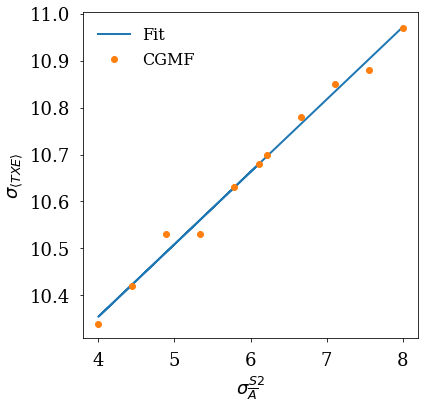

[ -1.13871269e-01   1.85475457e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.0E-05


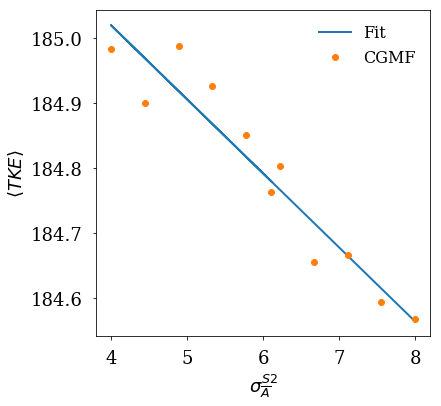

[  0.10759056  10.58156256]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.1E-04


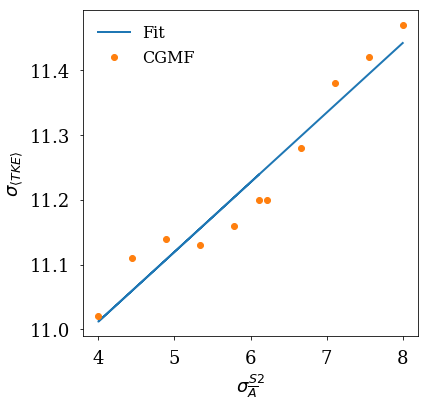

[  3.95683453e-03   1.08086740e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.1E-05


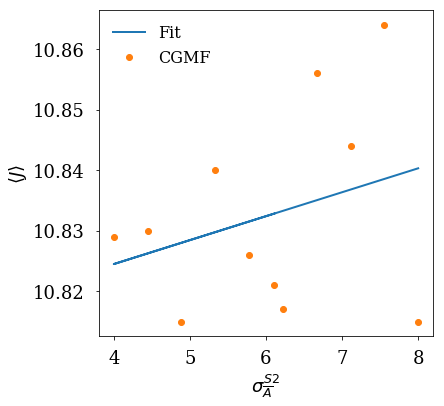

[ 0.02331661  5.93832171]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.9E-05


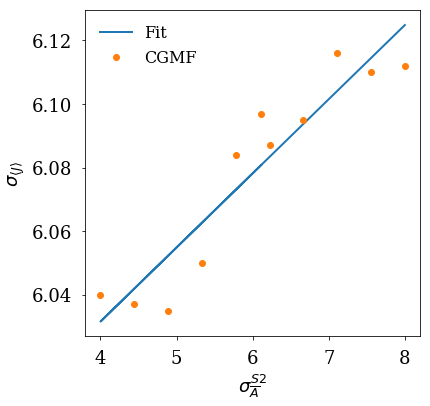

[  2.10597501e-03   3.86716127e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 6.3E-06


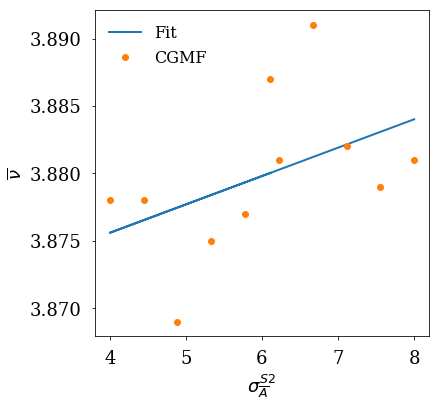

[ -4.32966734e-03   1.31802031e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 9.2E-05


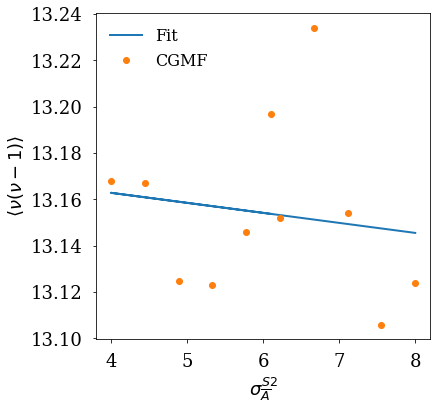

[ -0.15910237  39.27393251]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.4E-04


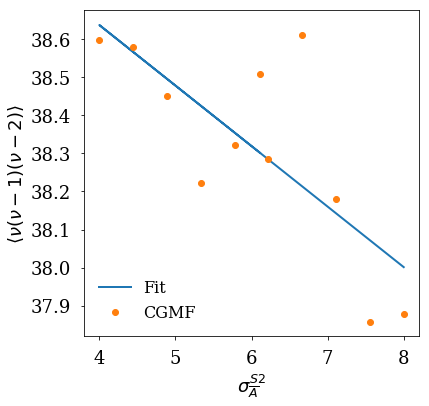

[-0.04013909  9.61805411]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.6E-05


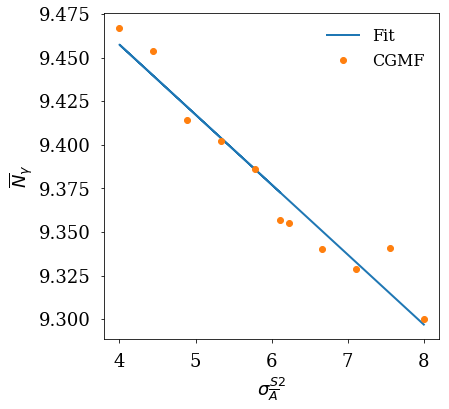

[ -0.66206075  96.90525785]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 3.7E-04


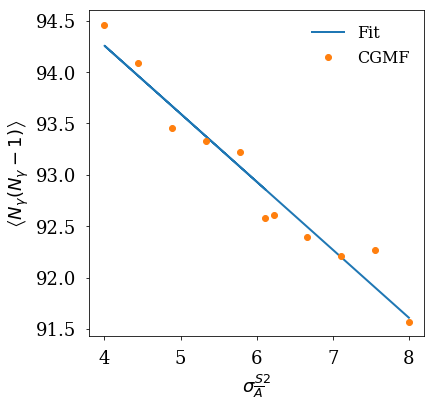

[   -8.2560045   1018.69131433]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 7.1E-03


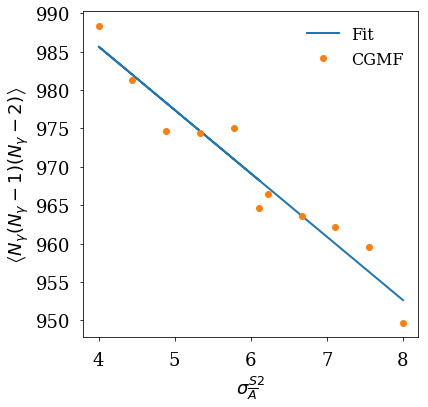

[ 0.01536199  1.79585628]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 6.4E-06


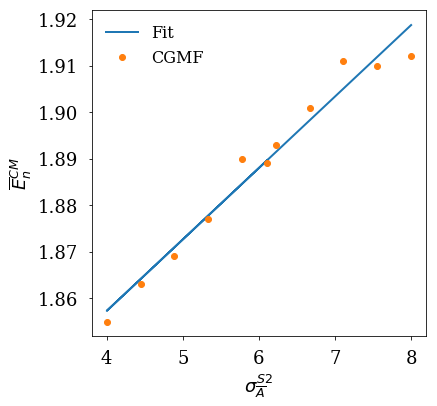

[ 0.01328133  1.50772464]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.5E-05


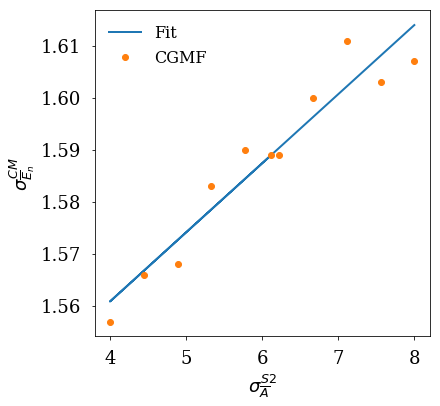

[ 0.01288318  0.82057209]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 8.9E-07


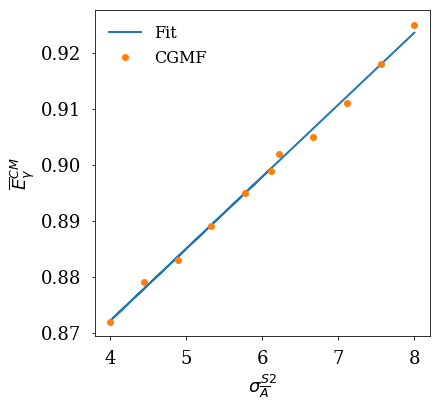

[ 0.00816707  0.82142498]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 2.6E-06


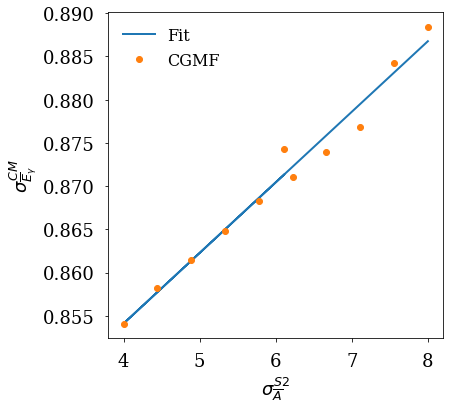

[ 0.00971468  2.05770567]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 5.5E-06


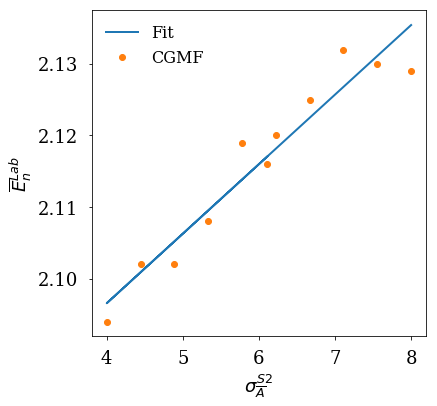

[ 0.01145555  1.5636976 ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.1E-05


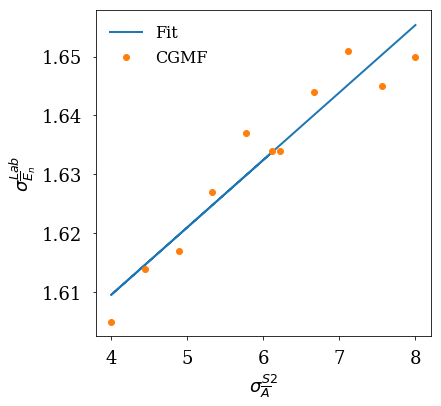

[ 0.01105856  0.66535623]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 6.2E-07


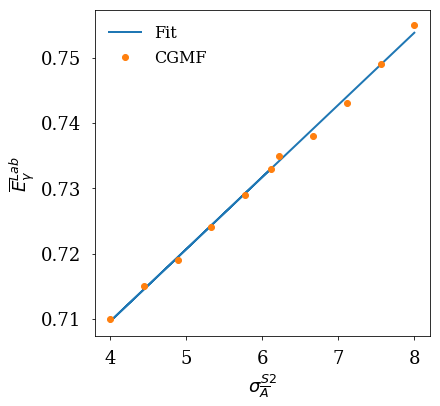

[ 0.0094713   0.77245929]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.7E-06


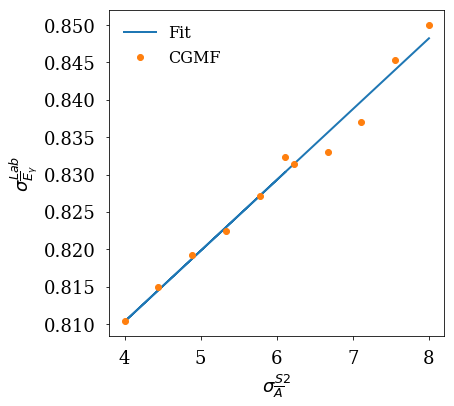

[ -0.06889606  33.61012885]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.3E-05


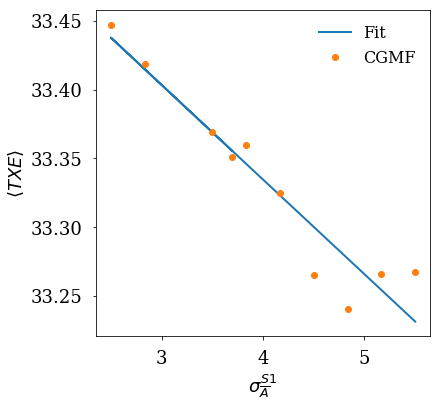

[  0.05871108  10.49004985]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 4.2E-05


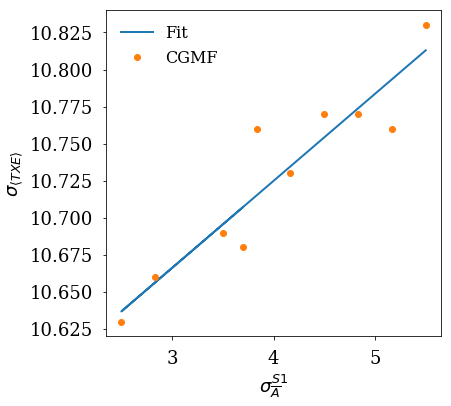

[ -6.97002319e-03   1.84777049e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 3.9E-06


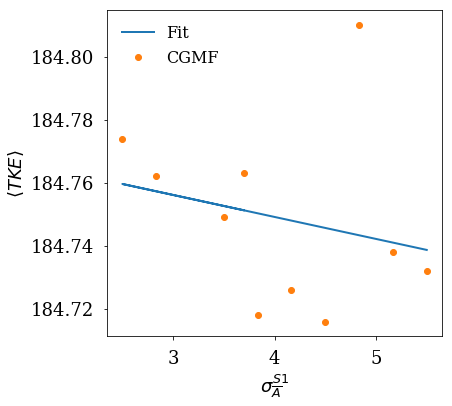

[ -4.08321652e-03   1.12445489e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 7.3E-05


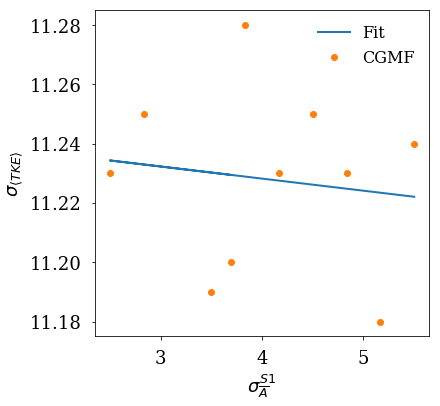

[  4.13042966e-03   1.08053598e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.2E-05


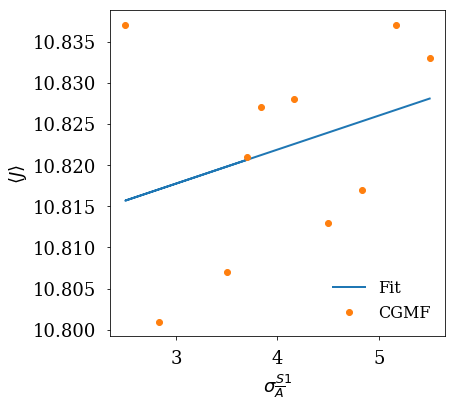

[  5.33406613e-03   6.05298156e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 5.0E-05


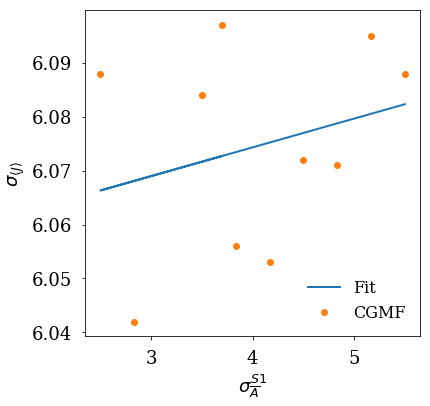

[-0.01320502  3.93371861]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 1.8E-06


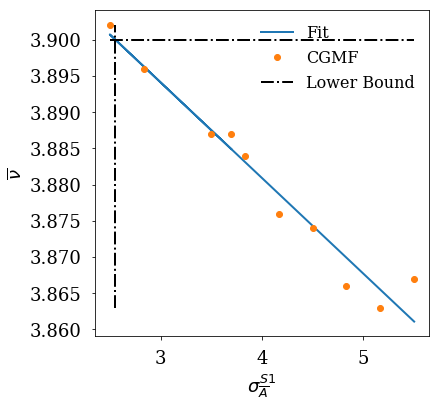

[ -0.06207992  13.4199037 ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 3.6E-05


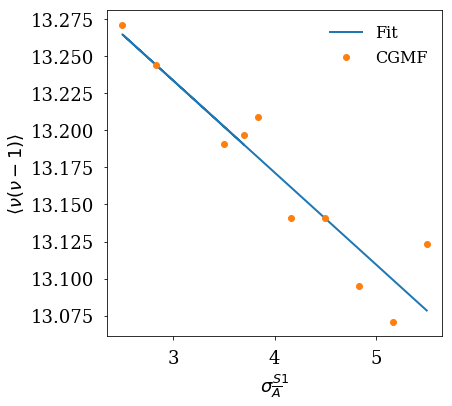

[ -0.17236818  39.118291  ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 4.2E-04


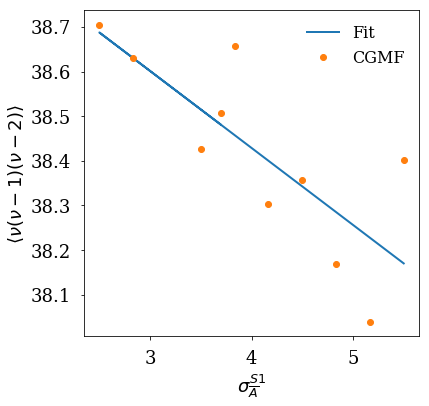

[ 0.01670887  9.29658061]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 8.3E-06


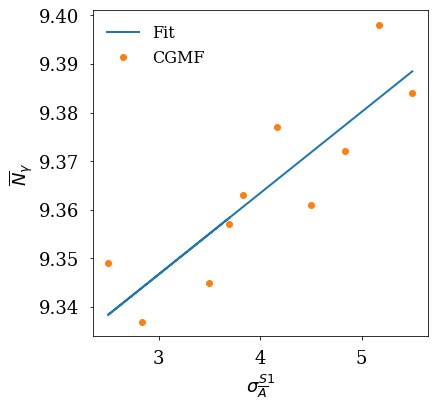

[  0.33877831  91.29146539]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 3.3E-04


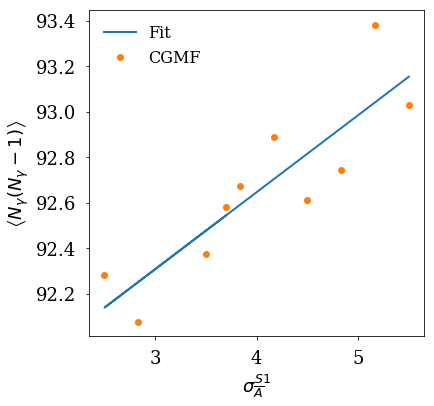

[   5.23120637  943.75444372]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 8.0E-03


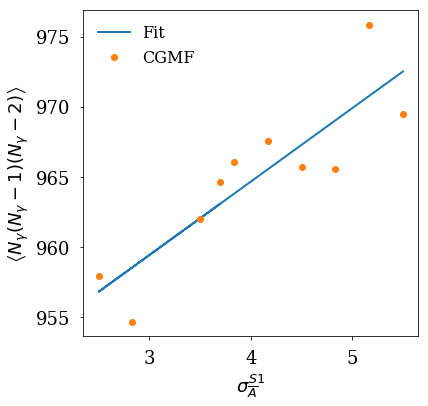

[ -1.20415182e-03   1.89598031e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 5.4E-06


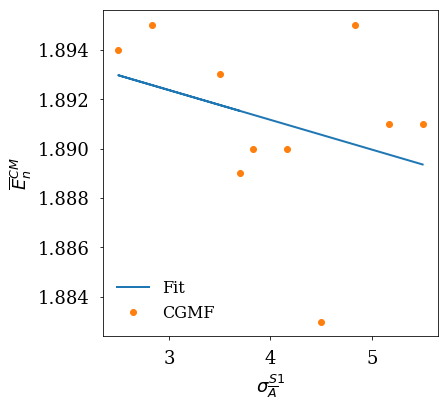

[  5.59635616e-04   1.58683185e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.1E-05


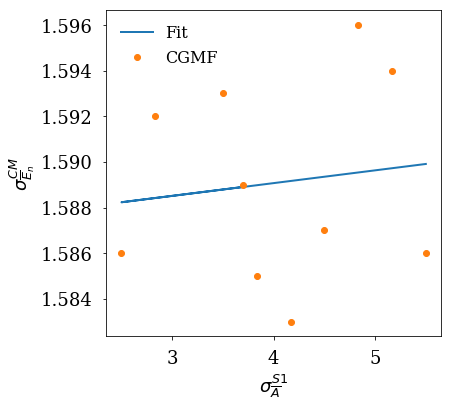

[ -3.88433804e-04   9.01174283e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.1E-06


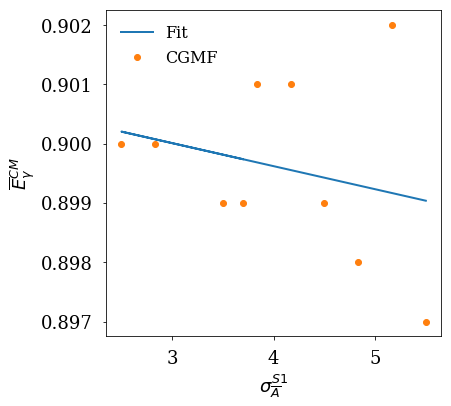

[ -2.39407293e-04   8.72240294e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.4E-06


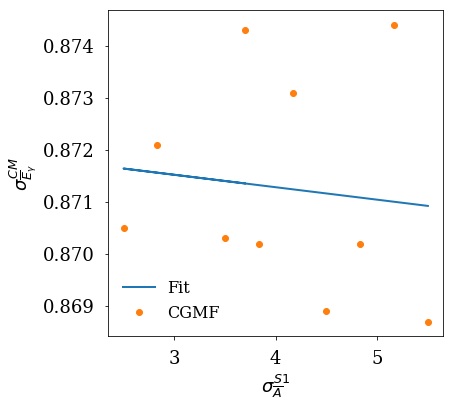

[ -1.78092284e-03   2.12391790e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 4.0E-06


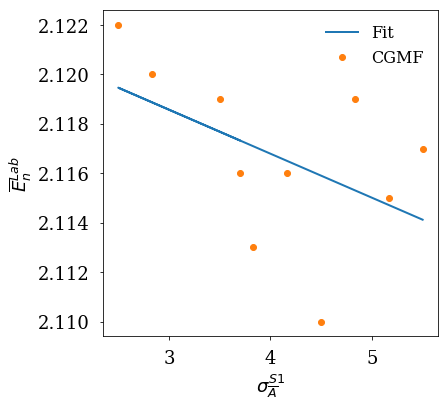

[  1.43384592e-04   1.63361888e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.2E-05


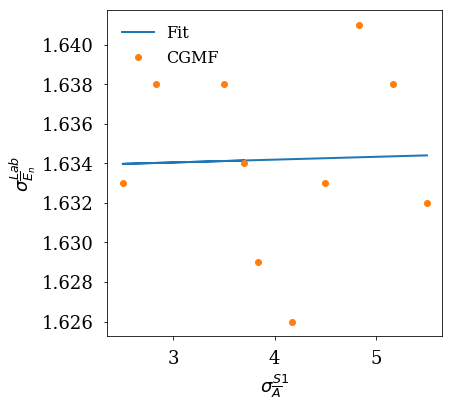

[ -5.19895057e-04   7.35307083e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 7.2E-07


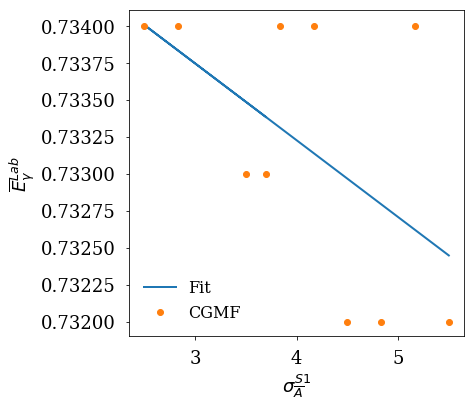

[  1.04189837e-04   8.30237729e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.6E-06


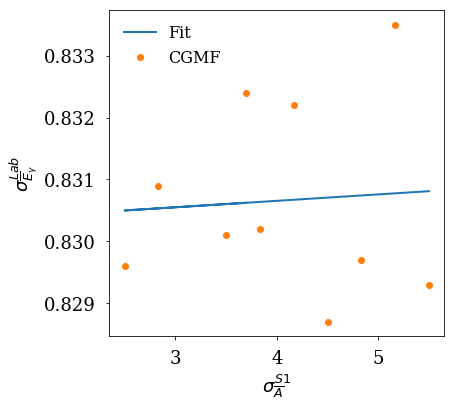

[ -8.04160870e-03   3.34776492e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 4.5E-05


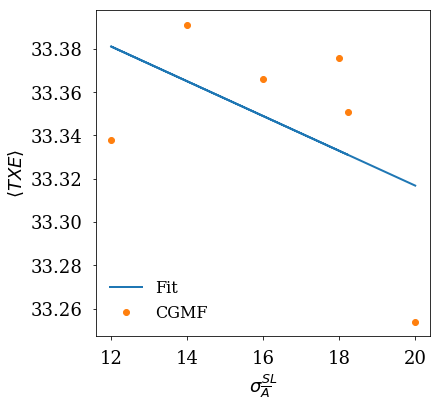

[ -0.02387443  11.13084821]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 8.1E-05


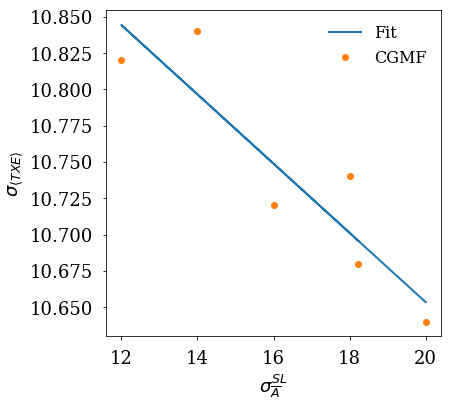

[ -3.19790307e-03   1.84857186e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 8.9E-06


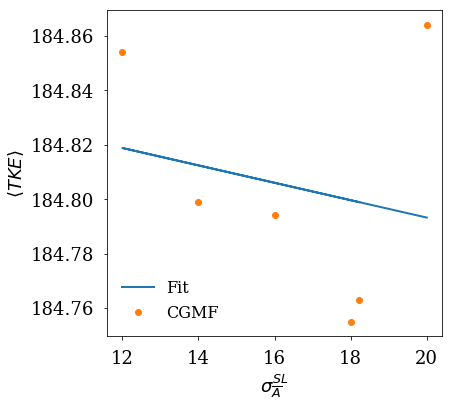

[ -2.84006768e-03   1.12848281e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 3.2E-05


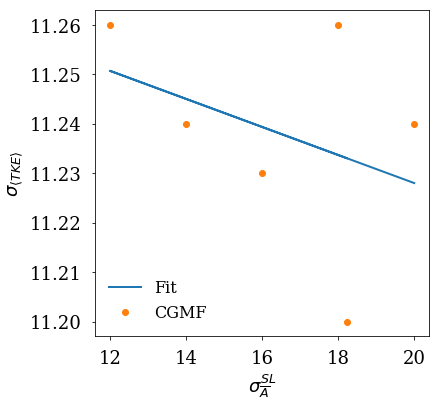

[  2.57452940e-03   1.07835190e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.4E-05


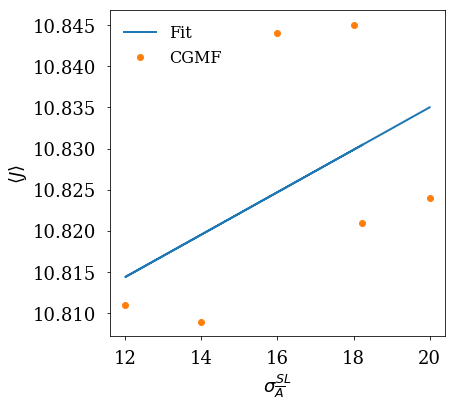

[  4.78918395e-03   5.99642960e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.8E-05


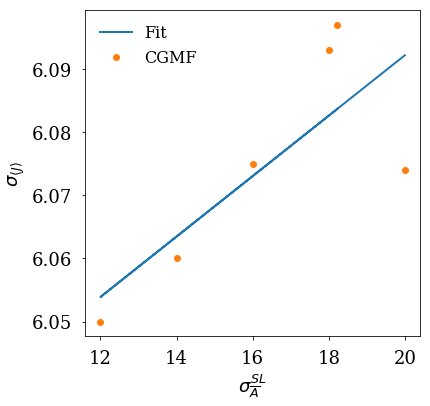

[  1.58285109e-04   3.87857538e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 8.0E-06


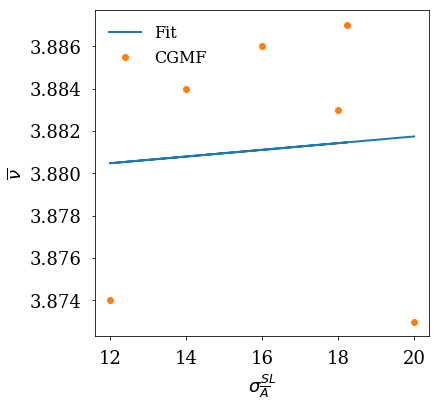

[ -3.51014509e-03   1.32377979e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.2E-04


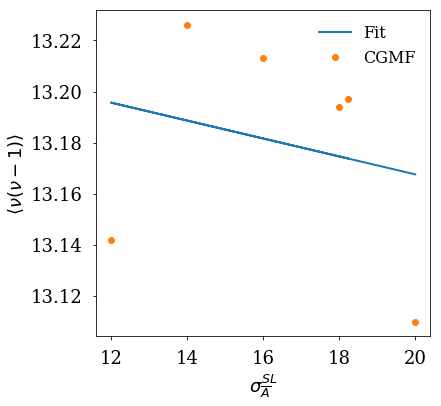

[ -3.48382693e-02   3.90726706e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 9.4E-04


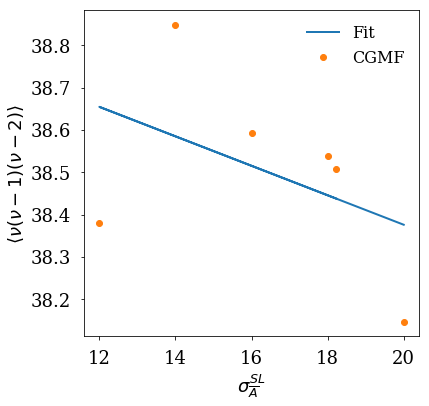

[  2.52553693e-03   9.32398777e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 2.0E-05


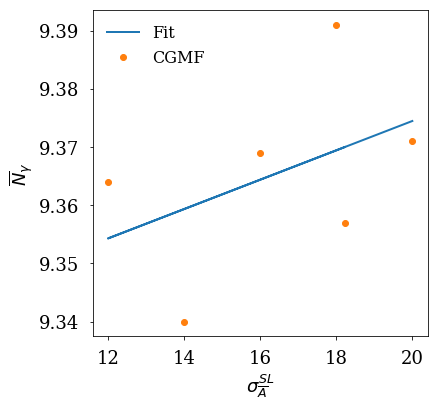

[  6.05170088e-02   9.17337760e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.1E-04


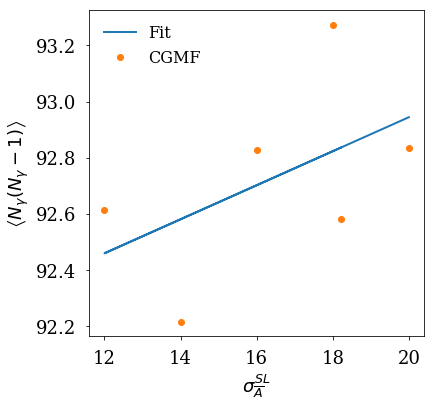

[   1.09789249  948.55806879]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.4E-02


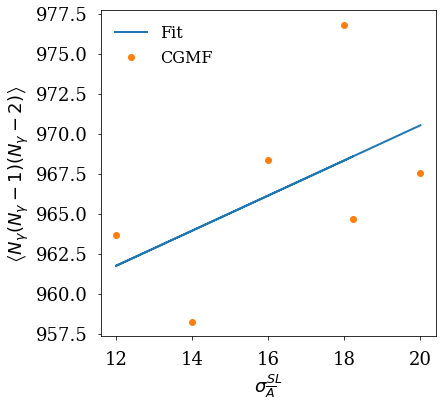

[ -8.63328003e-04   1.90946688e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.3E-06


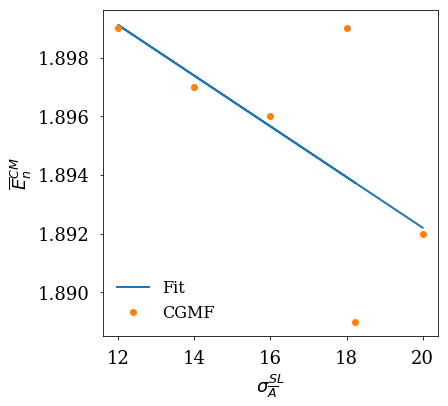

[ -7.74135420e-04   1.60534004e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 2.0E-06


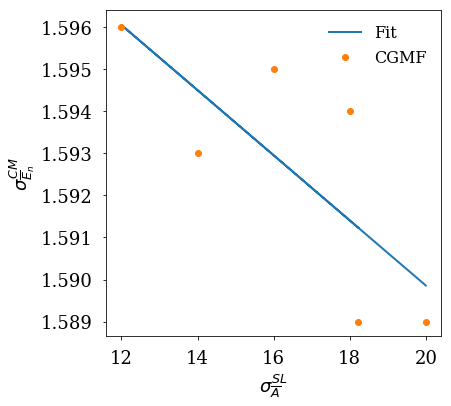

[ -6.64842781e-04   9.11384141e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 7.4E-07


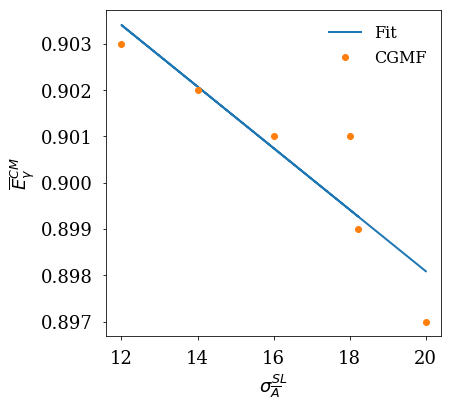

[ -6.96298123e-04   8.84049097e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.0E-06


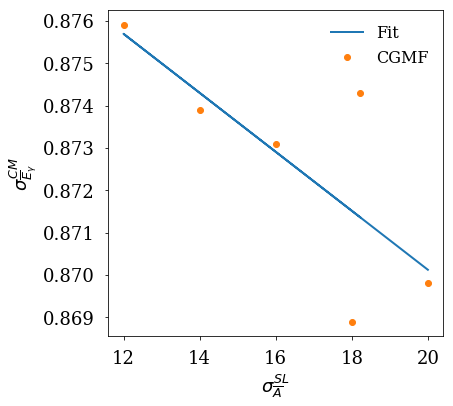

[ -2.63906712e-04   2.12465375e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.7E-06


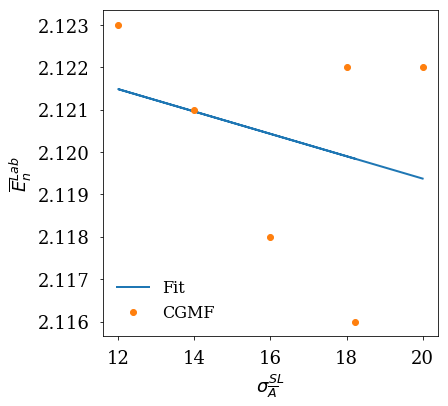

[ -9.90499948e-04   1.65188214e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.4E-06


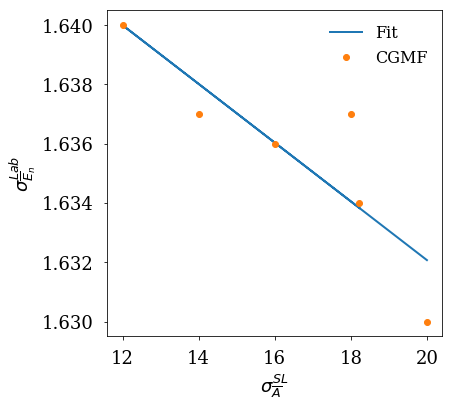

[ -5.94299969e-04   7.43729285e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 9.4E-08


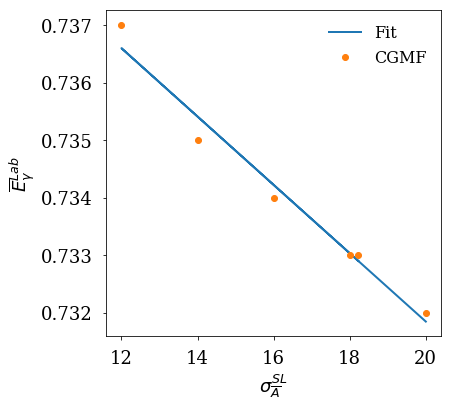

[ -6.14796587e-04   8.41714835e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.2E-06


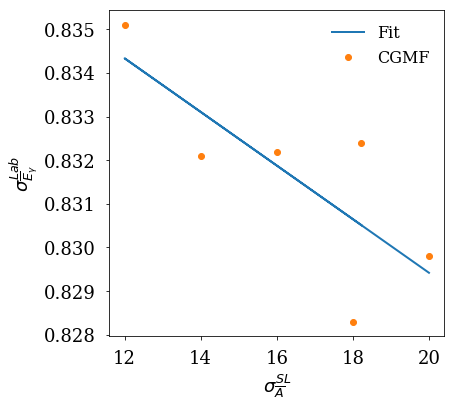

In [6]:
# rembember that the nominal values for the parameters and responses is the first element of each array

SRx = {}
ki = 0

for k in param_keys:
    SRx[k] = {}
    Ri = 0
    for R in response_keys:
        SRx[k][R] = get_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0])
        test_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0], param_labels[ki], response_labels[Ri])
        Ri +=1
    ki +=1

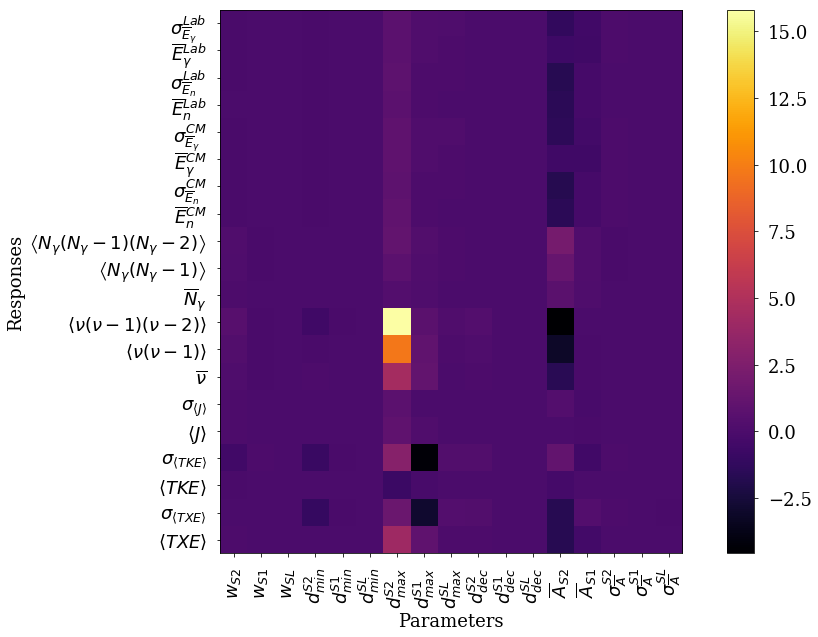

In [7]:
# Make the cool overall imshow plot with all responses and parameters

fig, axes = pl.subplots(1, 1, figsize=(10,10))

# transfer SRx library to a 2d array
SRxArr = np.zeros((len(response_keys), len(param_keys)))

for i in range(len(response_keys)):
    for j in range(len(param_keys)):
        SRxArr[i,j] = SRx[param_keys[j]][response_keys[i]]
        


plt.xlabel('Parameters')
plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr,  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

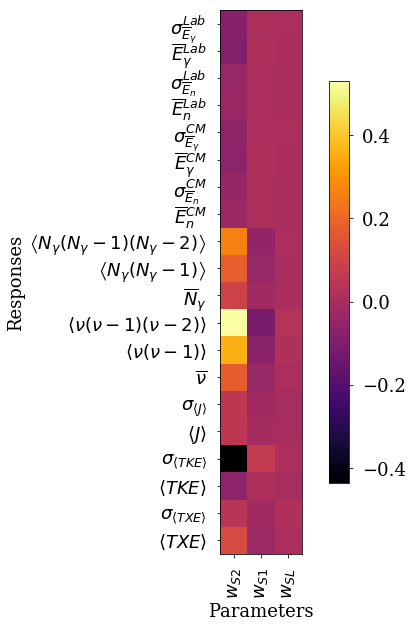

In [8]:
# Make the cool overall imshow plot with all responses and SELECT parameters
fig, axes = pl.subplots(1, 1, figsize=(6,10))
plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[0:3], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,0:3],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

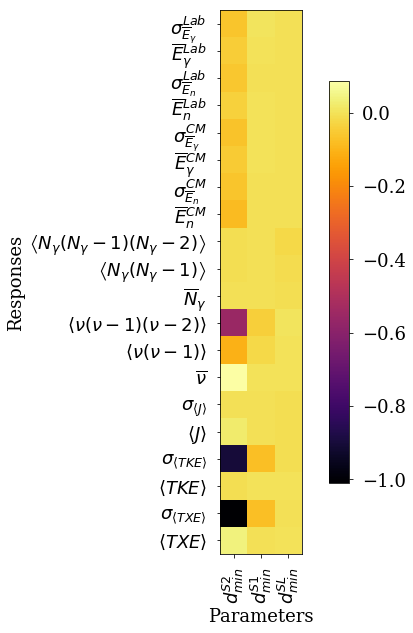

In [9]:
# Make the cool overall imshow plot with all responses and SELECT parameters
fig, axes = pl.subplots(1, 1, figsize=(6,10))
plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[3:6], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,3:6],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

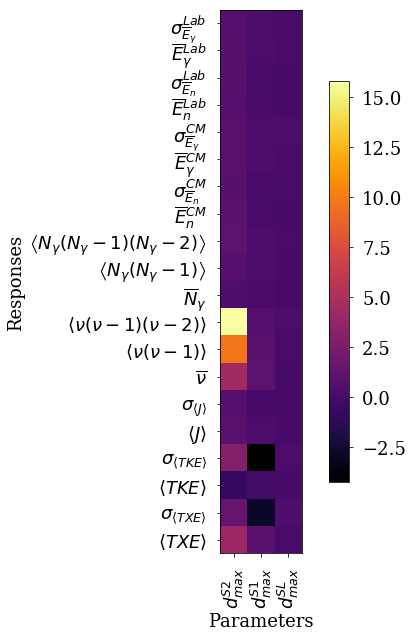

In [10]:
# Make the cool overall imshow plot with all responses and SELECT parameters
fig, axes = pl.subplots(1, 1, figsize=(6,10))
plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[6:9], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,6:9],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

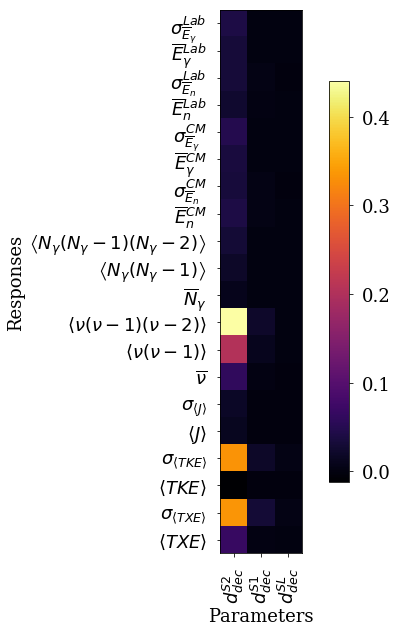

In [11]:
# Make the cool overall imshow plot with all responses and SELECT parameters
fig, axes = pl.subplots(1, 1, figsize=(6,10))
plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[9:12], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,9:12],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

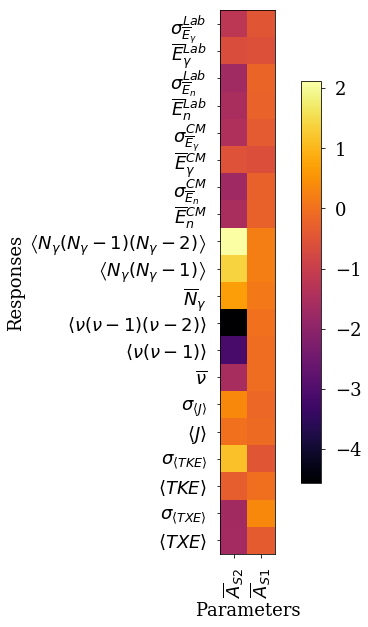

In [12]:
# Make the cool overall imshow plot with all responses and SELECT parameters

fig, axes = pl.subplots(1, 1, figsize=(6,10))

plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[12:14], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,12:14],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

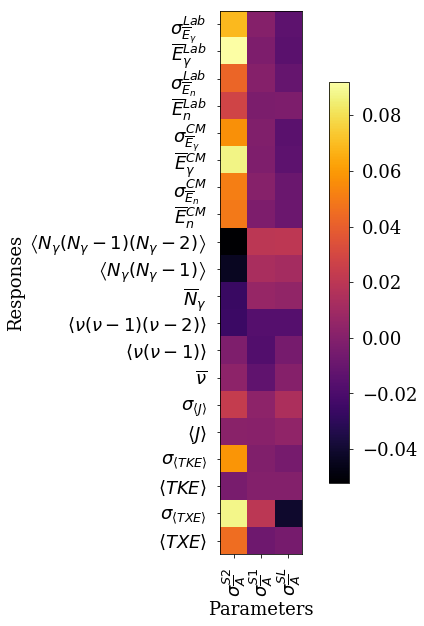

In [13]:
# Make the cool overall imshow plot with all responses and SELECT parameters

fig, axes = pl.subplots(1, 1, figsize=(6,10))

plt.xlabel('Parameters')
plt.xticks(np.linspace(0,2, 3), param_labels[14:17], rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr[:,14:17],  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

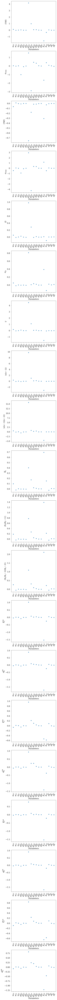

In [14]:
fig, axes = pl.subplots(20,1, figsize=(8,180))

i = 1
for k in range(len(response_keys)):
    plt.subplot(20,1,i)
    plt.plot(np.linspace(0,len(param_keys)-1, len(param_keys)), SRxArr[k,:], 'o')
    plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
    plt.xlabel('Parameters')
    plt.ylabel(response_labels[k])
    i+=1

***************************************
Parameter: w0
***************************************


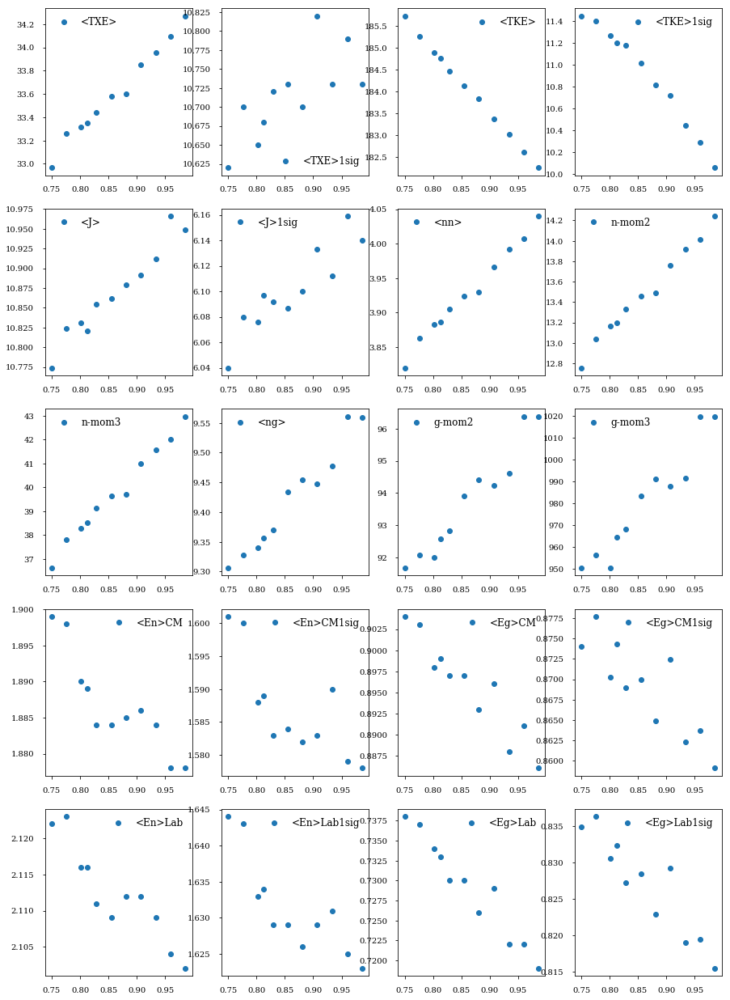

***************************************
Parameter: w1
***************************************


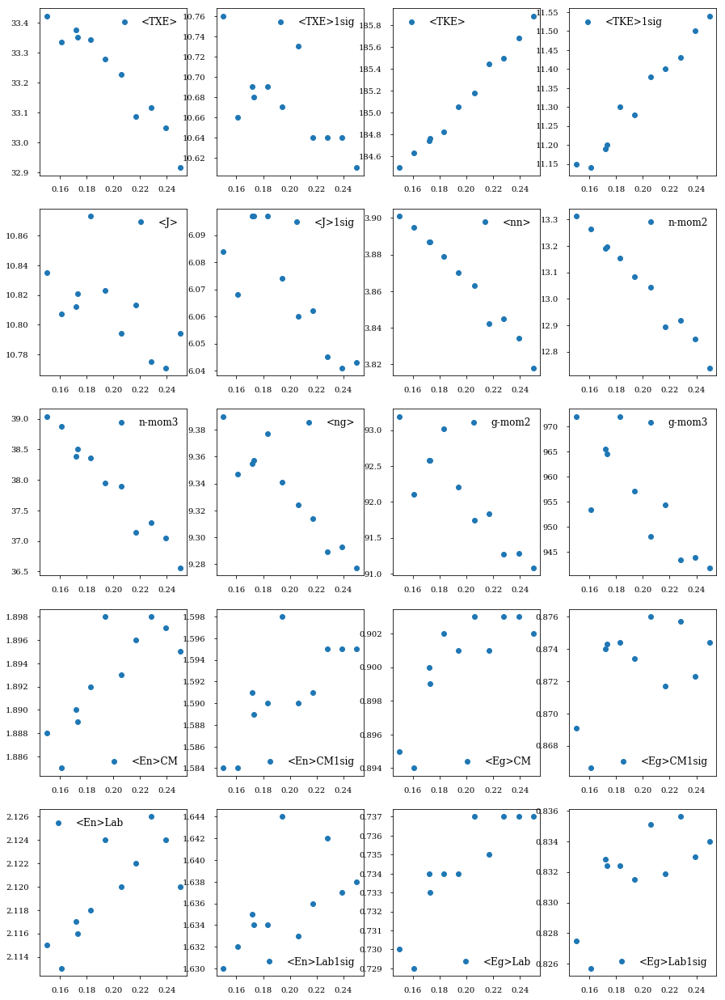

***************************************
Parameter: w2
***************************************


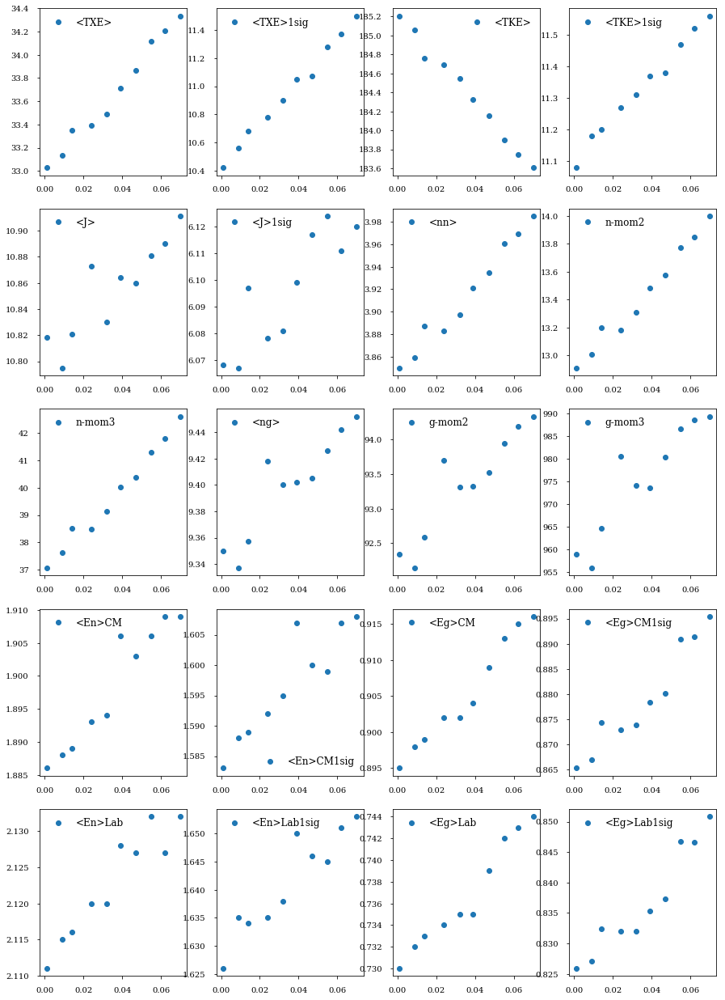

***************************************
Parameter: dmin0
***************************************


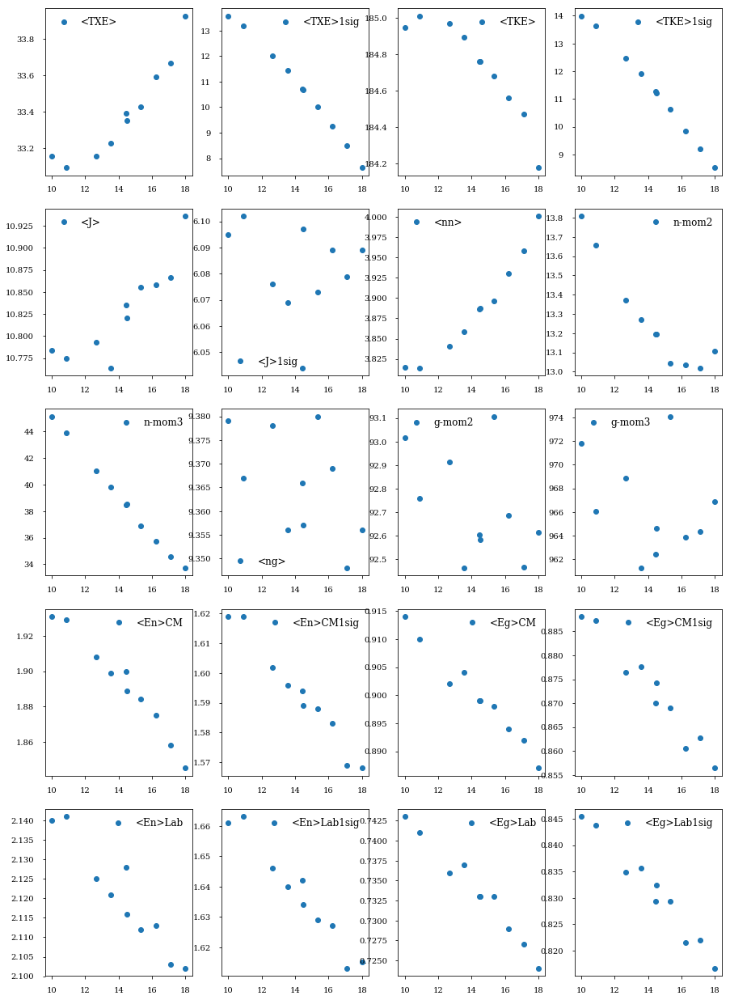

***************************************
Parameter: dmin1
***************************************


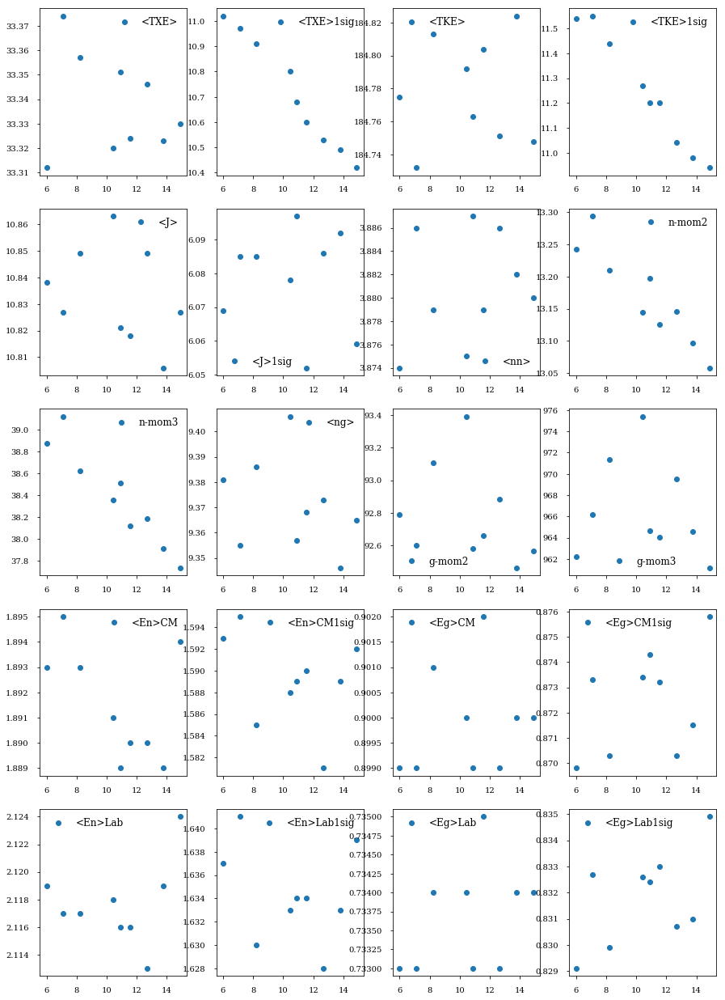

***************************************
Parameter: dmin2
***************************************


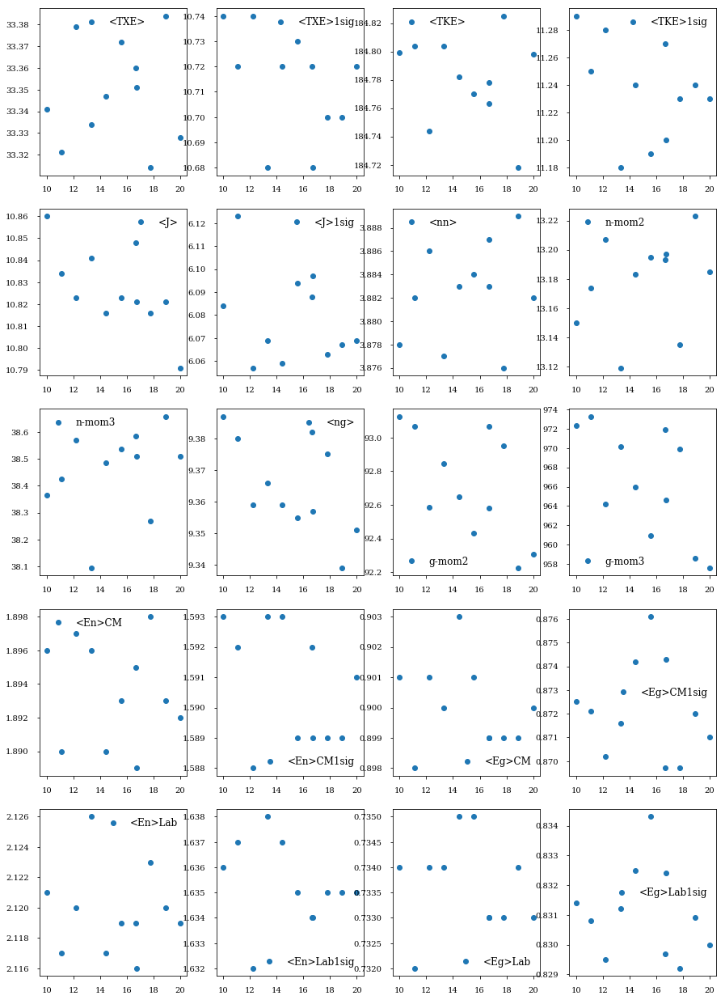

***************************************
Parameter: dmax0
***************************************


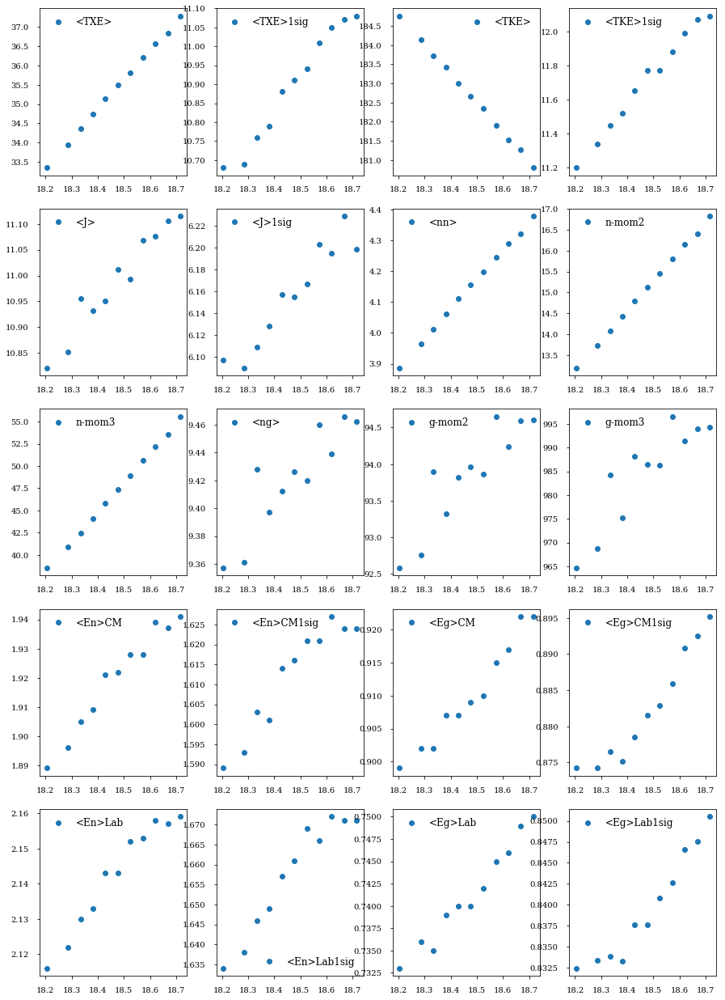

***************************************
Parameter: dmax1
***************************************


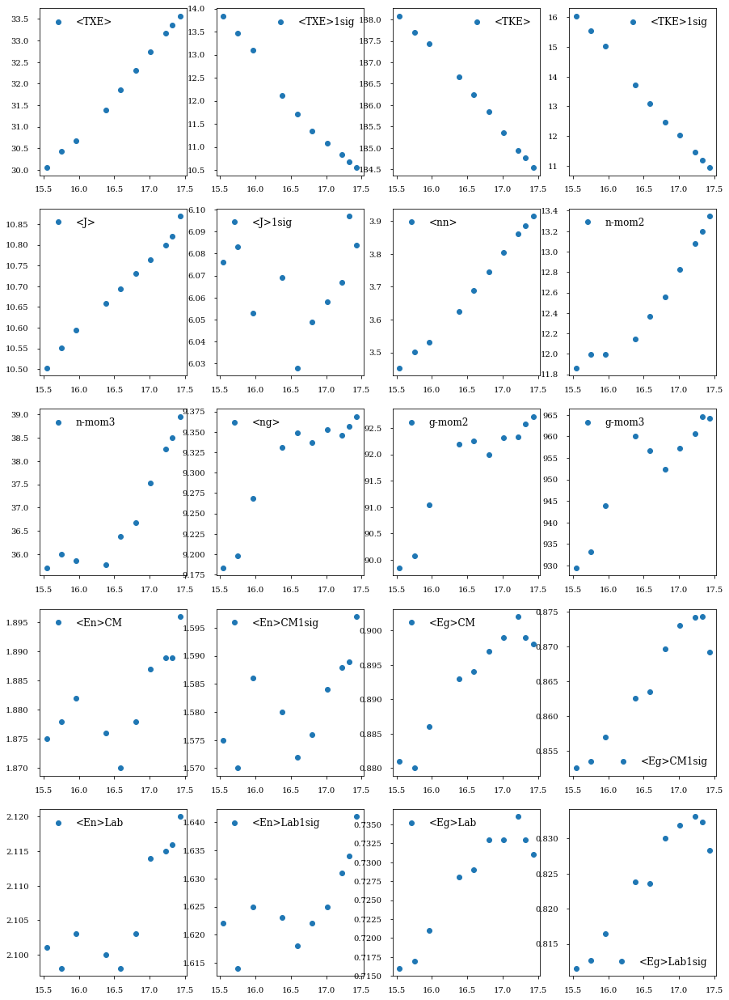

***************************************
Parameter: dmax2
***************************************


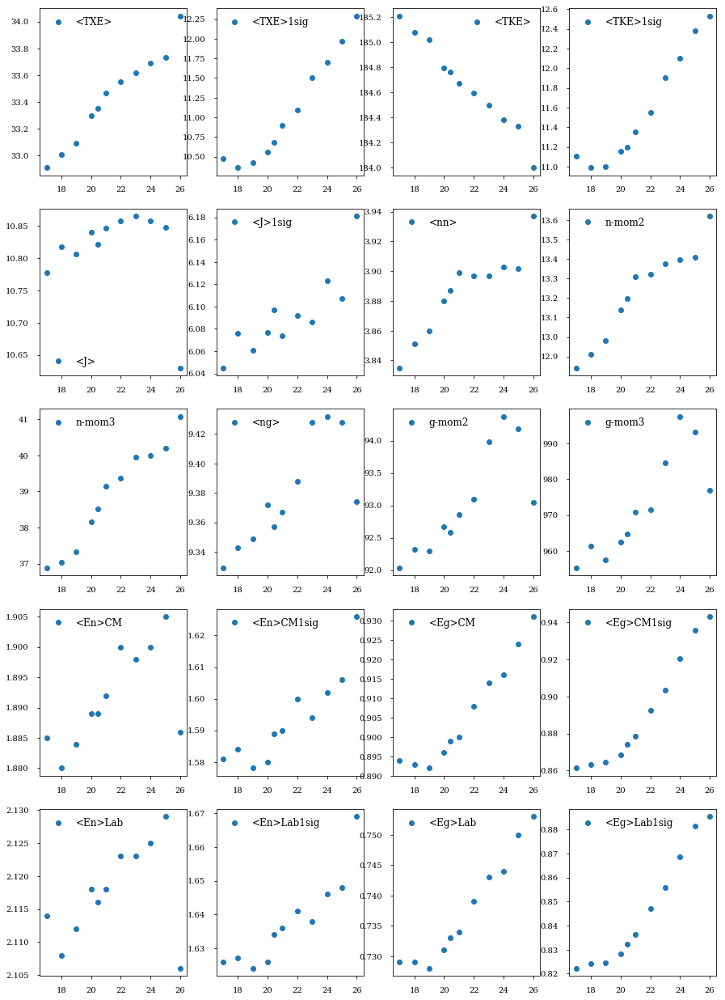

***************************************
Parameter: ddec0
***************************************


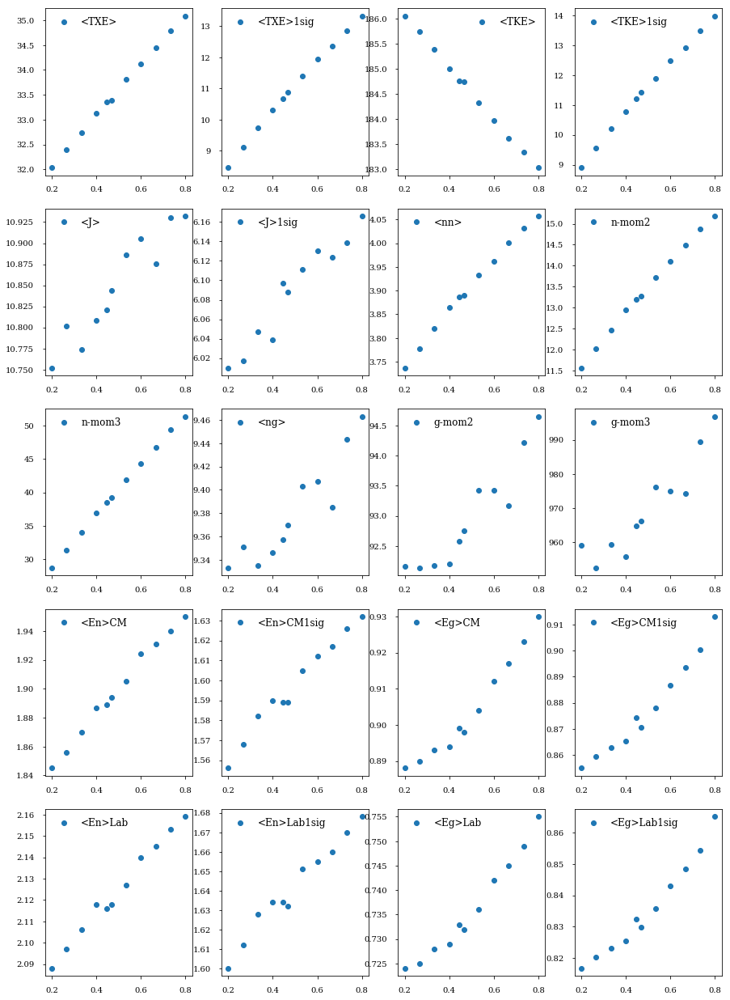

***************************************
Parameter: ddec1
***************************************


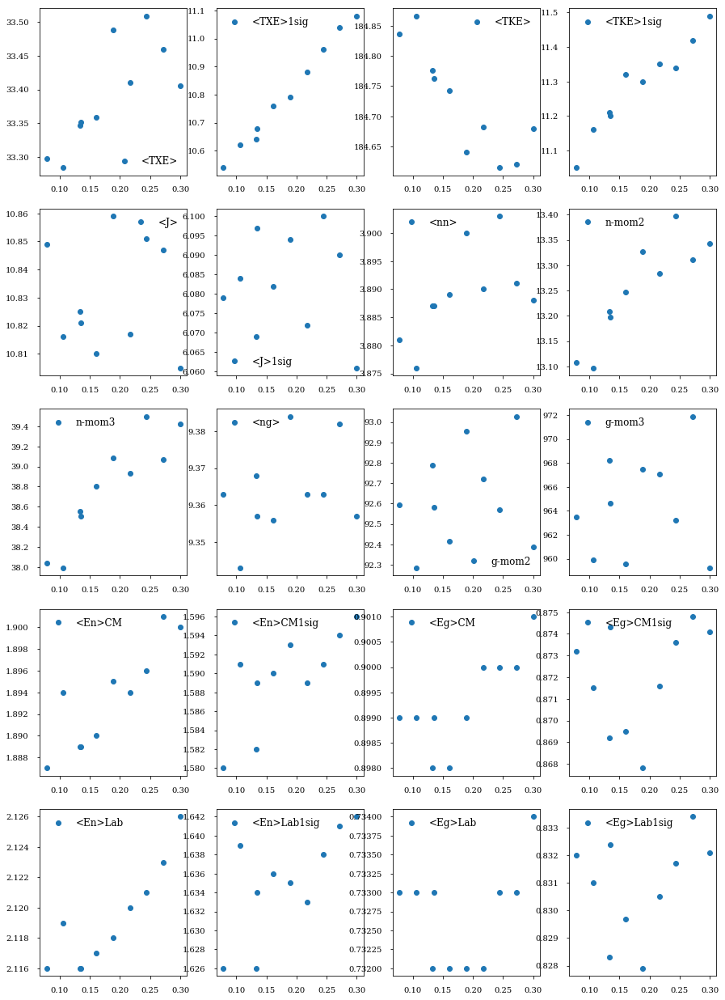

***************************************
Parameter: ddec2
***************************************


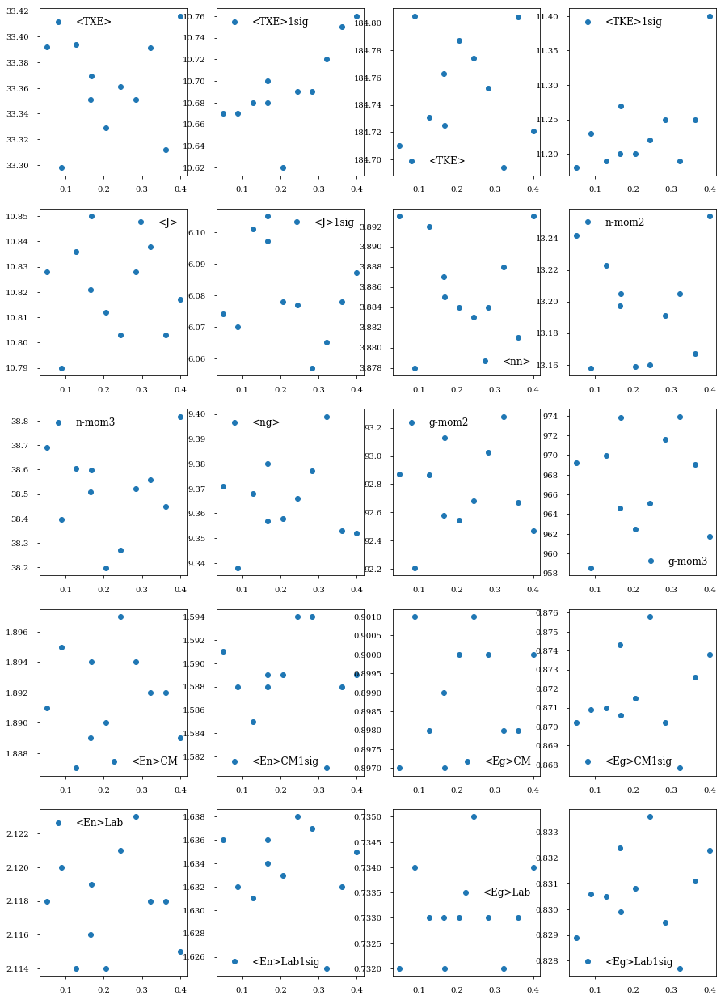

***************************************
Parameter: Abar0
***************************************


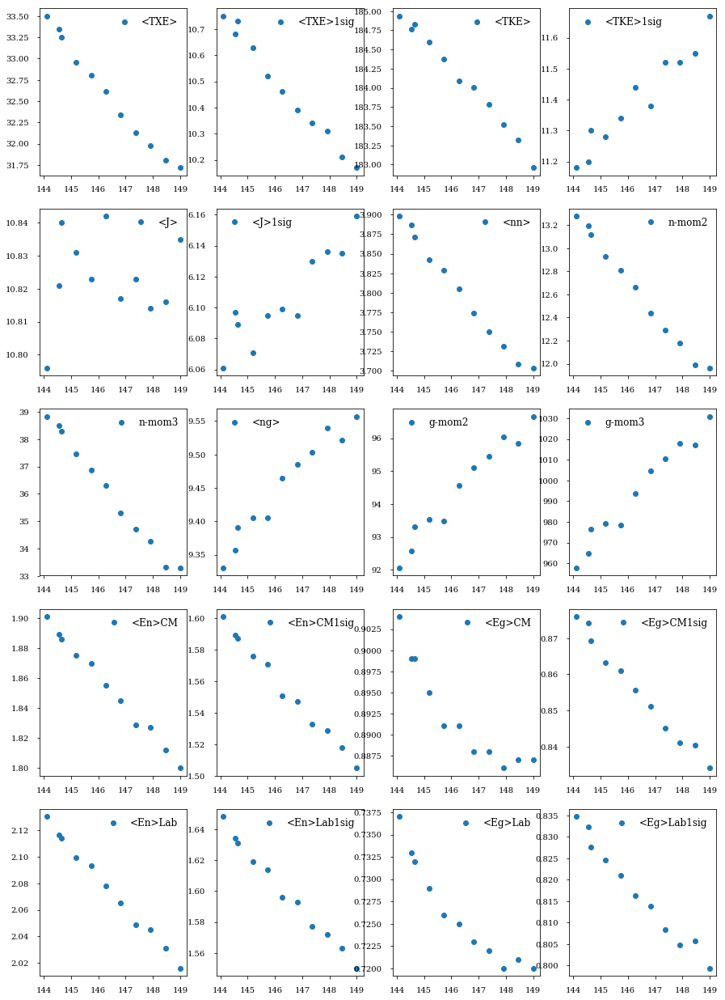

***************************************
Parameter: Abar1
***************************************


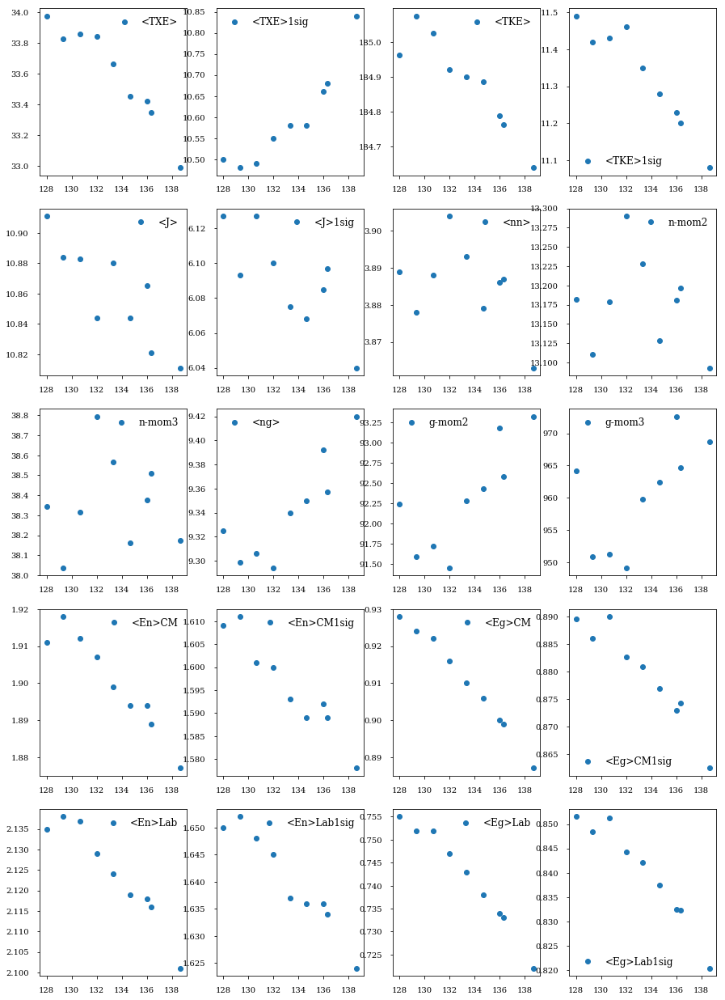

***************************************
Parameter: sigA0
***************************************


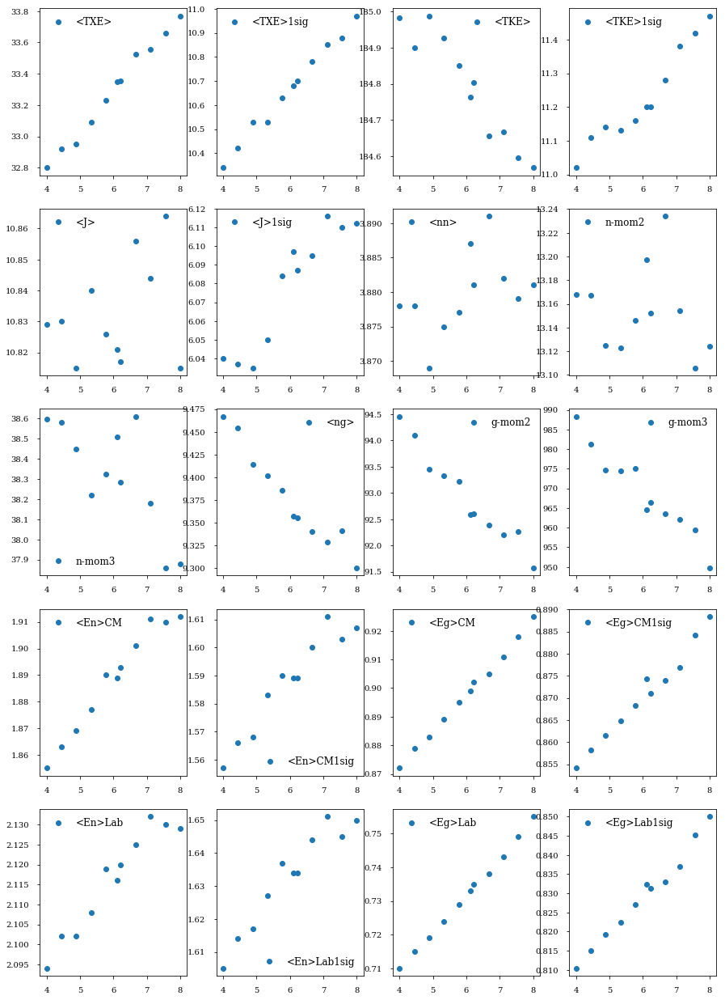

***************************************
Parameter: sigA1
***************************************


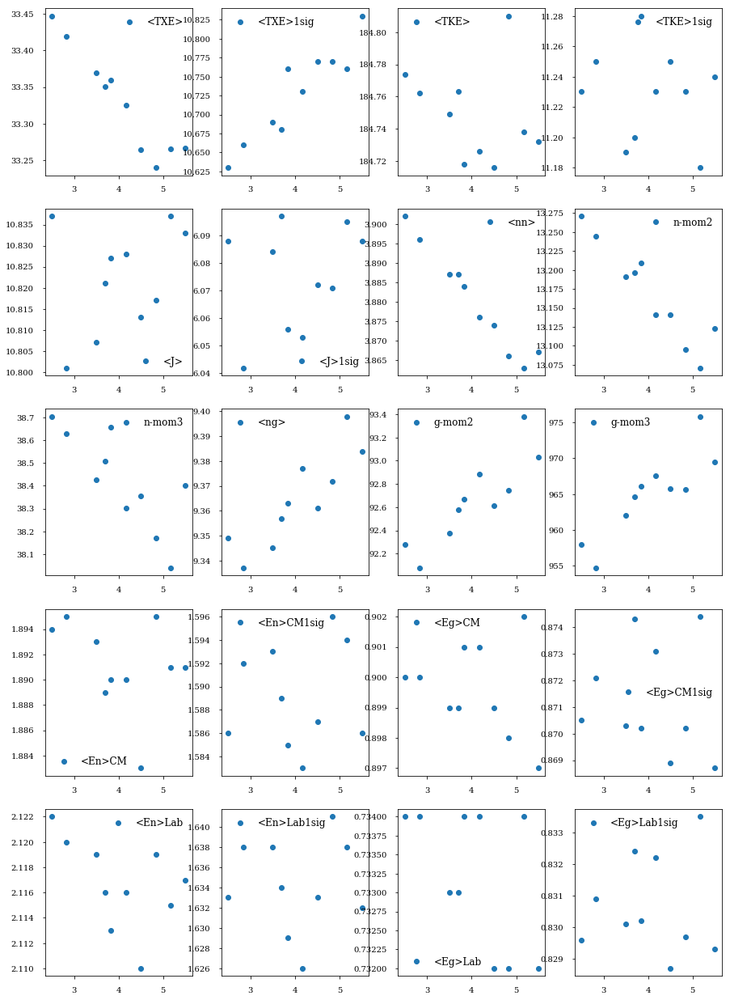

***************************************
Parameter: sigA2
***************************************


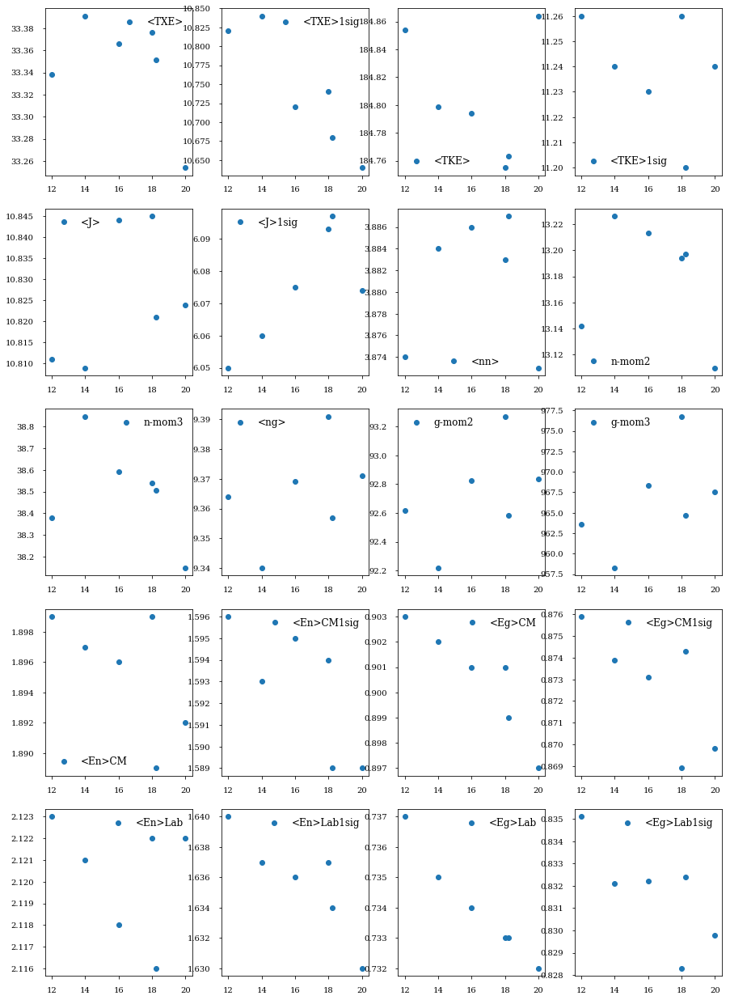

In [15]:
mpl.rcParams['axes.labelsize'] = 10.
mpl.rcParams['xtick.labelsize'] = 10.
mpl.rcParams['ytick.labelsize'] = 10.
mpl.rcParams['lines.linewidth'] = 2.

for x in param_keys:
    print("***************************************")
    print("Parameter: {}".format(x))
    print("***************************************")
    fig, axes = pl.subplots(5,4, figsize=(15, 22))

    i = 1
    for R in response_keys:
        plt.subplot(5,4,i)
        plt.plot(Rdata[x][x],Rdata[x][R], 'o' ,label = R)
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        i+=1
    plt.show()